In [4]:
# new fold 12.449990499904999 d-1
import sys
!{sys.executable} -m pip install PyAstronomy   

  Created wheel for PyAstronomy: filename=PyAstronomy-0.14.0-py3-none-any.whl size=468087 sha256=ff5c41446c4d4a447a5ae7d449ac7ff162a84af7fdc45af70618c9ed8c6b2f62
  Stored in directory: c:\users\admin\appdata\local\pip\cache\wheels\ac\30\91\3fe8dea5506b4e81aa8849f710d958c37caaeeadbbced0aa12
Successfully built PyAstronomy


In [185]:
from astropy.io import fits
import os
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from scipy import optimize
from scipy.interpolate import CubicSpline
from scipy.integrate import simps
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter
import scipy.signal as signal
from PyAstronomy.pyasl import foldAt
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
import pandas as pd
from lmfit import Model

In [186]:
def total_seconds(td):
    total = (td.day - 1) * 24 * 60 *60
    total = total + td.hour * 60 * 60
    total = total + td.minute * 60
    total = total + (td.microsecond/1000000)
    return total

In [187]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

In [188]:
def find_nearest_id(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

In [189]:
def fit(x, m, val, shift):
    """1/x test"""
    return (val/(m*x)) + shift

def fit_line(x, m1, m2, m3,intercept):
    """y=m2x^2 + mx+c"""
    return m3*x*x*x+m2*x*x + m1*x + intercept

In [190]:
MJD = []
counter = 0
path = 'C:/Users/Admin/newJul18/'
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        MJD.append(float(hdul[0].header['MJD-OBS']))
        hdul.close()
        counter = 1

In [191]:
checkMJD = np.sort(MJD)
np.array_equal(MJD, checkMJD)

True

In [192]:
MJD2 = []
counter = 0
path = 'C:/Users/Admin/newMay19/'
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        MJD2.append(float(hdul[0].header['MJD-OBS']))
        hdul.close()
        counter = 1
print(MJD2)

[58617.92702, 58617.92864, 58617.93027, 58617.9319, 58617.93352, 58617.93514, 58617.93677, 58617.93839, 58617.94001, 58617.94163, 58617.94326, 58617.94488, 58617.9465, 58617.94814, 58617.94976, 58617.95138, 58617.95301, 58617.95463, 58617.95625, 58617.95787, 58617.9595, 58617.96112, 58617.96274, 58617.96437, 58617.96599, 58617.96761, 58617.96923, 58617.97087, 58617.97249, 58617.97411, 58617.97574, 58617.97736, 58617.97898, 58617.98061, 58617.98223, 58617.98385, 58617.98547, 58617.98711, 58617.98873, 58617.99035, 58617.99198, 58617.9936, 58617.99522, 58617.99684, 58617.99847, 58618.00009, 58618.00171, 58618.00334, 58618.00496, 58618.00658, 58618.0082, 58618.00984, 58618.01146, 58618.01308, 58618.01471, 58618.01633, 58618.01795, 58618.01958, 58618.0212, 58618.02282, 58618.02444, 58618.02608, 58618.0277, 58618.02932, 58618.03095, 58618.03257, 58618.03419, 58618.03581, 58618.03744, 58618.03906, 58618.04068, 58618.04231, 58618.04393, 58618.04555, 58618.04717, 58618.04881, 58618.05043, 58618

In [193]:
checkMJD = np.sort(MJD2)
np.array_equal(MJD2, checkMJD)

True

In [194]:
fullTime = np.concatenate([np.array(MJD), np.array(MJD2)])
fullTime = fullTime - 58328.87899
print(fullTime)
MJDIn = np.array(MJD) - 58328.87899
MJDTemp1=MJDIn[:-3]
MJDTemp1 = np.array(MJDTemp1)
MJDTemp1 = np.mean(MJDTemp1.reshape(-1, 5), axis=1)
MJDTemp1Last = np.mean(MJDIn[-3:])
MJDTemp1 = np.append(MJDTemp1, MJDTemp1Last)
print(MJDTemp1)

[0.00000000e+00 1.69000000e-03 3.45000000e-03 5.30000000e-03
 6.92000000e-03 8.55000001e-03 1.01700000e-02 1.18000000e-02
 1.39600000e-02 1.55900000e-02 1.72000000e-02 1.88300000e-02
 2.04500000e-02 2.23600000e-02 2.39900000e-02 2.56100000e-02
 2.72400000e-02 2.88700000e-02 3.04800000e-02 3.21100000e-02
 3.37400000e-02 3.53600000e-02 3.69800000e-02 3.86100000e-02
 4.02300000e-02 4.18500000e-02 4.34700000e-02 4.51300000e-02
 4.67500000e-02 4.83800000e-02 5.00000000e-02 5.16200000e-02
 5.32500000e-02 5.48700000e-02 5.64900000e-02 5.81100000e-02
 5.97500000e-02 6.25300000e-02 6.41700000e-02 6.57900000e-02
 6.74100000e-02 6.90400000e-02 7.06600000e-02 7.22800000e-02
 7.39000000e-02 7.55300000e-02 7.71500000e-02 7.87700000e-02
 8.03900000e-02 8.20300000e-02 8.36500000e-02 8.52600000e-02
 8.68900000e-02 8.85200000e-02 9.01400000e-02 9.17700000e-02
 9.33900000e-02 9.50100000e-02 9.66300000e-02 9.82600000e-02
 9.98800000e-02 1.01500000e-01 1.03220000e-01 1.04840000e-01
 1.06470000e-01 1.080900

In [195]:
MJDIn = np.array(MJD2) - 58328.87899
MJDTemp2 = np.array(MJDIn)
MJDTemp2 = np.mean(MJDTemp2.reshape(-1, 5), axis=1)
print(MJDTemp2)

[289.05128  289.059398 289.067518 289.075638 289.083754 289.091872
 289.099994 289.108112 289.116232 289.124346 289.132468 289.140586
 289.148708 289.156824 289.164938 289.173064 289.181178 289.189302
 289.197418 289.205534 289.213656 289.221772 289.229896 289.23801 ]


In [196]:
times = []
countGlob = 1
holder_array = []

path = 'C:/Users/Admin/newJul18/'
consts = []
with open(path+'BCombinedList.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        thisTime = hdul[0].header['ARCHIVEE']
        times.append(thisTime)
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            holder_array = gaussian_filter(typeEx, sigma=1)
        else:
            holder_array = np.vstack((holder_array, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
df = pd.DataFrame(holder_array)

In [197]:
df.shape

(23, 4200)

<Figure size 720x360 with 0 Axes>

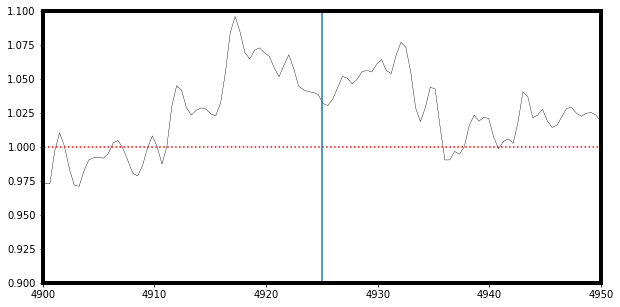

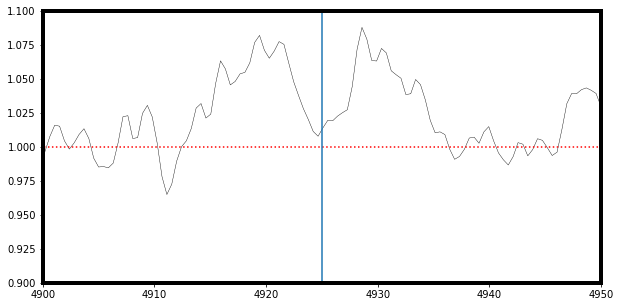

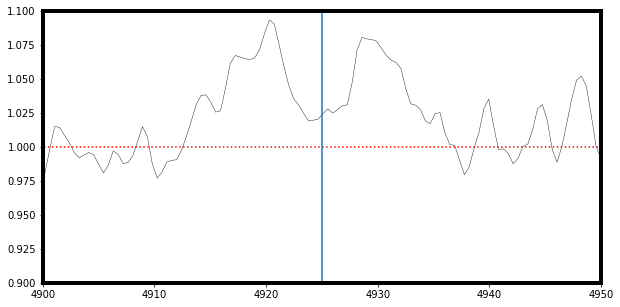

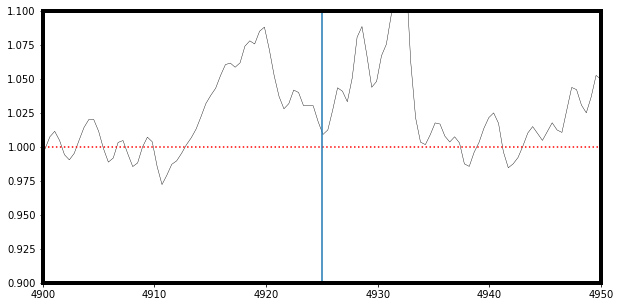

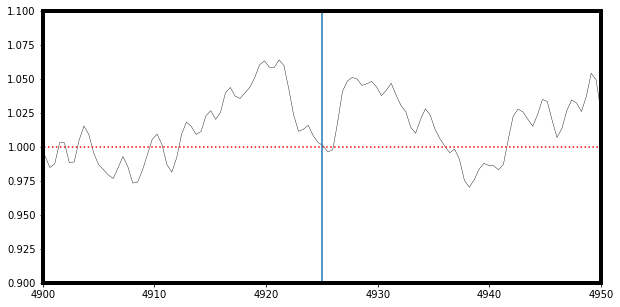

...

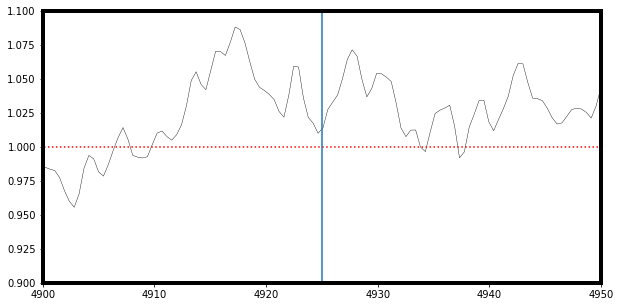

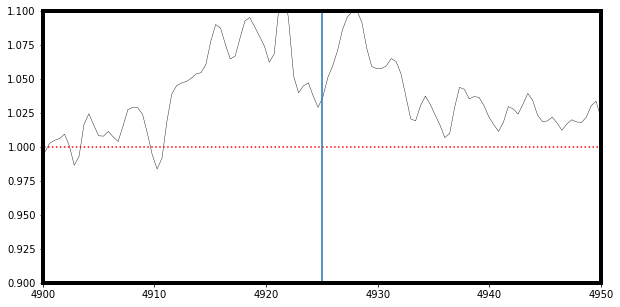

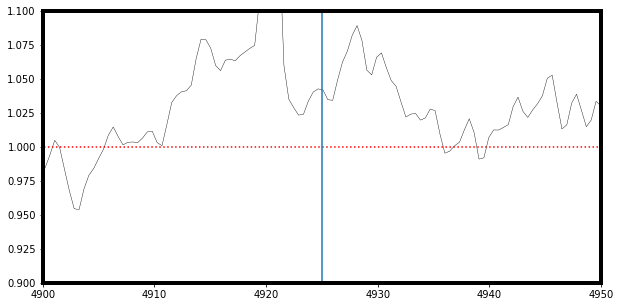

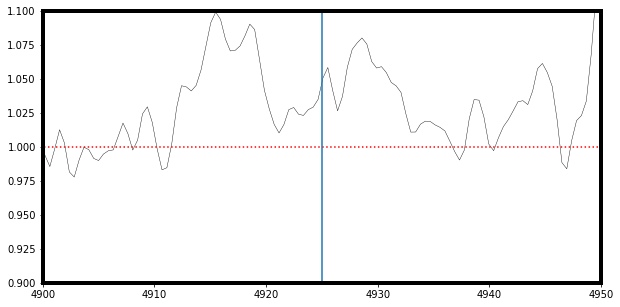

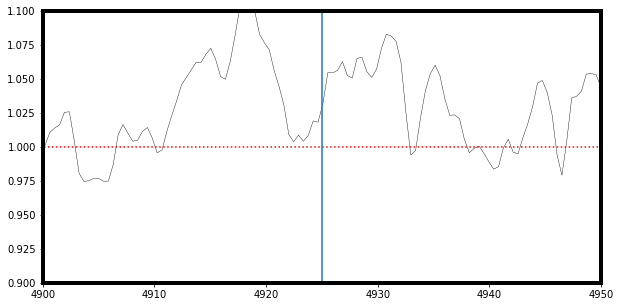

In [198]:
countGlob = 1
xpoints = np.linspace(3625, 5460, 4200)
xpoints = xpoints[665:3446]
holder_array = []
for i in range(23): #800-3800

    spec1 = df.iloc[i]
    spec1 = spec1.transpose()
    non_vig = spec1.iloc[665:]
    non_vig = non_vig.iloc[:-754]
    non_vig = non_vig.reset_index()
    non_vig = non_vig.rename(columns={'index': 'pixels',
                                  i: 'flux'}
                         )
    non_vig.flux = np.clip(non_vig.flux.values, 100, 3000)
    val_g = 10*non_vig.flux.mean()
    intercept_guess_df = non_vig.iloc[:150]
    intercept_guess = intercept_guess_df.flux.mean()


    #resss = np.where(non_vig.pixels.values > 3500)
    

    mod = Model(fit) + Model(fit_line)

    pars = mod.make_params(m=0.01,m3=0, shift=500, m1=-.5, val=val_g, intercept=intercept_guess, m2=0)


    pixels = non_vig.pixels.values
    flux = non_vig.flux.values

    result = mod.fit(flux, pars, x=pixels)

    
    

        
        
        
    normalised_flux = []
    #path = '/home/nwal/Desktop/gd356_isis/jul18/ref/final/contfit/cont' + str(i) + '.png'
    for k in range(0,len(pixels)):
        normalised_flux.append(flux[k] / result.best_fit[k])
    if countGlob == 1:
        holder_array = normalised_flux
        plt.figure(figsize=(10,5))
        #plt.plot(normalised_flux)
        #plt.ylim(0,2)
        
        fig = plt.figure(figsize=(10,5))
        plt.ylim(0.9,1.1)
        plt.plot(xpoints, normalised_flux, 'k', lw=0.4)
        ones = np.ones_like(xpoints)
        plt.plot(xpoints, ones, 'r:')
        plt.plot([4925,4925], [0.9,1.1])
        plt.xlim(4900, 4950)
        plt.show()
        fit_holder = result.best_fit
    #if countGlob < 115: #change to else
    else:
        holder_array = np.vstack((holder_array, normalised_flux))
        fit_holder = np.vstack((fit_holder, result.best_fit))
        fig = plt.figure(figsize=(10,5))
        plt.ylim(0.9,1.1)
        plt.plot(xpoints, normalised_flux, 'k', lw=0.4)
        ones = np.ones_like(xpoints)
        plt.plot(xpoints, ones, 'r:')
        #############plt.xlim(4700, 5000)
        plt.plot([4925,4925], [0.9,1.1])
        plt.xlim(4900, 4950)
        plt.show()
    countGlob +=1

In [199]:
holder_array[0]

array([0.99304629, 0.99116431, 0.98944666, ..., 0.98835489, 1.00742737,
       1.00167656])

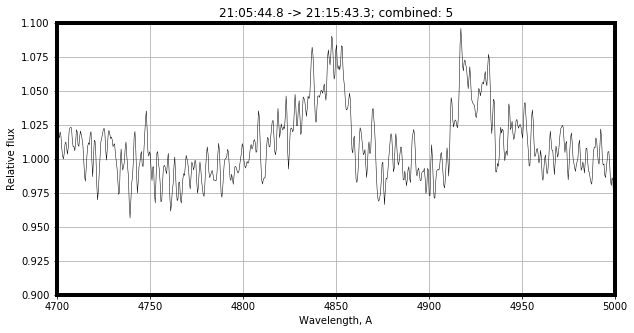

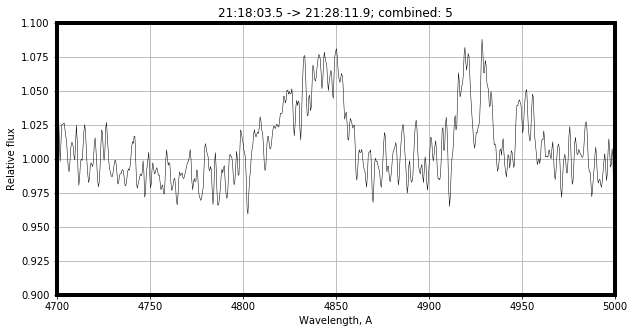

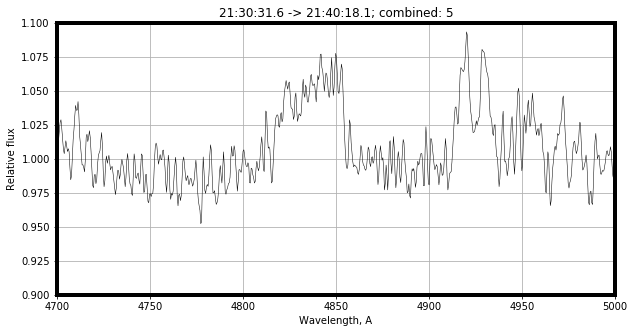

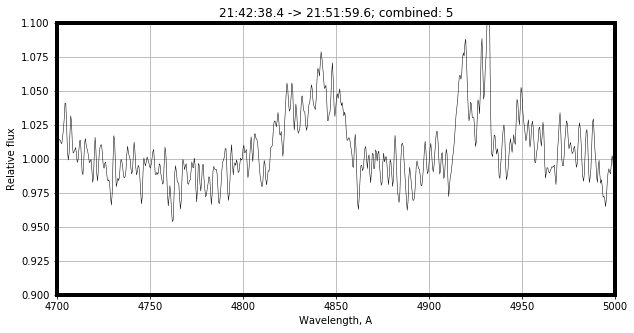

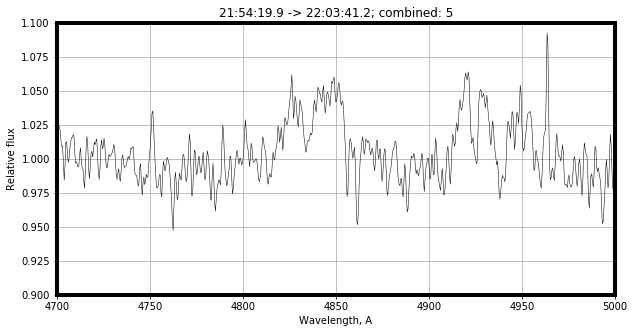

...

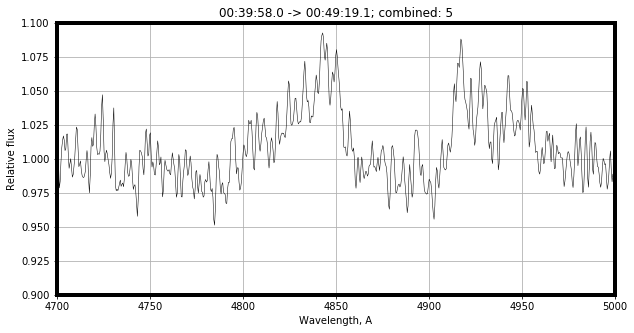

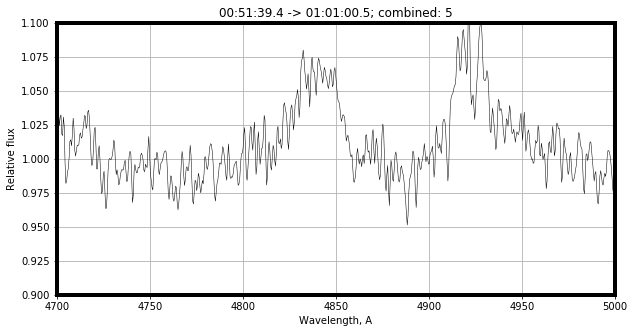

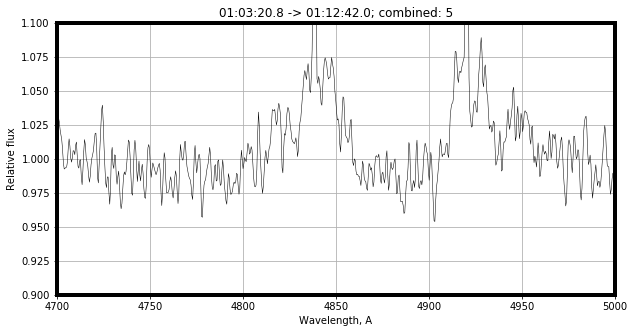

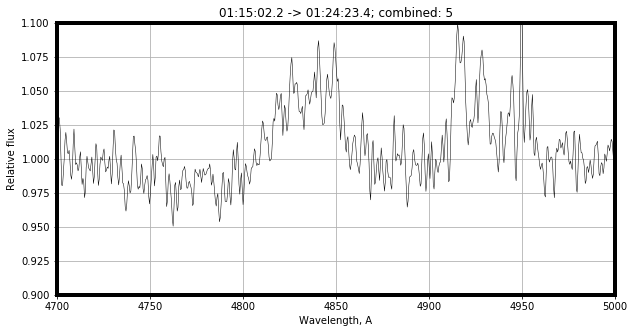

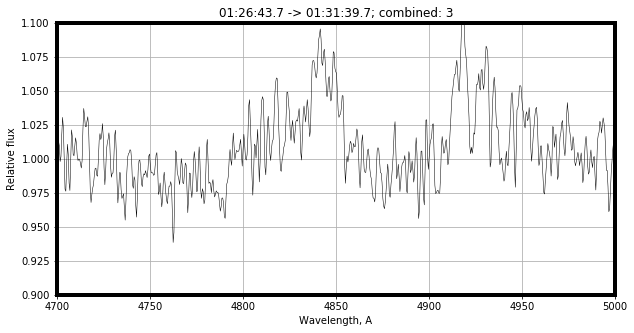

In [200]:
path = 'C:/Users/Admin/newJul18/'
xpoints = np.linspace(3625, 5460, 4200)
xpoints = xpoints[665:3446]
count = 0
dict_count = 0
data_plot = []
data_plot_read = []
with open(path+'BCombinedList.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        comblist = [hdul[0].header['IMCMB001'], hdul[0].header['IMCMB002'], hdul[0].header['IMCMB003']]
        try:
            fourth = hdul[0].header['IMCMB004']
            fifth = hdul[0].header['IMCMB005']
            comblist.append(fourth)
            comblist.append(fifth)
        except KeyError:
            pass
        inputfileS = comblist[0]
        inputfileS = inputfileS.replace(".ms.fits", ".fit")
        filepathIn = path + inputfileS
        hdulIn = fits.open(filepathIn)
        timeStart = hdulIn[0].header['UTOBS']
        hdulIn.close()
        inputfileF = comblist[-1]
        inputfileF = inputfileF.replace(".ms.fits", ".fit")
        filepathIn = path + inputfileF
        hdulIn = fits.open(filepathIn)
        timeFinish = hdulIn[0].header['UTOBS']
        hdulIn.close()
        #print(np.shape(typeEx))
       
        data = holder_array[count]
        
        
        startingID = find_nearest_id(xpoints, 4750)
        finishingID = find_nearest_id(xpoints, 4910)
        startingIDr = find_nearest_id(xpoints, 4825)
        finishingIDr = find_nearest_id(xpoints, 4845)
        if count ==0:
            data_plot = data[startingID: finishingID]
            globalDictionary = {MJDTemp1[dict_count] : data_plot}
            data_plot_read = data[startingIDr: finishingIDr]
            count = 1
        else:
            globalDictionary[MJDTemp1[dict_count]] = data[startingID: finishingID]
            data_plot = np.vstack((data_plot, data[startingID: finishingID]))
            
            data_plot_read = np.vstack((data_plot_read, data[startingIDr: finishingIDr]))
            count = count+1
        plt.figure(figsize=(10,5))
        plt.plot(xpoints,data, 'k-', linewidth=0.5)
        plt.xlim(4700, 5000)
        dict_count += 1
        plt.ylim(0.9,1.1)
        plt.grid()
        titleStr = timeStart + " -> " + timeFinish + "; combined: " + str(len(comblist))
        plt.title(titleStr)
        plt.xlabel("Wavelength, A")
        plt.ylabel("Relative flux")
        line = line.replace(".ms.fits", "")
        plt.show()

        plt.close()


In [201]:
times = []
countGlob = 1
holder_array = []

path = 'C:/Users/Admin/newMay19/'
consts = []
with open(path+'BCombinedList.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        thisTime = hdul[0].header['ARCHIVEE']
        times.append(thisTime)
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            holder_array = gaussian_filter(typeEx, sigma=1)
        else:
            holder_array = np.vstack((holder_array, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
    
df = pd.DataFrame(holder_array)

In [202]:
df.shape

(24, 4200)

<Figure size 720x360 with 0 Axes>

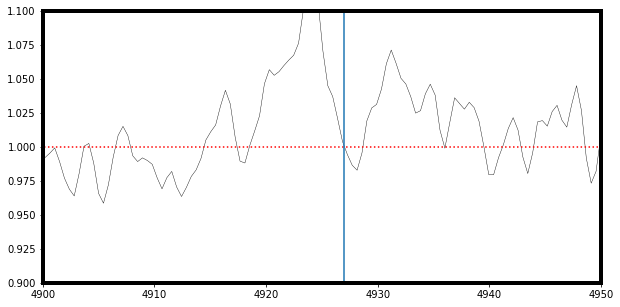

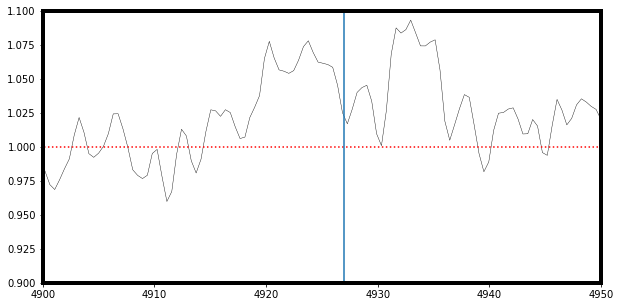

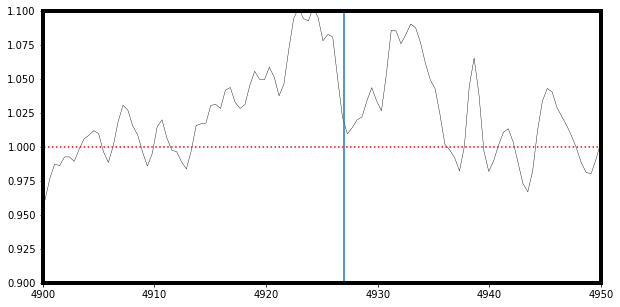

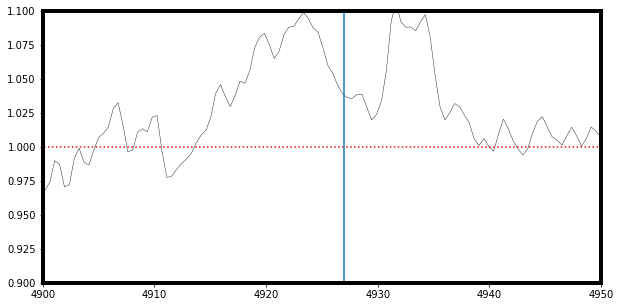

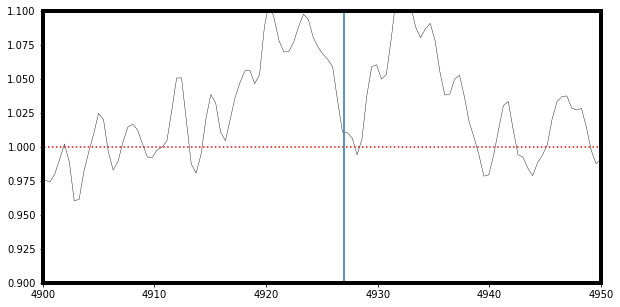

...

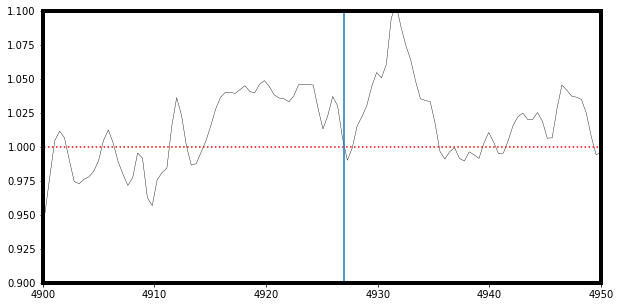

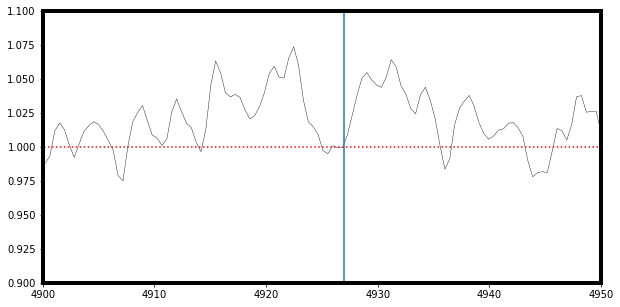

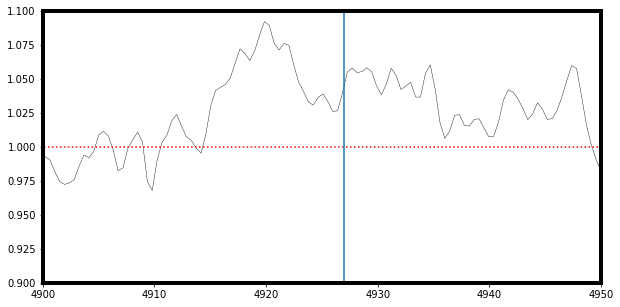

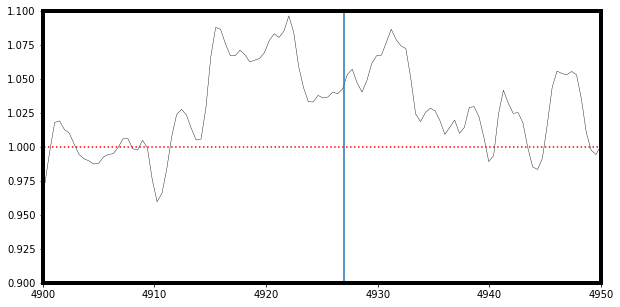

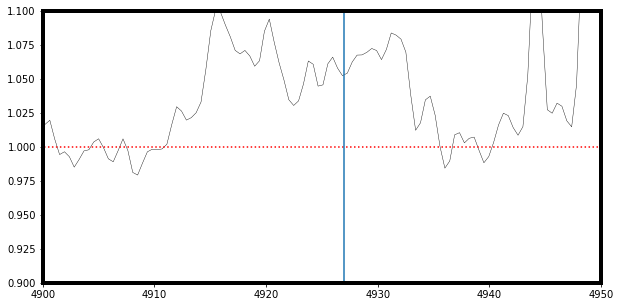

In [203]:
countGlob = 1
xpoints = np.linspace(3625, 5460, 4200)
xpoints = xpoints[665:3446]
holder_array = []
for i in range(24): #800-3800

    spec1 = df.iloc[i]
    spec1 = spec1.transpose()
    non_vig = spec1.iloc[665:]
    non_vig = non_vig.iloc[:-754]
    non_vig = non_vig.reset_index()
    non_vig = non_vig.rename(columns={'index': 'pixels',
                                  i: 'flux'}
                         )
    non_vig.flux = np.clip(non_vig.flux.values, 100, 3000)
    val_g = 10*non_vig.flux.mean()
    intercept_guess_df = non_vig.iloc[:150]
    intercept_guess = intercept_guess_df.flux.mean()


    #resss = np.where(non_vig.pixels.values > 3500)
    

    mod = Model(fit) + Model(fit_line)

    pars = mod.make_params(m=0.01,m3=0, shift=500, m1=-.5, val=val_g, intercept=intercept_guess, m2=0)


    pixels = non_vig.pixels.values
    flux = non_vig.flux.values

    result = mod.fit(flux, pars, x=pixels)


    normalised_flux = []
    #path = '/home/nwal/Desktop/gd356_isis/jul18/ref/final/contfit/cont' + str(i) + '.png'
    for k in range(0,len(pixels)):
        normalised_flux.append(flux[k] / result.best_fit[k])
    if countGlob == 1:
        holder_array = normalised_flux
        plt.figure(figsize=(10,5))
        #plt.plot(normalised_flux)
        #plt.ylim(0,2)
        
        fig = plt.figure(figsize=(10,5))
        plt.ylim(0.9,1.1)
        plt.plot(xpoints, normalised_flux, 'k', lw=0.4)
        ones = np.ones_like(xpoints)
        plt.plot(xpoints, ones, 'r:')
        plt.plot([4927,4927], [0.9,1.1])
        plt.xlim(4900, 4950)
        #plt.xlim(4700, 5000)
        plt.show()
        fit_holder = result.best_fit
    #if countGlob < 115: #change to else
    else:
        holder_array = np.vstack((holder_array, normalised_flux))
        fit_holder = np.vstack((fit_holder, result.best_fit))
        fig = plt.figure(figsize=(10,5))
        plt.ylim(0.9,1.1)
        plt.plot(xpoints, normalised_flux, 'k', lw=0.4)
        ones = np.ones_like(xpoints)
        plt.plot(xpoints, ones, 'r:')
        plt.plot([4927,4927], [0.9,1.1])
        plt.xlim(4900, 4950)
        #plt.xlim(4700, 5000)
        plt.show()
    countGlob +=1

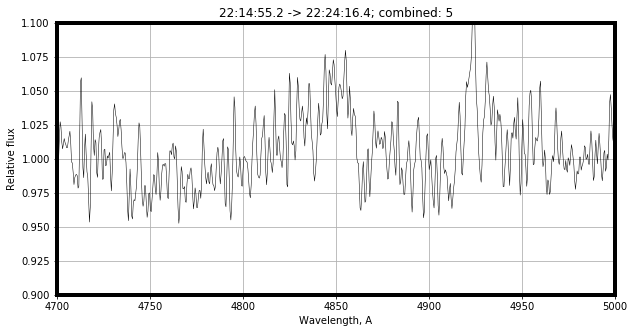

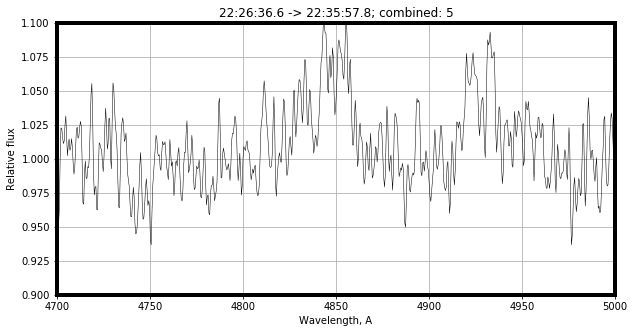

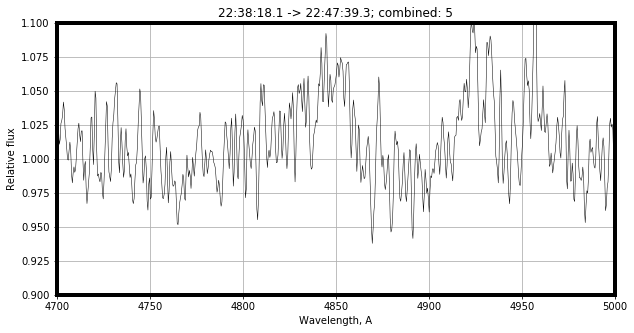

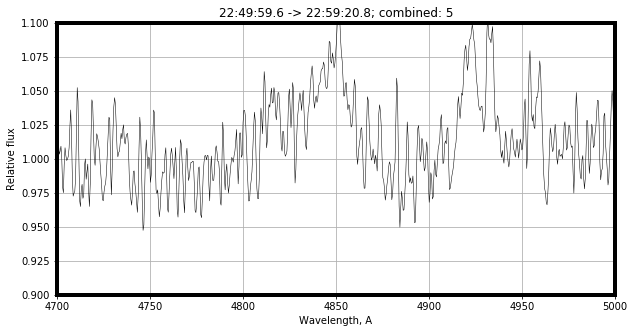

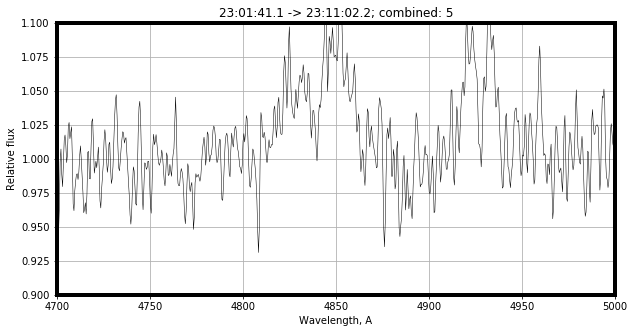

...

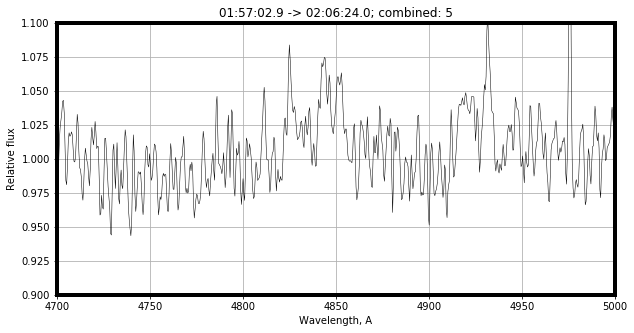

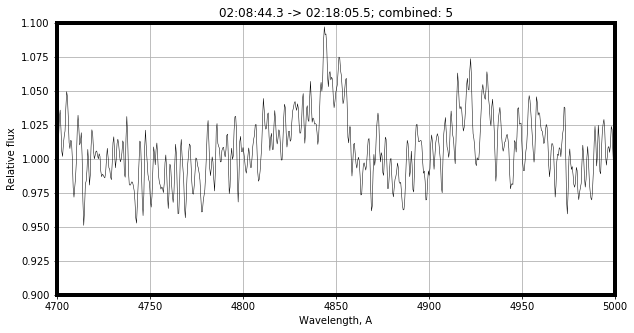

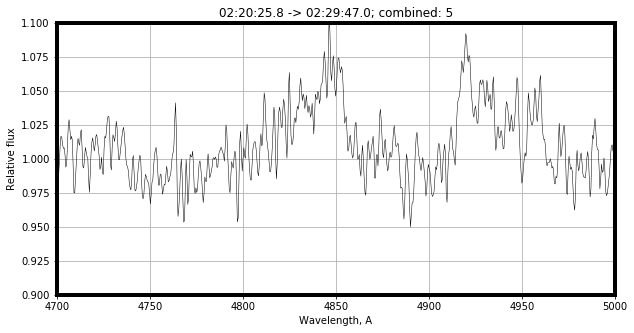

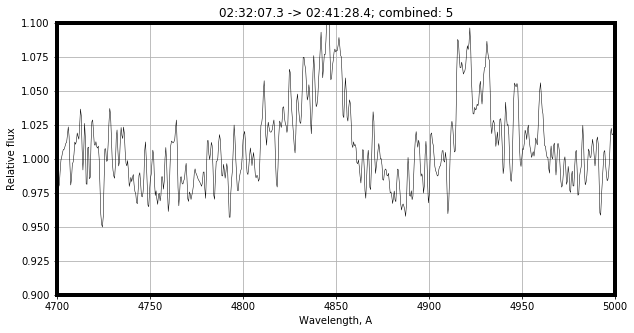

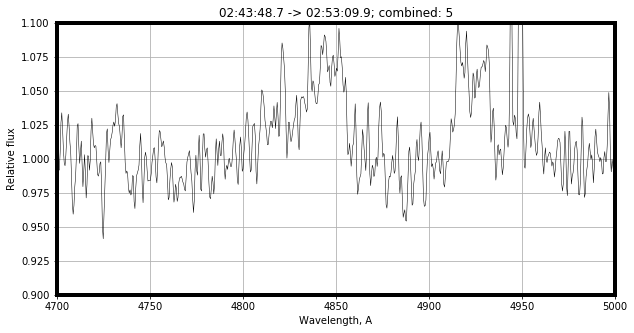

In [204]:
path = 'C:/Users/Admin/newMay19/'
xpoints = np.linspace(3625, 5460, 4200)
xpoints = xpoints[665:3446]
count = 0
data_plot = []
data_plot_read = []
dict_count = 0
with open(path+'BCombinedList.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        comblist = [hdul[0].header['IMCMB001'], hdul[0].header['IMCMB002'], hdul[0].header['IMCMB003']]
        try:
            fourth = hdul[0].header['IMCMB004']
            fifth = hdul[0].header['IMCMB005']
            comblist.append(fourth)
            comblist.append(fifth)
        except KeyError:
            print('WRONG')
            pass
            
        
        inputfileS = comblist[0]
        inputfileS = inputfileS.replace(".ms.fits", ".fit")
        filepathIn = path + inputfileS
        hdulIn = fits.open(filepathIn)
        timeStart = hdulIn[0].header['UTOBS']
        hdulIn.close()
        inputfileF = comblist[-1]
        inputfileF = inputfileF.replace(".ms.fits", ".fit")
        filepathIn = path + inputfileF
        hdulIn = fits.open(filepathIn)
        timeFinish = hdulIn[0].header['UTOBS']
        
        data = holder_array[count]
        
        
        startingID = find_nearest_id(xpoints, 4750)
        finishingID = find_nearest_id(xpoints, 4910)
        startingIDr = find_nearest_id(xpoints, 4825)
        finishingIDr = find_nearest_id(xpoints, 4845)
 
        
        
        if count ==0:
            data_plot = data[startingID: finishingID]
            globalDictionary[MJDTemp2[dict_count]] = data_plot
            data_plot_read = data[startingIDr: finishingIDr]
            
            count = 1
        else:
            globalDictionary[MJDTemp2[dict_count]] = data[startingID: finishingID]
            data_plot = np.vstack((data_plot, data[startingID: finishingID]))
            
            data_plot_read = np.vstack((data_plot_read, data[startingIDr: finishingIDr]))
            count = count+1
        plt.figure(figsize=(10,5))
        dict_count += 1
        plt.plot(xpoints,data, 'k-', linewidth=0.5)
        #plt.plot(x_range, cs(x_range), label='Cubic Spline')
        #print(avgSpl)
        #arrayT = np.asarray(cs(x_range))
        #idx = (np.abs(array - value)).argmin()
    
        #plt.plot(x_range, cs(x_range, 1)+1, label="S'")
        #plt.plot(xpoints, np.linspace(np.average(data), np.average(data), len(xpoints)))
        plt.xlim(4700, 5000)
        plt.ylim(0.9,1.1)
        plt.grid()
        titleStr = timeStart + " -> " + timeFinish + "; combined: " + str(len(comblist))
        plt.title(titleStr)
        plt.xlabel("Wavelength, A")
        plt.ylabel("Relative flux")
        line = line.replace(".ms.fits", "")
        plt.show()
        #print(len(data))

        plt.close()

In [205]:
for key in globalDictionary :
    print (key)

0.003472000002511777
0.012014000002818648
0.020566000002145302
0.028862000002118294
0.03698400000284892
0.04511600000259932
0.05324600000312785
0.06207000000285916
0.07065800000273156
0.07877400000288617
0.08689200000226265
0.0950120000023162
0.10318200000328943
0.1113340000025346
0.11945600000326521
0.12757400000409688
0.13568600000289735
0.14385800000309246
0.15200800000166054
0.16012400000181515
0.1682440000018687
0.17636200000270036
0.18292000000171052
289.0512800000026
289.0593980000034
289.0675180000035
289.0756380000021
289.0837540000022
289.09187200000304
289.0999940000023
289.1081120000017
289.1162320000018
289.1243460000027
289.13246800000195
289.1405860000028
289.1487080000035
289.15682400000367
289.1649380000017
289.17306400000234
289.1811780000033
289.18930200000324
289.1974180000034
289.2055340000021
289.2136560000014
289.22177200000294
289.2298960000029
289.2380100000024


In [222]:
290*(78.2463923683/2/np.pi)

3611.4570361116407

In [220]:
290*12.449990499904999

3610.4972449724496

In [206]:
print(len(MJD2))

120


In [208]:
valTry = 12.449990499904999*2*np.pi
valTry

78.22559738352852

In [209]:
time = pointsX = np.linspace(0,300, 500000)
params = [0.0016080888119978137, 0.9989329927536545, 78.22559738352852, 0.847927100158248]
flux = params[0]+params[1]*np.sin(params[2]*pointsX + params[3])
# ... and add some noise

# Obtain the phases with respect to some
# reference point (in this case T0=217.4)
phases = foldAt(time, (2*np.pi/params[2]), T0=0)

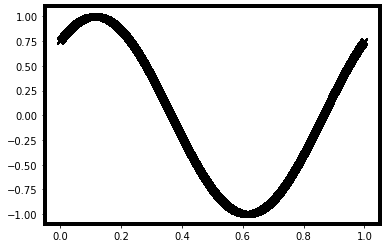

In [210]:
plt.plot(phases, flux, 'kx')

In [211]:
print(len(time))
print(time[:-3])

500000
[0.0000000e+00 6.0000120e-04 1.2000024e-03 ... 2.9999700e+02 2.9999760e+02
 2.9999820e+02]


In [212]:
TimeDictionary = dict(zip(time, phases))

In [213]:
# do individual curves for each obs and check that phases line up!
randArr = []
for key in globalDictionary:
    randArr.append(key)

In [214]:
print(randArr)

[0.003472000002511777, 0.012014000002818648, 0.020566000002145302, 0.028862000002118294, 0.03698400000284892, 0.04511600000259932, 0.05324600000312785, 0.06207000000285916, 0.07065800000273156, 0.07877400000288617, 0.08689200000226265, 0.0950120000023162, 0.10318200000328943, 0.1113340000025346, 0.11945600000326521, 0.12757400000409688, 0.13568600000289735, 0.14385800000309246, 0.15200800000166054, 0.16012400000181515, 0.1682440000018687, 0.17636200000270036, 0.18292000000171052, 289.0512800000026, 289.0593980000034, 289.0675180000035, 289.0756380000021, 289.0837540000022, 289.09187200000304, 289.0999940000023, 289.1081120000017, 289.1162320000018, 289.1243460000027, 289.13246800000195, 289.1405860000028, 289.1487080000035, 289.15682400000367, 289.1649380000017, 289.17306400000234, 289.1811780000033, 289.18930200000324, 289.1974180000034, 289.2055340000021, 289.2136560000014, 289.22177200000294, 289.2298960000029, 289.2380100000024]


In [215]:
ObsPhases = []
anotherDict ={}
for key in globalDictionary :
    initialDif = 1
    for key2 in TimeDictionary:
        dif = abs(key-key2)
        if dif < initialDif:
            initialDif = dif
            phaseForThis = TimeDictionary[key2]
    ObsPhases.append(phaseForThis)
    anotherDict[key] = phaseForThis
print(ObsPhases)

[0.04482005543976888, 0.14940018479922962, 0.2539803141586903, 0.35856044351815103, 0.4631405728776118, 0.560250692997111, 0.6648308223565716, 0.7694109517160325, 0.8814610903154547, 0.978571210434954, 0.08315133979441458, 0.18026145991391385, 0.28484158927337466, 0.38942171863283526, 0.4865318387523345, 0.5911119681117951, 0.6882220882312946, 0.7928022175907554, 0.8899123377102545, 0.9944924670697153, 0.09160258718921455, 0.19618271654867492, 0.2783528181882513, 0.6844213606832454, 0.7890014900422102, 0.8861116101616062, 0.9906917395219352, 0.08780185964133125, 0.19238198900029602, 0.28949210911969203, 0.3940722384795663, 0.4911823585989623, 0.5957624879583818, 0.6928726080777778, 0.7974527374376521, 0.9020328667966169, 0.9991429869160129, 0.10372311627588715, 0.20083323639528317, 0.3054133657547027, 0.4025234858740987, 0.507103615233973, 0.604213735353369, 0.7087938647123337, 0.8059039848317298, 0.910484114191604, 0.007594234311454784]


KeyError: 0.07866399999766145

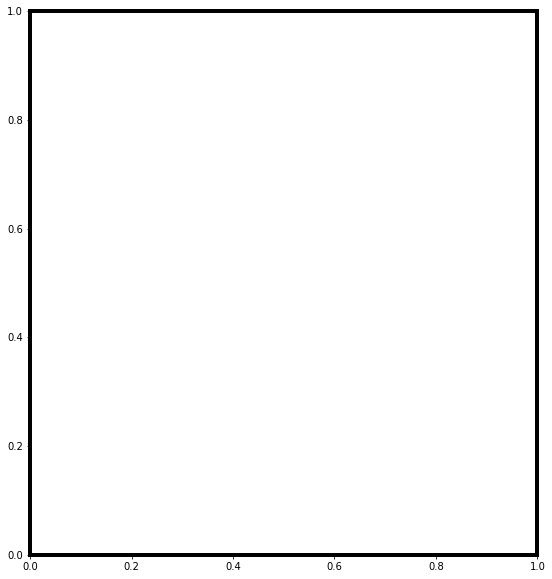

In [216]:
plt.figure(figsize=(20,10))
JulPhase = 0.881695412207046

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.859007443611972

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.3586557608977813 ----------- 0.358655760897781
0.3596311098649494 ----------- 0.359631109864949
0.7696154869264891 ----------- 0.769615486926489
0.7631188408749949 ----------- 0.763118840874995


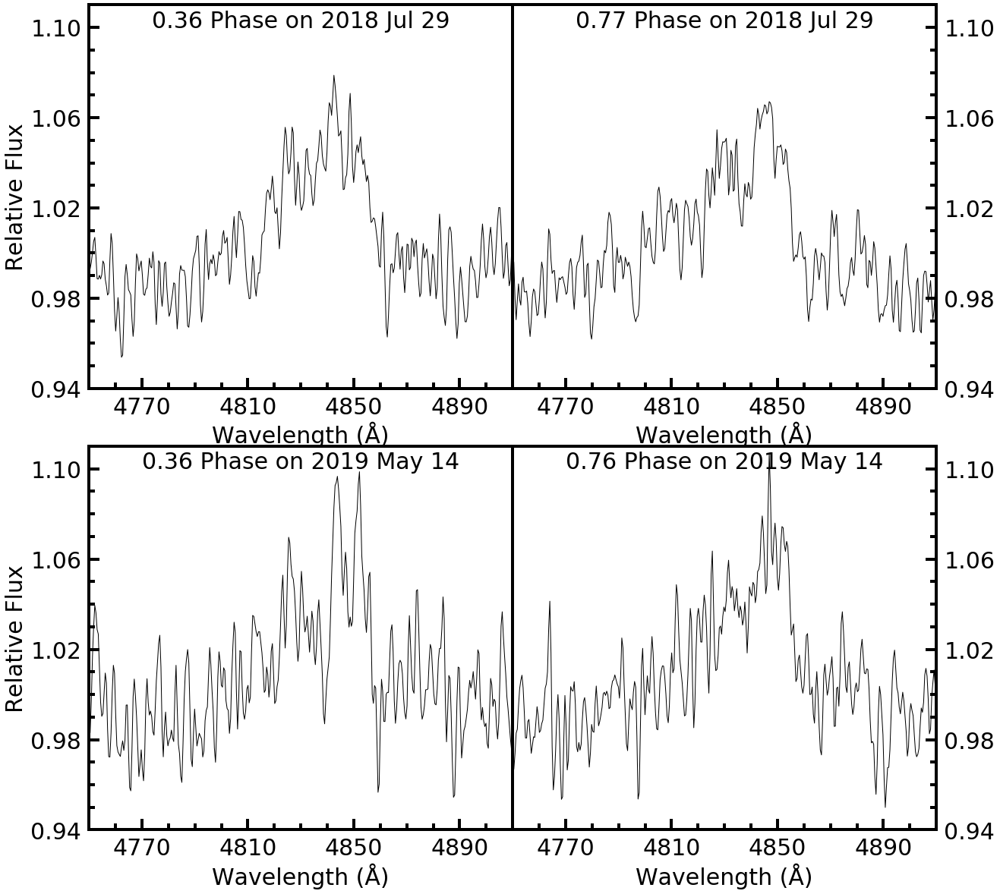

In [71]:
from pylab import *

# Thicken the axes lines and labels
# 
#   Comment by J. R. Lu:
#       I couldn't figure out a way to do this on the 
#       individual plot and have it work with all backends
#       and in interactive mode. So, used rc instead.
# 
rc('axes', linewidth=4)
fig, axs = plt.subplots(2, 2,
                        gridspec_kw={'hspace': 0.15, 'wspace': 0}, figsize=(20,20))


JulPhase = 0.358655760897781

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[0, 0].plot(x,datJul, 'k-', linewidth=1)
axs[0, 0].set_title(str(np.round(JulPhase, decimals=2)) + ' Phase on 2018 Jul 29', fontsize=30,x=0.5, y=0.93)
axs[0,0].set_xlim(4750, 4910)
axs[0,0].set_ylim(0.94,1.11)
MayPhase = 0.359631109864949

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[1, 0].plot(x2, datMay,'k-', linewidth=1)
axs[1, 0].set_title(str(np.round(MayPhase, decimals=2)) +' Phase on 2019 May 14', fontsize=30,x=0.5, y=0.93)
axs[1,0].set_xlim(4750, 4910)
axs[1,0].set_ylim(0.94,1.11)
#sec
JulPhase = 0.769615486926489
for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[0, 1].plot(x,datJul, 'k-', linewidth=1)
axs[0, 1].set_title(str(np.round(JulPhase, decimals=2)) + ' Phase on 2018 Jul 29', fontsize=30,x=0.5, y=0.93)
axs[0,1].set_xlim(4750, 4910)
axs[0,1].set_ylim(0.94,1.11)
MayPhase = 0.763118840874995
for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[1, 1].plot(x2, datMay,'k-', linewidth=1)
axs[1, 1].set_title(str(np.round(MayPhase, decimals=2)) +' Phase on 2019 May 14', fontsize=30,x=0.5, y=0.93)
axs[1,1].set_xlim(4750, 4910)
axs[1,1].set_ylim(0.94,1.11)
axs[0,0].set_ylabel('Relative Flux', fontsize=30)
axs[1,0].set_ylabel('Relative Flux', fontsize=30)
for ax in axs.flat:
    #ax.set(xlabel=)
    #ax.set_xlabel(r"Wavelength ($\AA$)", fontsize=18)
    
    ax.set_xlabel(r"Wavelength (Å)", fontsize=30)
    ax.set_xticks(np.arange(4770, 4930, 40))
    ax.tick_params(labelsize=30, direction='in',pad=10)
    ax.set_yticks(np.arange(0.94, 1.14, 0.04))
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which='both', width=4, direction='in',pad=10)
    ax.tick_params(which='major', length=14, direction='in',pad=10)
    ax.tick_params(which='minor', length=8, direction='in',pad=10)
    
#
axs[0,1].yaxis.tick_right()
axs[1,1].yaxis.tick_right()
#plt.savefig('fig2l.eps' , format='eps',bbox_inches='tight') 

0.04482005543976888 ----------- 0.04482005543976888
0.08780185964133125 ----------- 0.08780185964133125
0.35856044351815103 ----------- 0.35856044351815103
0.3940722384795663 ----------- 0.3940722384795663
0.7694109517160325 ----------- 0.7694109517160325
0.7890014900422102 ----------- 0.7890014900422102


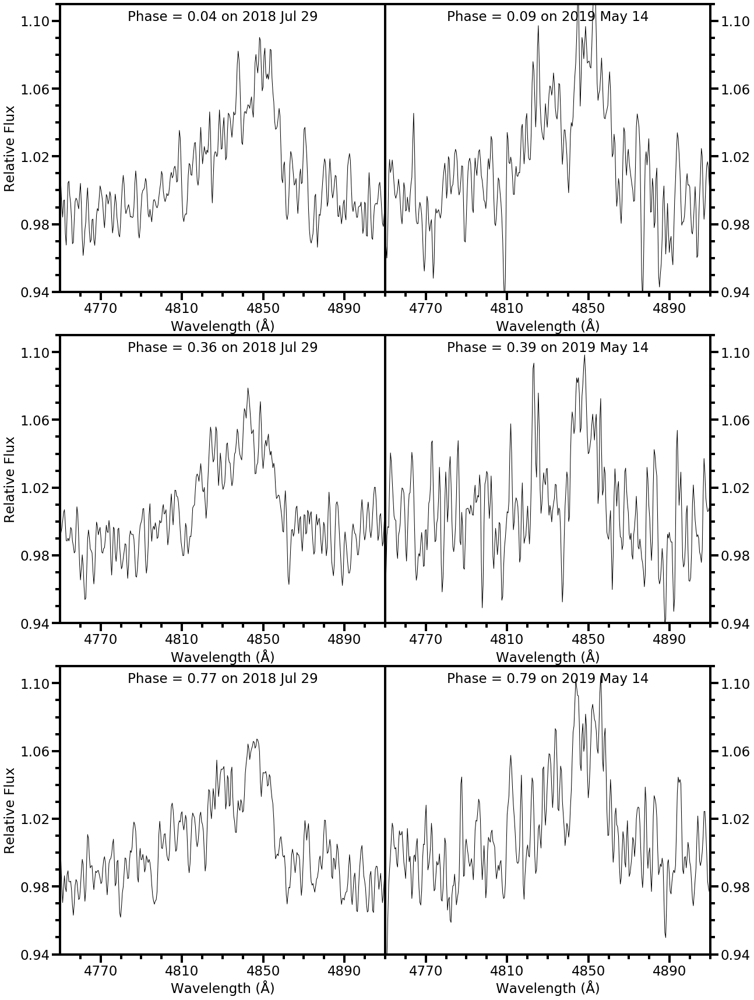

In [219]:
from pylab import *

# Thicken the axes lines and labels
# 
#   Comment by J. R. Lu:
#       I couldn't figure out a way to do this on the 
#       individual plot and have it work with all backends
#       and in interactive mode. So, used rc instead.
# 
rc('axes', linewidth=4)
fig, axs = plt.subplots(3, 2,
                        gridspec_kw={'hspace': 0.15, 'wspace': 0}, figsize=(20,30))















#fig.figure(figsize=(20,10))
JulPhase = 0.04482005543976888
for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[0, 0].plot(x,datJul, 'k-', linewidth=1)
axs[0, 0].set_title('Phase = '+str(np.round(JulPhase, decimals=2)) + ' on 2018 Jul 29', fontsize=23,x=0.5, y=0.93)
axs[0,0].set_xlim(4750, 4910)
axs[0,0].set_ylim(0.94,1.11)
MayPhase = 0.08780185964133125
for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[0, 1].plot(x2, datMay,'k-', linewidth=1)
axs[0, 1].set_title('Phase = '+str(np.round(MayPhase, decimals=2)) +' on 2019 May 14', fontsize=23,x=0.5, y=0.93)
axs[0,1].set_xlim(4750, 4910)
axs[0,1].set_ylim(0.94,1.11)
#first set^
JulPhase = 0.35856044351815103

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[1, 0].plot(x,datJul, 'k-', linewidth=1)
axs[1, 0].set_title('Phase = '+str(np.round(JulPhase, decimals=2)) + ' on 2018 Jul 29', fontsize=23,x=0.5, y=0.93)
axs[1,0].set_xlim(4750, 4910)
axs[1,0].set_ylim(0.94,1.11)
MayPhase = 0.3940722384795663

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[1, 1].plot(x2, datMay,'k-', linewidth=1)
axs[1, 1].set_title('Phase = '+str(np.round(MayPhase, decimals=2)) +' on 2019 May 14', fontsize=23,x=0.5, y=0.93)
axs[1,1].set_xlim(4750, 4910)
axs[1,1].set_ylim(0.94,1.11)
#sec
JulPhase = 0.7694109517160325
for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[2, 0].plot(x,datJul, 'k-', linewidth=1)
axs[2, 0].set_title('Phase = '+str(np.round(JulPhase, decimals=2)) + ' on 2018 Jul 29', fontsize=23,x=0.5, y=0.93)
axs[2,0].set_xlim(4750, 4910)
axs[2,0].set_ylim(0.94,1.11)
MayPhase = 0.7890014900422102
for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[2, 1].plot(x2, datMay,'k-', linewidth=1)
axs[2, 1].set_title('Phase = '+str(np.round(MayPhase, decimals=2)) +' on 2019 May 14', fontsize=23,x=0.5, y=0.93)
axs[2,1].set_xlim(4750, 4910)
axs[2,1].set_ylim(0.94,1.11)
axs[0,0].set_ylabel('Relative Flux', fontsize=23)
axs[1,0].set_ylabel('Relative Flux', fontsize=23)
axs[2,0].set_ylabel('Relative Flux', fontsize=23)
for ax in axs.flat:
    #ax.set(xlabel=)
    #ax.set_xlabel(r"Wavelength ($\AA$)", fontsize=18)
    
    ax.set_xlabel(r"Wavelength (Å)", fontsize=23)
    ax.set_xticks(np.arange(4770, 4930, 40))
    ax.tick_params(labelsize=23)
    ax.set_yticks(np.arange(0.94, 1.14, 0.04))
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which='both', width=4)
    ax.tick_params(which='major', length=14)
    ax.tick_params(which='minor', length=8)
    
#
axs[0,1].yaxis.tick_right()
axs[1,1].yaxis.tick_right()
axs[2,1].yaxis.tick_right()
#plt.savefig('EqMinor.eps', format='eps') 

In [ ]:
dont run below

0.04483197011222266 ----------- 0.04483197011222266
0.044559986573403876 ----------- 0.044559986573403876
0.3586557608977813 ----------- 0.358655760897781
0.3596311098649494 ----------- 0.359631109864949
0.7696154869264891 ----------- 0.769615486926489
0.7631188408749949 ----------- 0.763118840874995


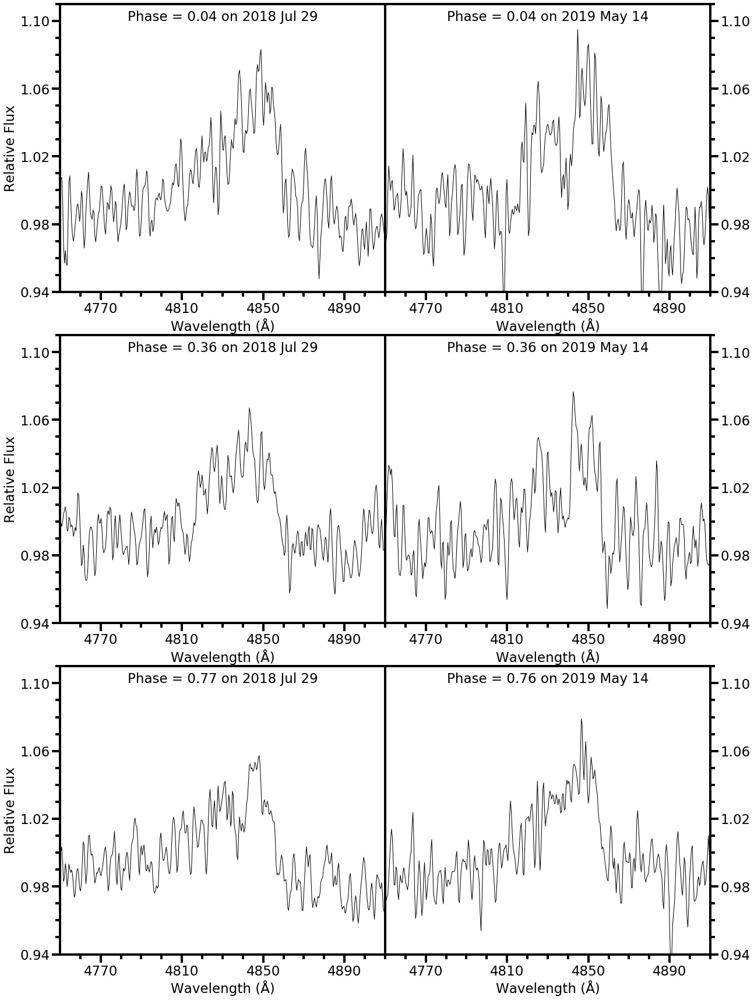

In [108]:
from pylab import *

# Thicken the axes lines and labels
# 
#   Comment by J. R. Lu:
#       I couldn't figure out a way to do this on the 
#       individual plot and have it work with all backends
#       and in interactive mode. So, used rc instead.
# 
rc('axes', linewidth=4)
fig, axs = plt.subplots(3, 2,
                        gridspec_kw={'hspace': 0.15, 'wspace': 0}, figsize=(20,30))

#fig.figure(figsize=(20,10))
JulPhase = 0.04483197011222266
for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[0, 0].plot(x,datJul, 'k-', linewidth=1)
axs[0, 0].set_title('Phase = '+str(np.round(JulPhase, decimals=2)) + ' on 2018 Jul 29', fontsize=23,x=0.5, y=0.93)
axs[0,0].set_xlim(4750, 4910)
axs[0,0].set_ylim(0.94,1.11)
MayPhase = 0.044559986573403876
for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[0, 1].plot(x2, datMay,'k-', linewidth=1)
axs[0, 1].set_title('Phase = '+str(np.round(MayPhase, decimals=2)) +' on 2019 May 14', fontsize=23,x=0.5, y=0.93)
axs[0,1].set_xlim(4750, 4910)
axs[0,1].set_ylim(0.94,1.11)
#first set^
JulPhase = 0.358655760897781

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[1, 0].plot(x,datJul, 'k-', linewidth=1)
axs[1, 0].set_title('Phase = '+str(np.round(JulPhase, decimals=2)) + ' on 2018 Jul 29', fontsize=23,x=0.5, y=0.93)
axs[1,0].set_xlim(4750, 4910)
axs[1,0].set_ylim(0.94,1.11)
MayPhase = 0.359631109864949

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[1, 1].plot(x2, datMay,'k-', linewidth=1)
axs[1, 1].set_title('Phase = '+str(np.round(MayPhase, decimals=2)) +' on 2019 May 14', fontsize=23,x=0.5, y=0.93)
axs[1,1].set_xlim(4750, 4910)
axs[1,1].set_ylim(0.94,1.11)
#sec
JulPhase = 0.769615486926489
for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[2, 0].plot(x,datJul, 'k-', linewidth=1)
axs[2, 0].set_title('Phase = '+str(np.round(JulPhase, decimals=2)) + ' on 2018 Jul 29', fontsize=23,x=0.5, y=0.93)
axs[2,0].set_xlim(4750, 4910)
axs[2,0].set_ylim(0.94,1.11)
MayPhase = 0.763118840874995
for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[2, 1].plot(x2, datMay,'k-', linewidth=1)
axs[2, 1].set_title('Phase = '+str(np.round(MayPhase, decimals=2)) +' on 2019 May 14', fontsize=23,x=0.5, y=0.93)
axs[2,1].set_xlim(4750, 4910)
axs[2,1].set_ylim(0.94,1.11)
axs[0,0].set_ylabel('Relative Flux', fontsize=23)
axs[1,0].set_ylabel('Relative Flux', fontsize=23)
axs[2,0].set_ylabel('Relative Flux', fontsize=23)
for ax in axs.flat:
    #ax.set(xlabel=)
    #ax.set_xlabel(r"Wavelength ($\AA$)", fontsize=18)
    
    ax.set_xlabel(r"Wavelength (Å)", fontsize=23)
    ax.set_xticks(np.arange(4770, 4930, 40))
    ax.tick_params(labelsize=23)
    ax.set_yticks(np.arange(0.94, 1.14, 0.04))
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which='both', width=4)
    ax.tick_params(which='major', length=14)
    ax.tick_params(which='minor', length=8)
    
#
axs[0,1].yaxis.tick_right()
axs[1,1].yaxis.tick_right()
axs[2,1].yaxis.tick_right()
#plt.savefig('EqMinor.eps', format='eps') 

0.04483197011222266 ----------- 0.04483197011222266
0.044559986573403876 ----------- 0.044559986573403876
0.3586557608977813 ----------- 0.358655760897781
0.3596311098649494 ----------- 0.359631109864949
0.7696154869264891 ----------- 0.769615486926489
0.7631188408749949 ----------- 0.763118840874995


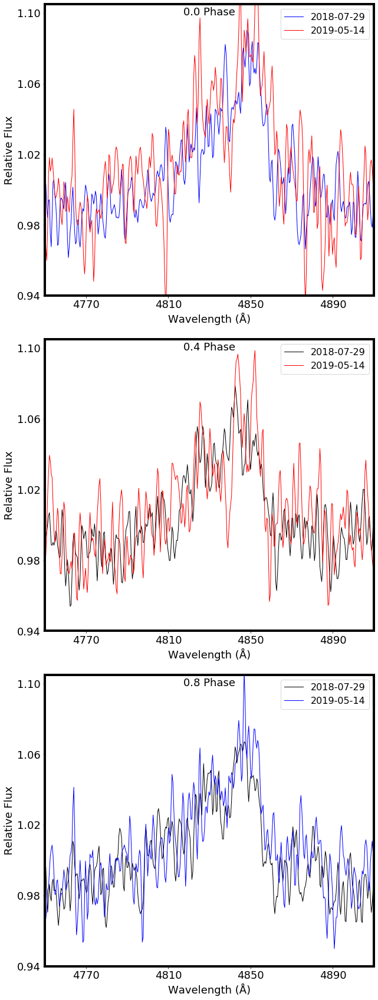

In [73]:
fig, axs = plt.subplots(3, 1,
                        gridspec_kw={'hspace': 0.15}, figsize=(10,30))

#fig.figure(figsize=(20,10))
JulPhase = 0.04483197011222266
for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[0].plot(x,datJul, 'b-', linewidth=1, label='2018-07-29')
axs[0].set_title(str(np.round(JulPhase, decimals=2)) + ' Phase on 2018-07-29', fontsize=18,x=0.5, y=0.95)
axs[0].set_xlim(4750, 4910)
axs[0].set_ylim(0.94,1.105)
MayPhase = 0.044559986573403876
for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[0].plot(x2, datMay,'r-', linewidth=1, label = '2019-05-14')
axs[0].set_title(str(np.round(MayPhase, decimals=1)) +' Phase', fontsize=18 ,x=0.5, y=0.95)
axs[0].set_xlim(4750, 4910)
axs[0].set_ylim(0.94,1.105)
axs[0].legend(prop={'size': 16})
#first set^
JulPhase = 0.358655760897781

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[1].plot(x,datJul, 'k-', linewidth=1, label='2018-07-29')
axs[1].set_title(str(np.round(JulPhase, decimals=2)) + ' Phase on 2018-07-29', fontsize=18,x=0.5, y=0.95)
axs[1].set_xlim(4750, 4910)
axs[1].set_ylim(0.94,1.105)
MayPhase = 0.359631109864949

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[1].plot(x2, datMay,'r-', linewidth=1, label = '2019-05-14')
axs[1].set_title(str(np.round(MayPhase, decimals=1)) +' Phase' , fontsize=18,x=0.5, y=0.95)
axs[1].set_xlim(4750, 4910)
axs[1].set_ylim(0.94,1.105)
axs[1].legend(prop={'size': 16})
#sec
JulPhase = 0.769615486926489
for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)
datJul = globalDictionary[JulIn]
x = np.linspace(4750,4910, len(datJul))
axs[2].plot(x,datJul, 'k-', linewidth=1, label='2018-07-29')
axs[2].set_title(str(np.round(JulPhase, decimals=2)) + ' Phase on 2018-07-29', fontsize=18,x=0.5, y=0.95)
axs[2].set_xlim(4750, 4910)
axs[2].set_ylim(0.94,1.105)
MayPhase = 0.763118840874995
for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)
x2 = np.linspace(4750,4910, len(datMay))
datMay = globalDictionary[MayIn]
axs[2].plot(x2, datMay,'b-', linewidth=1, label = '2019-05-14')
axs[2].set_title(str(np.round(MayPhase, decimals=1)) +' Phase' , fontsize=18,x=0.5, y=0.95)
axs[2].set_xlim(4750, 4910)
axs[2].set_ylim(0.94,1.105)
axs[0].set_ylabel('Relative Flux', fontsize=18)
axs[1].set_ylabel('Relative Flux', fontsize=18)
axs[2].set_ylabel('Relative Flux', fontsize=18)
axs[2].legend(prop={'size': 16})
for ax in axs.flat:
    #ax.set(xlabel=)
    #ax.set_xlabel(r"Wavelength ($\AA$)", fontsize=18)
    
    ax.set_xlabel(r"Wavelength (Å)", fontsize=18)
    ax.set_xticks(np.arange(4770, 4930, 40))
    ax.tick_params(labelsize=18)
    ax.set_yticks(np.arange(0.94, 1.14, 0.04))
#plt.savefig('Top.eps', format='eps') 

0.04483197011222266 ----------- 0.04483197011222266
0.044559986573403876 ----------- 0.044559986573403876
May in is 289.0837540000022
What 366


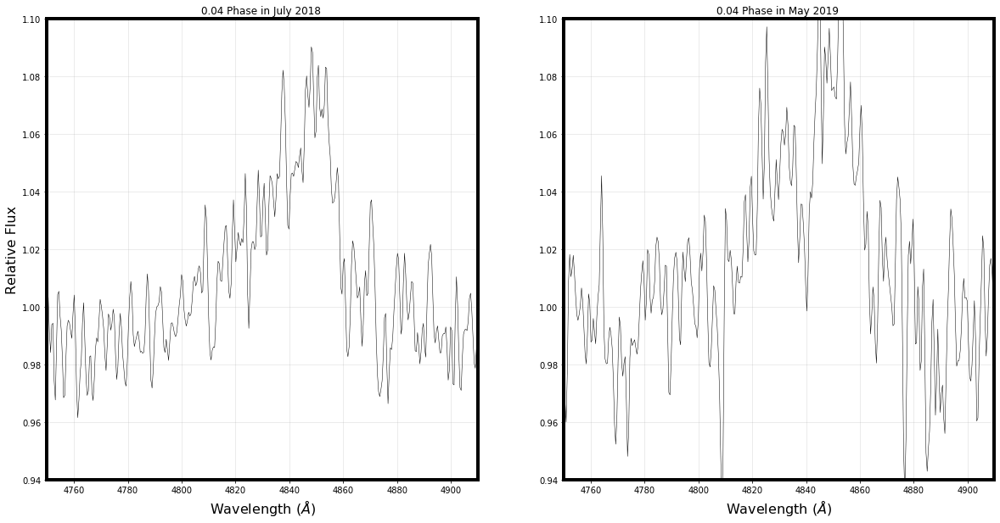

In [74]:
plt.figure(figsize=(20,10))
JulPhase = 0.04483197011222266
for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.044559986573403876
for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
plt.ylim(0.94,1.1)
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed1.png'
#plt.savefig(path, dpi=200)

0.2540478306359284 ----------- 0.254047830635928
0.24630385207819927 ----------- 0.246303852078199
May in is 289.0999940000023
What 366


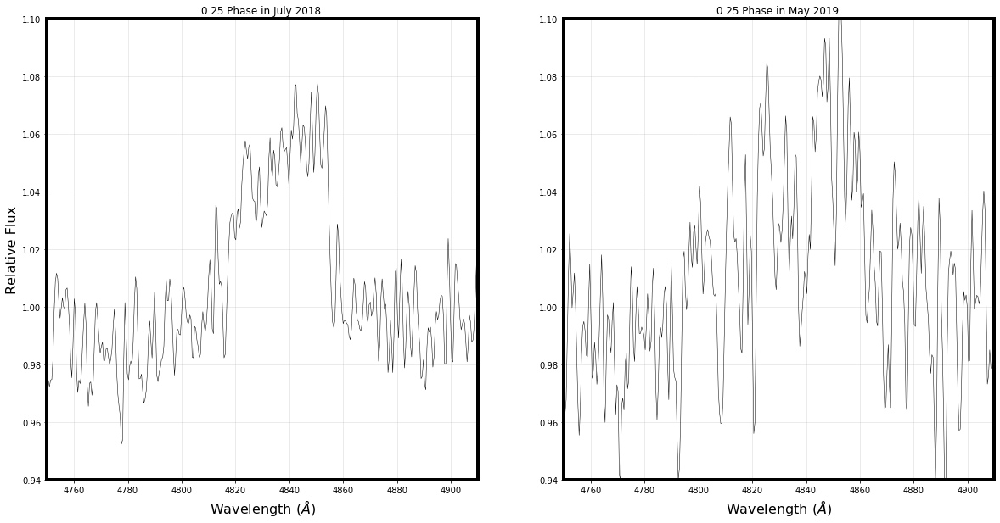

In [75]:
plt.figure(figsize=(20,10))
JulPhase = 0.254047830635928
for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.ylim(0.94,1.1)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.246303852078199
for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
plt.ylim(0.94,1.1)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed2.png'
#plt.savefig(path, dpi=200)

0.46326369115963417 ----------- 0.463263691159634
0.4642390401272678 ----------- 0.464239040127268
May in is 289.1974180000034
What 366


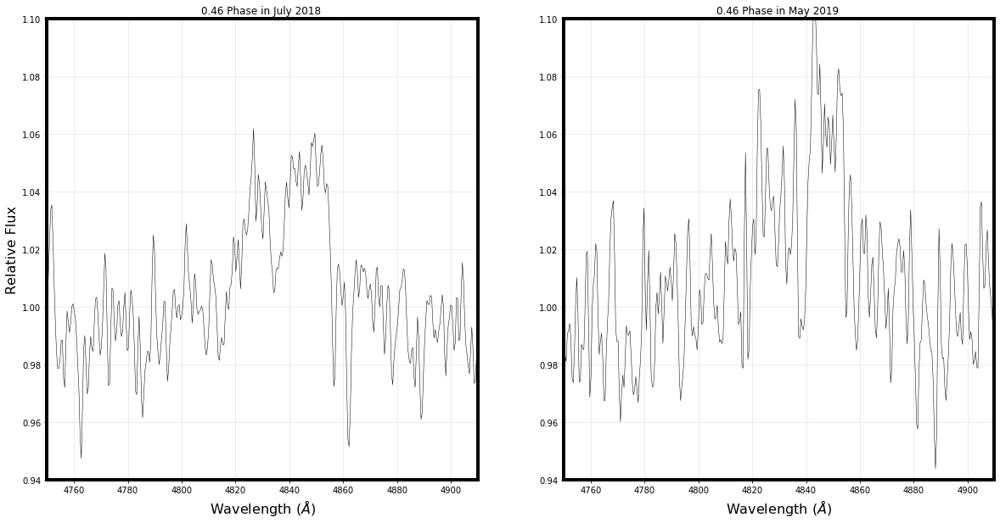

In [76]:
plt.figure(figsize=(20,10))
JulPhase = 0.463263691159634

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.464239040127268

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed3.png'
#plt.savefig(path, dpi=200)

0.7696154869264891 ----------- 0.769615486926489
0.7631188408749949 ----------- 0.763118840874995
May in is 289.22177200000294
What 366


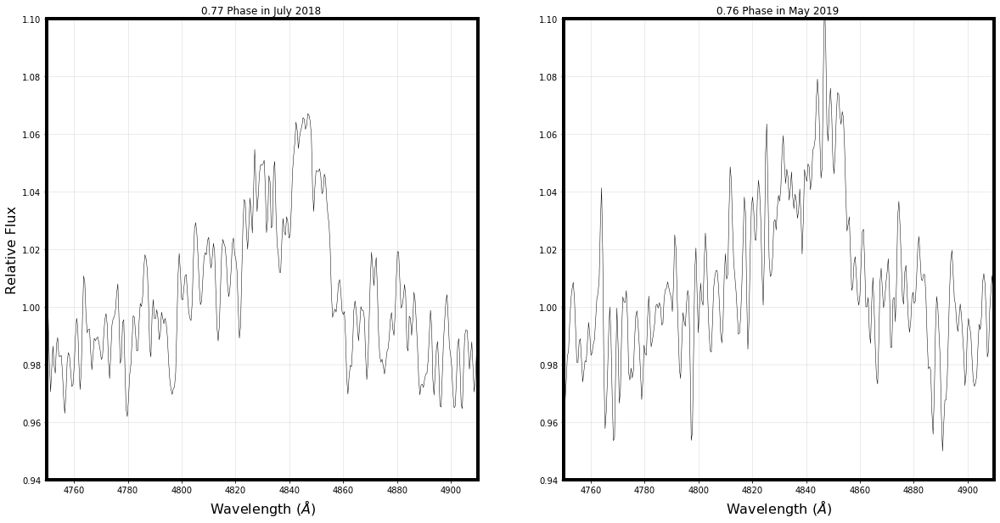

In [77]:
plt.figure(figsize=(20,10))
JulPhase = 0.769615486926489

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.763118840874995

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed4.png'
#plt.savefig(path, dpi=200)

0.8904147397320556 ----------- 0.890414739732056
0.8677267711373133 ----------- 0.867726771137313
May in is 289.2298960000029
What 366


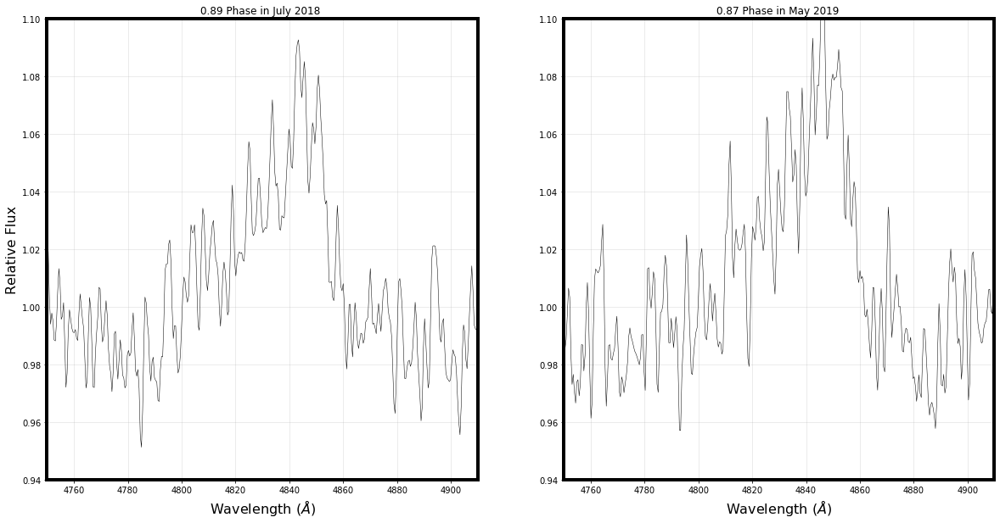

In [78]:
plt.figure(figsize=(20,10))
JulPhase = 0.890414739732056

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.ylim(0.94,1.1)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.867726771137313

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed5.png'
#plt.savefig(path, dpi=200)

0.2789584807046519 ----------- 0.278958480704652
0.26249517462201766 ----------- 0.262495174622018
May in is 289.1811780000033
What 366


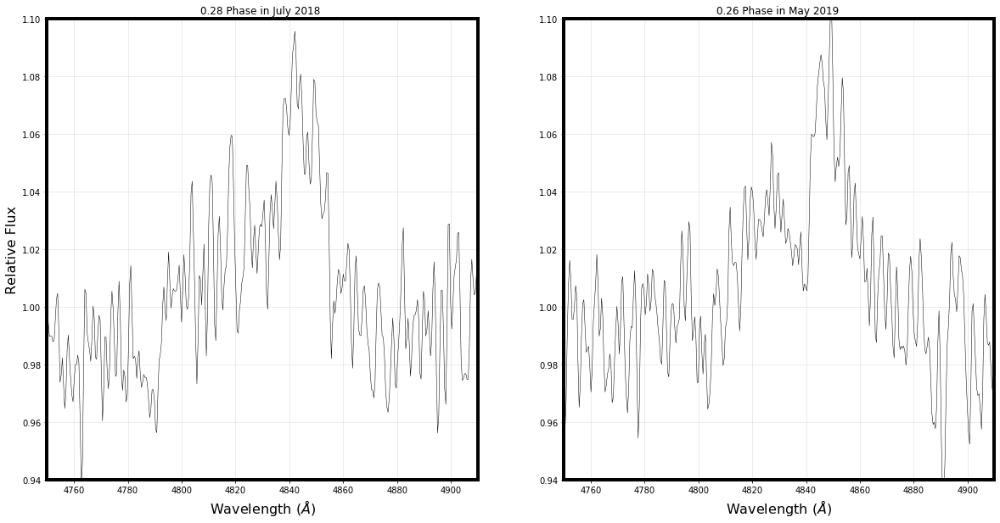

In [79]:
plt.figure(figsize=(20,10))
JulPhase = 0.278958480704652

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.262495174622018

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed6.png'
#plt.savefig(path, dpi=200)

0.7932788044889068 ----------- 0.793278804488907
0.745680185825222 ----------- 0.745680185825222
May in is 289.0593980000034
What 366


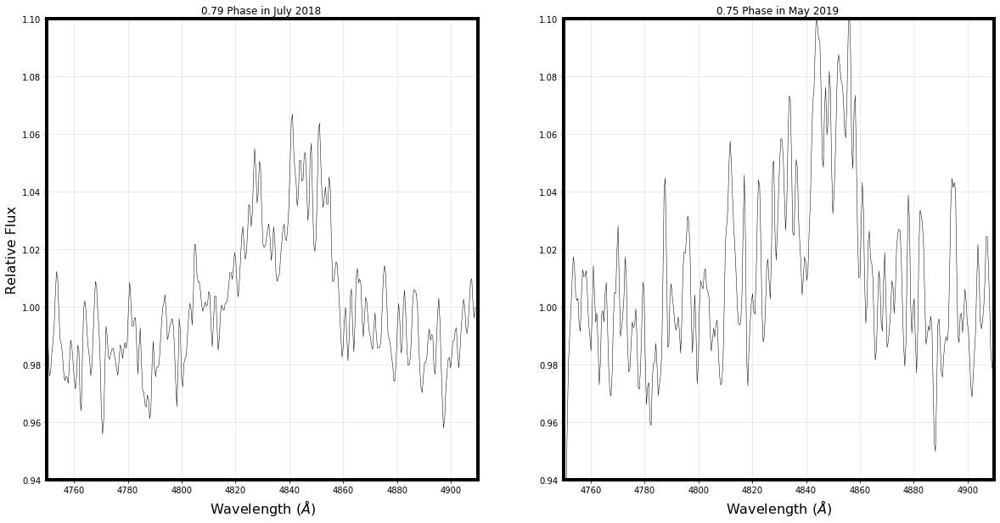

In [80]:
plt.figure(figsize=(20,10))
JulPhase = 0.793278804488907

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.745680185825222

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed7.png'
#plt.savefig(path, dpi=200)

0.3897910734789025 ----------- 0.389791073478903
0.3509117823405177 ----------- 0.350911782340518
May in is 289.1081120000017
What 366


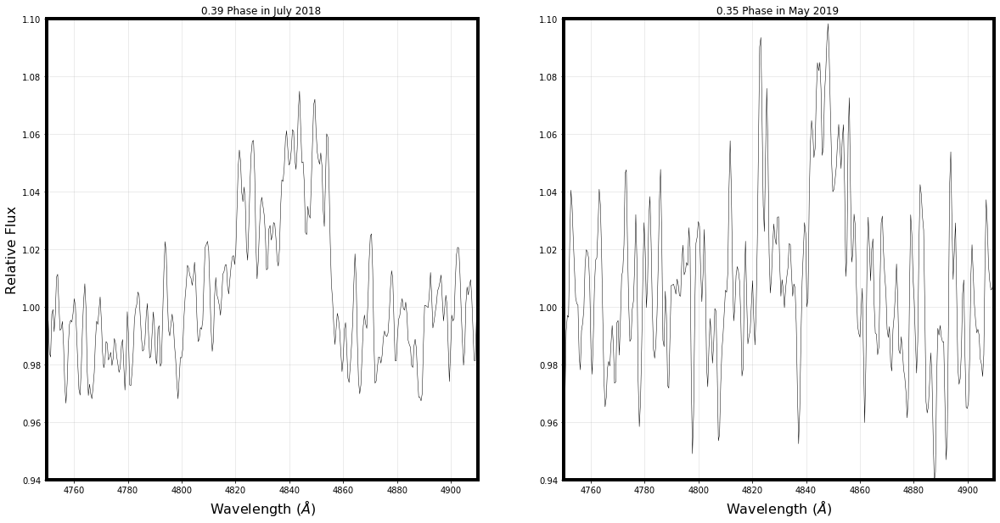

In [81]:
plt.figure(figsize=(20,10))
JulPhase = 0.389791073478903

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.350911782340518

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed8.png'
#plt.savefig(path, dpi=200)

0.6886708742270538 ----------- 0.688670874227054
0.6659829056320632 ----------- 0.665982905632063
May in is 289.2136560000014
What 366


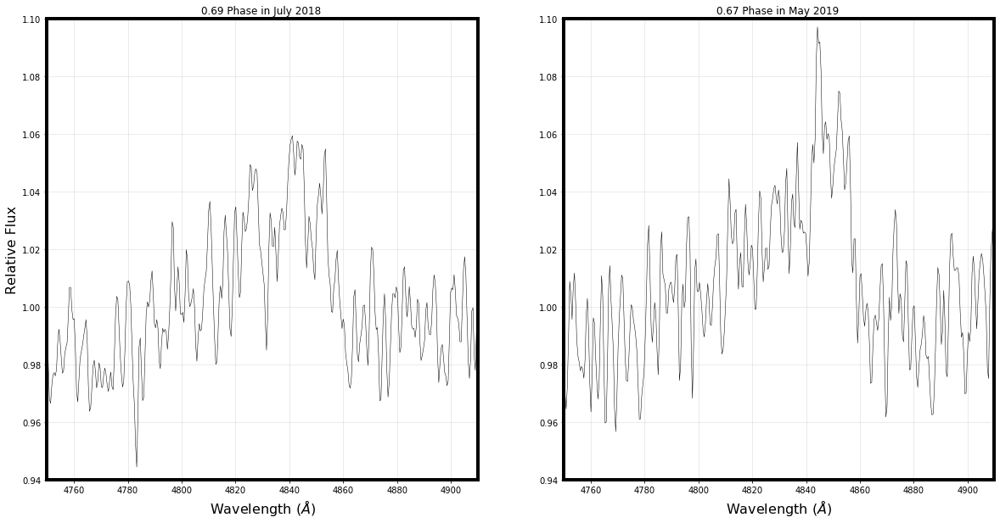

In [82]:
plt.figure(figsize=(20,10))
JulPhase = 0.688670874227054

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.665982905632063

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed9.png'
#plt.savefig(path, dpi=200)

0.6650075566646362 ----------- 0.665007556664636
0.6410722555638131 ----------- 0.641072255563813
May in is 289.0512800000026
What 366


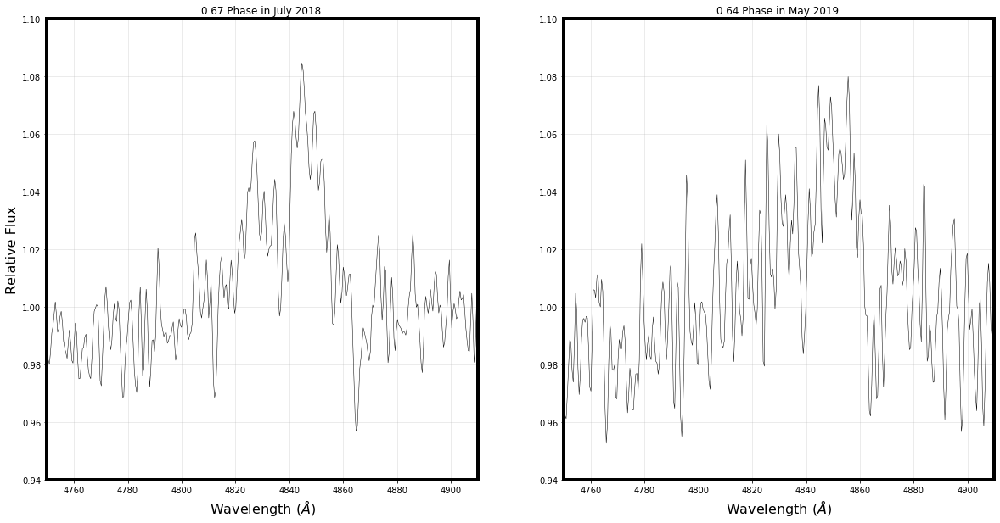

In [83]:
plt.figure(figsize=(20,10))
JulPhase = 0.665007556664636

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.641072255563813

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed10.png'
#plt.savefig(path, dpi=200)

0.9788313474501948 ----------- 0.978831347450195
0.9474240513304721 ----------- 0.947424051330472
May in is 289.0756380000021
What 366


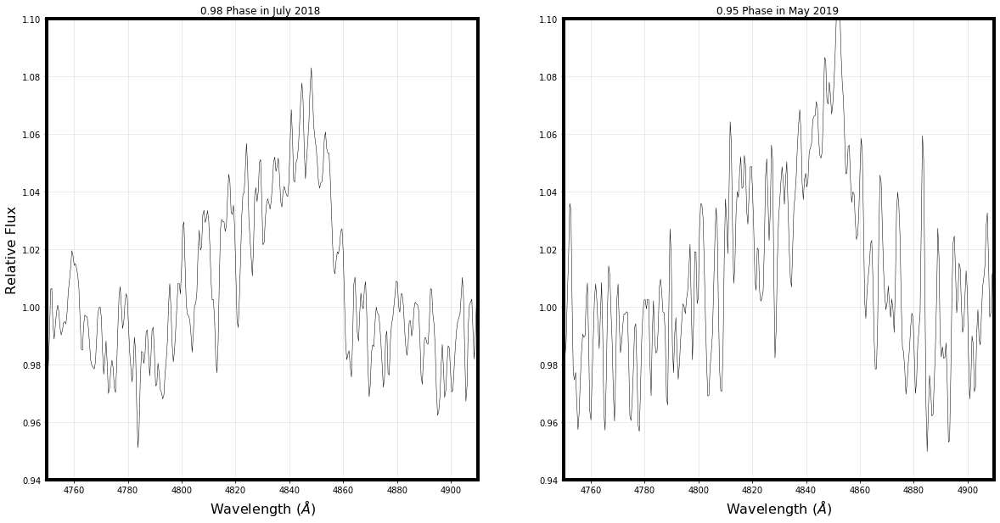

In [84]:
plt.figure(figsize=(20,10))
JulPhase = 0.978831347450195

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.947424051330472

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed11.png'
#plt.savefig(path, dpi=200)

0.14943990037407556 ----------- 0.149439900374076
0.14916791683526753 ----------- 0.149167916835268
May in is 289.09187200000304
What 366


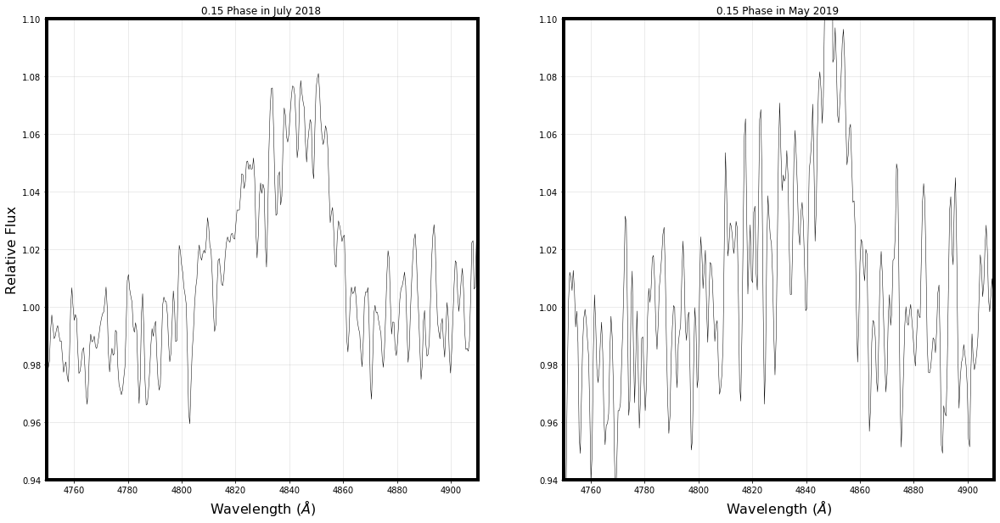

In [85]:
plt.figure(figsize=(20,10))
JulPhase = 0.149439900374076

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.149167916835268

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed12.png'
#plt.savefig(path, dpi=200)

0.3586557608977813 ----------- 0.358655760897781
0.3596311098649494 ----------- 0.359631109864949
May in is 289.18930200000324
What 366


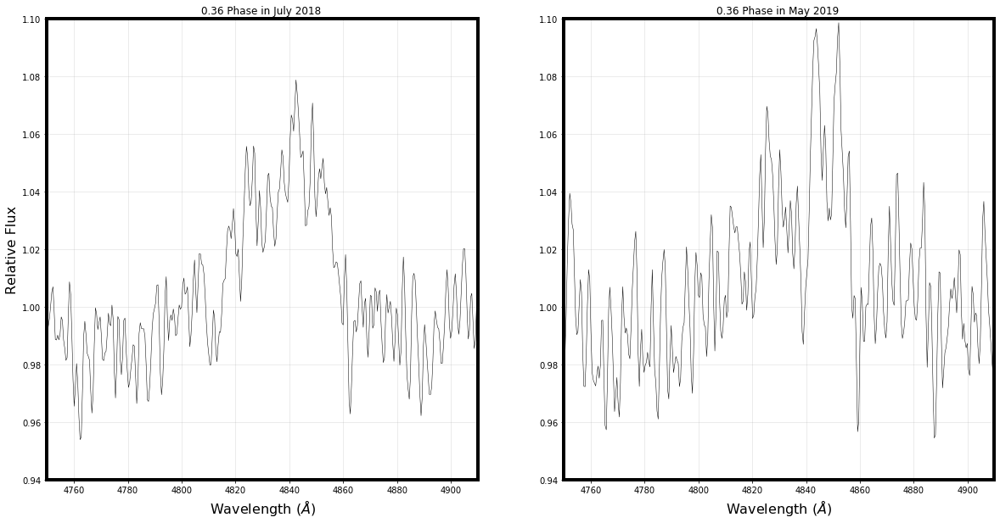

In [86]:
plt.figure(figsize=(20,10))
JulPhase = 0.358655760897781

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.359631109864949

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed13.png'
#plt.savefig(path, dpi=200)

0.5603996264027833 ----------- 0.560399626402783
0.5613749753706543 ----------- 0.561374975370654
May in is 289.2055340000021
What 366


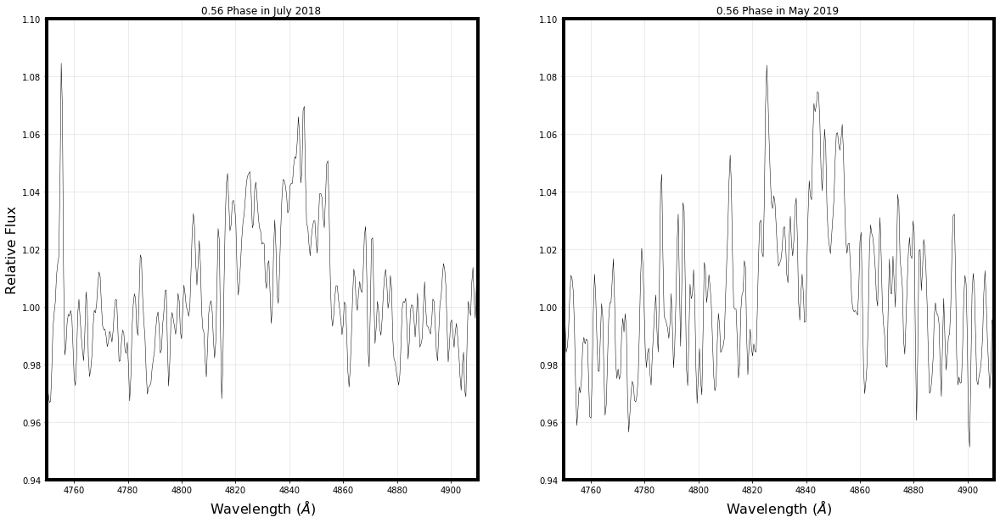

In [87]:
plt.figure(figsize=(20,10))
JulPhase = 0.560399626402783

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.561374975370654

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed14.png'
#plt.savefig(path, dpi=200)

0.8816954122070458 ----------- 0.881695412207046
0.8428161210681537 ----------- 0.842816121068154
May in is 289.0675180000035
What 366


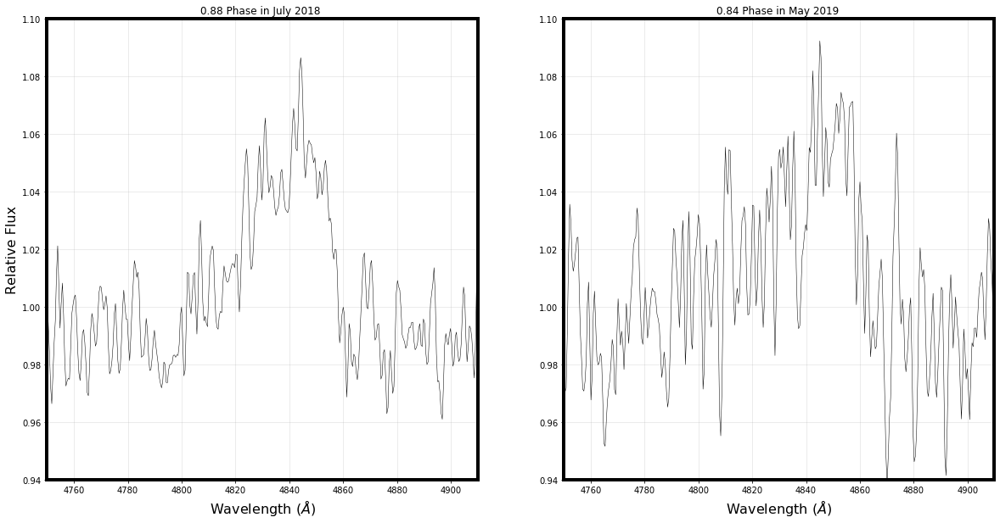

In [88]:
plt.figure(figsize=(20,10))
JulPhase = 0.881695412207046

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.842816121068154

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed15.png'
#plt.savefig(path, dpi=200)

0.48692700872205164 ----------- 0.486927008722052
0.4480477175834494 ----------- 0.448047717583449
May in is 289.1162320000018
What 366


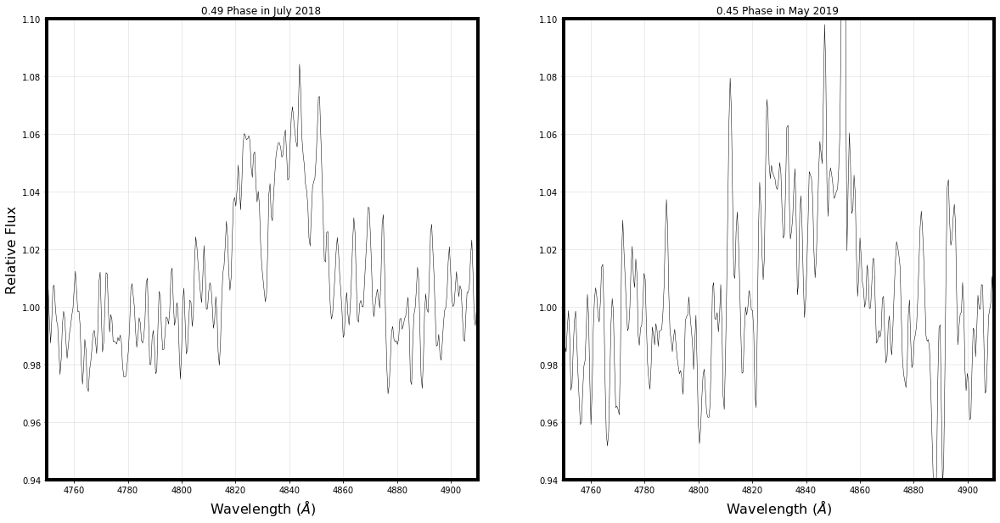

In [89]:
plt.figure(figsize=(20,10))
JulPhase = 0.486927008722052

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.448047717583449

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed16.png'
#plt.savefig(path, dpi=200)

0.5915349389839044 ----------- 0.591534938983904
0.5526556478453131 ----------- 0.552655647845313
May in is 289.1243460000027
What 366


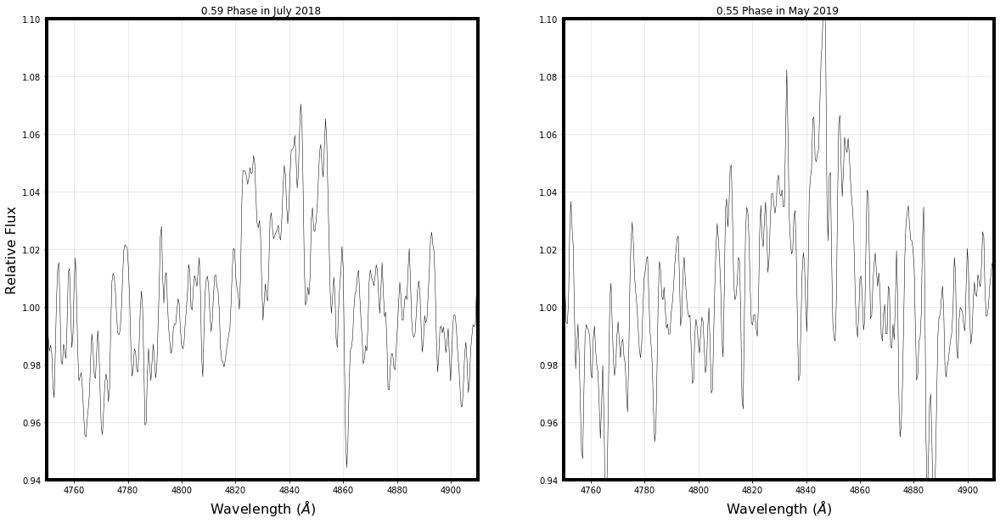

In [90]:
plt.figure(figsize=(20,10))
JulPhase = 0.591534938983904

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.552655647845313

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed17.png'
#plt.savefig(path, dpi=200)

0.6886708742270538 ----------- 0.688670874227054
0.6659829056320632 ----------- 0.665982905632063
May in is 289.2136560000014
What 366


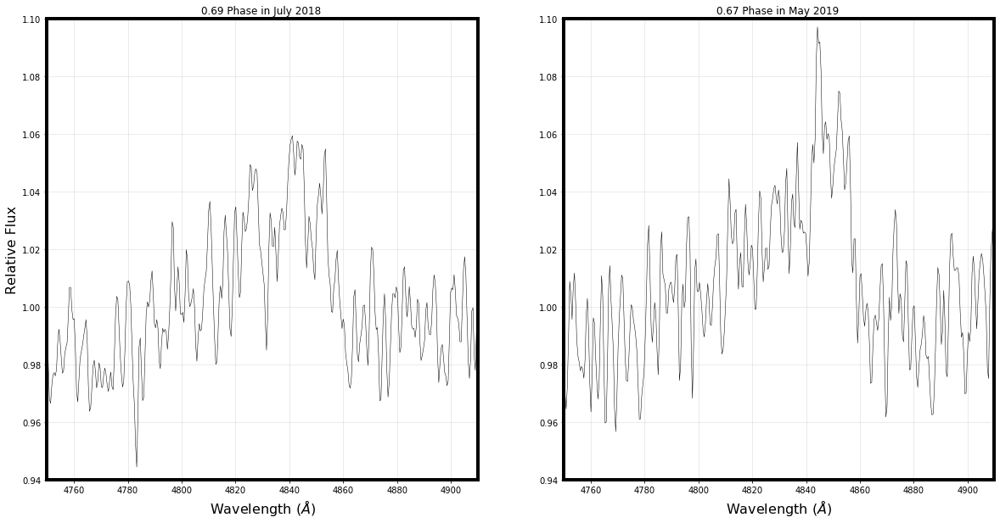

In [91]:
plt.figure(figsize=(20,10))
JulPhase = 0.688670874227054

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.665982905632063

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed18.png'
#plt.savefig(path, dpi=200)

0.9950226699939084 ----------- 0.995022669993908
0.9648627063802451 ----------- 0.964862706380245
May in is 289.2380100000024
What 366


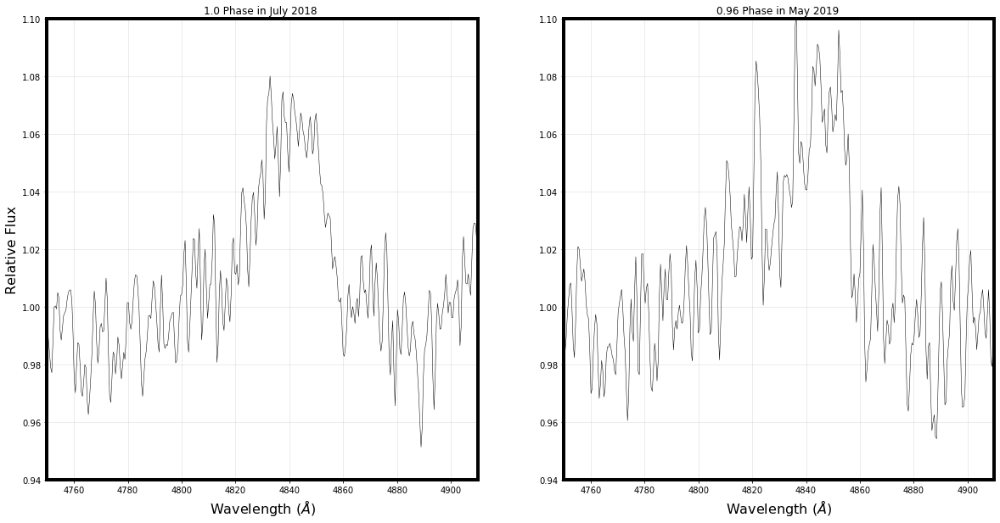

In [92]:
plt.figure(figsize=(20,10))
JulPhase = 0.995022669993908

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.964862706380245

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed19.png'
#plt.savefig(path, dpi=200)

0.09215860523705777 ----------- 0.092158605237058
0.06075130911722226 ----------- 0.060751309117222
May in is 289.1649380000017
What 366


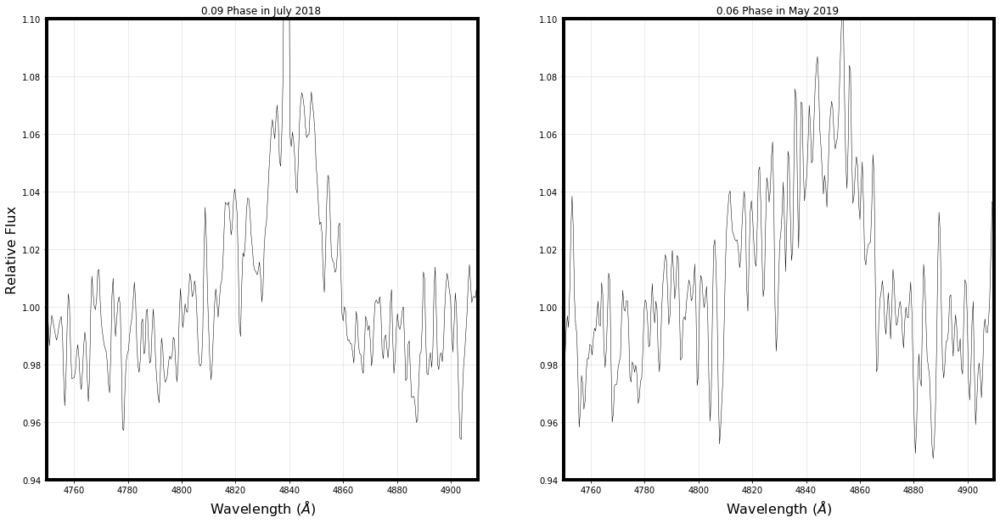

In [93]:
plt.figure(figsize=(20,10))
JulPhase = 0.092158605237058

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.060751309117222

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed20.png'
#plt.savefig(path, dpi=200)

0.19676653549891032 ----------- 0.19676653549891
0.15788724436060875 ----------- 0.157887244360609
May in is 289.17306400000234
What 366


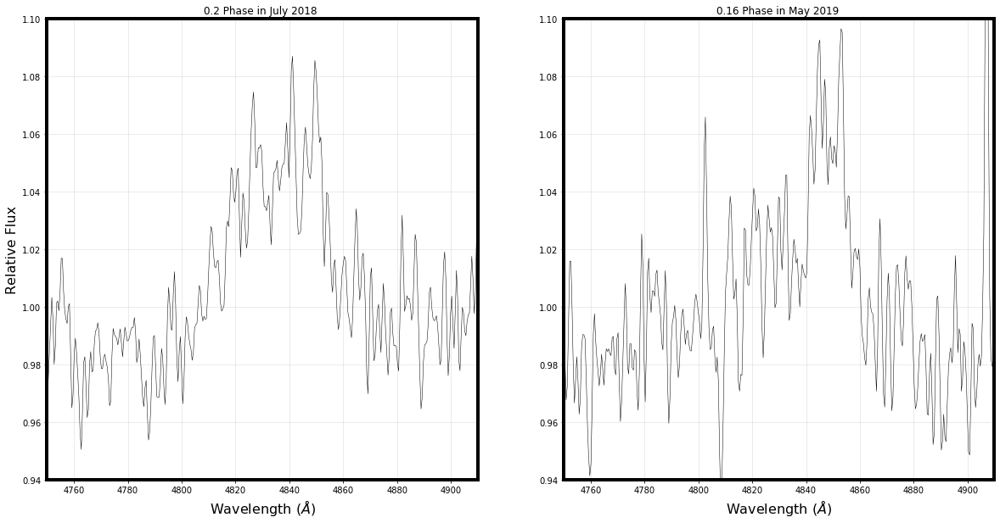

In [94]:
plt.figure(figsize=(20,10))
JulPhase = 0.19676653549891

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.157887244360609

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed21.png'
#plt.savefig(path, dpi=200)

0.08343927771204762 ----------- 0.083439277712048
0.06075130911722226 ----------- 0.060751309117222
May in is 289.1649380000017
What 366


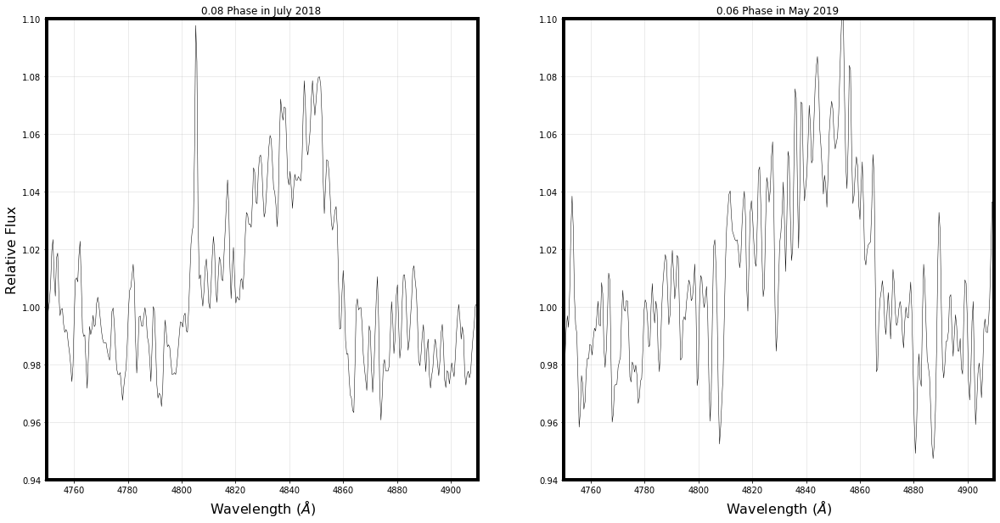

In [95]:
plt.figure(figsize=(20,10))
JulPhase = 0.083439277712048

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.060751309117222

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed22.png'
#plt.savefig(path, dpi=200)

0.18057521295519674 ----------- 0.180575212955197
0.15788724436060875 ----------- 0.157887244360609
May in is 289.17306400000234
What 366


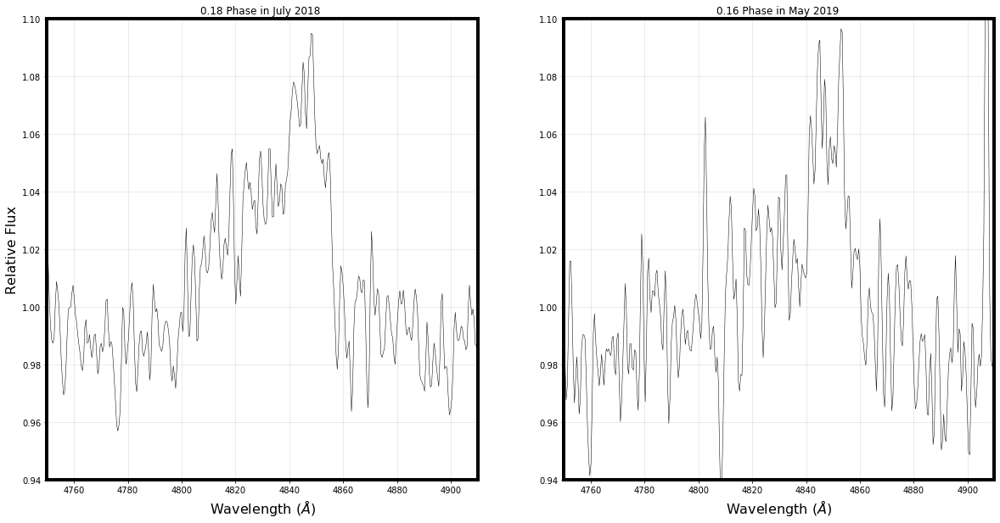

In [96]:
plt.figure(figsize=(20,10))
JulPhase = 0.180575212955197

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.157887244360609

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed23.png'
#plt.savefig(path, dpi=200)

0.28518314321704974 ----------- 0.28518314321705
0.26249517462201766 ----------- 0.262495174622018
May in is 289.1811780000033
What 366


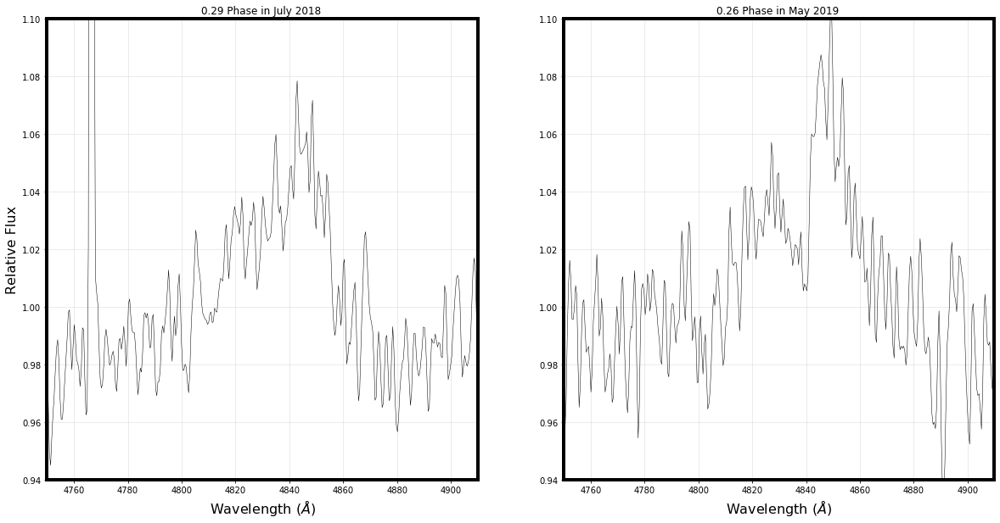

In [97]:
plt.figure(figsize=(20,10))
JulPhase = 0.28518314321705

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.262495174622018

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed24.png'
#plt.savefig(path, dpi=200)

0.9788313474501948 ----------- 0.978831347450195
0.9561433788553586 ----------- 0.956143378855359
May in is 289.15682400000367
What 366


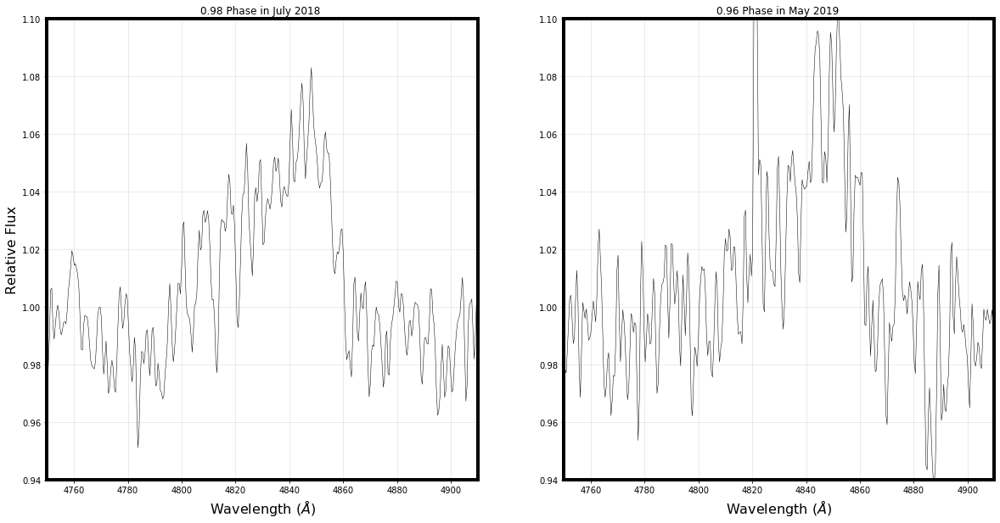

In [98]:
plt.figure(figsize=(20,10))
JulPhase = 0.978831347450195

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.956143378855359

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed25.png'
#plt.savefig(path, dpi=200)

0.8816954122070458 ----------- 0.881695412207046
0.8590074436119721 ----------- 0.859007443611972
May in is 289.1487080000035
What 366


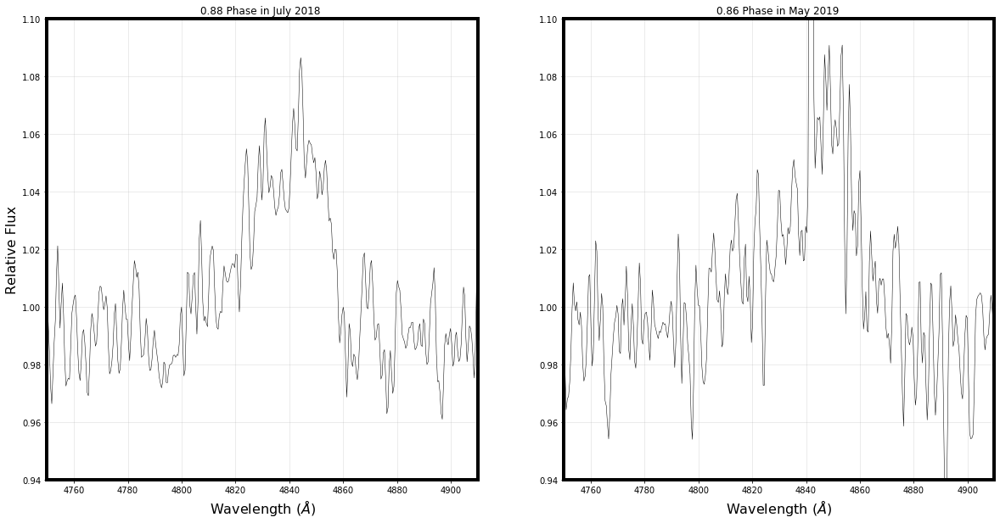

In [99]:
plt.figure(figsize=(20,10))
JulPhase = 0.881695412207046

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.859007443611972

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

In [93]:
##################END
convert 1.png 2.png 3.png 4.png 5.png 6.png 7.png 8.png 9.png 10.png 11.png 12.png 13.png 14.png 15.png 16.png 17.png 18.png 19.png 20.png 21.png 22.png 23.png 24.png 25.png 26.png output.pdf

SyntaxError: invalid syntax (<ipython-input-93-4088ff7abcc7>, line 2)

In [ ]:
convert Fixed1.png Fixed2.png Fixed3.png Fixed4.png Fixed5.png Fixed6.png Fixed7.png Fixed8.png Fixed9.png Fixed10.png Fixed11.png Fixed12.png Fixed13.png Fixed14.png Fixed15.png Fixed16.png Fixed17.png Fixed18.png Fixed19.png Fixed20.png Fixed21.png Fixed22.png Fixed23.png Fixed24.png Fixed25.png Fixed26.png Fixed27.png Fixed28.png outputNew.pdf

In [ ]:
#havent done anything below this

In [96]:
for i in range (1, 29):
    print('Fixed'+str(i)+'.png')

Fixed1.png
Fixed2.png
Fixed3.png
Fixed4.png
Fixed5.png
Fixed6.png
Fixed7.png
Fixed8.png
Fixed9.png
Fixed10.png
Fixed11.png
Fixed12.png
Fixed13.png
Fixed14.png
Fixed15.png
Fixed16.png
Fixed17.png
Fixed18.png
Fixed19.png
Fixed20.png
Fixed21.png
Fixed22.png
Fixed23.png
Fixed24.png
Fixed25.png
Fixed26.png
Fixed27.png
Fixed28.png


0.7696154869264891 ----------- 0.769615486926489
0.7543995133505632 ----------- 0.754399513350563
May in is 289.1405860000028
What 364


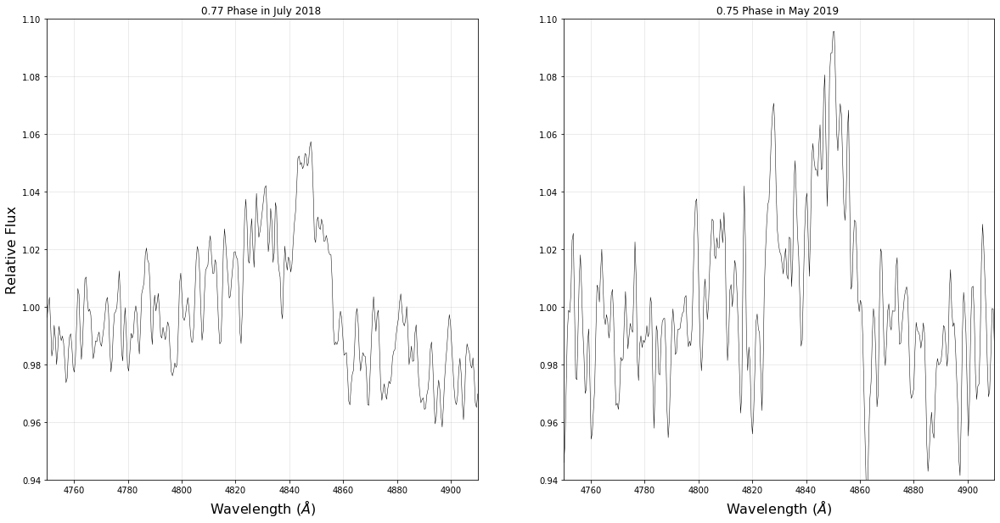

In [47]:
plt.figure(figsize=(20,10))
JulPhase = 0.769615486926489

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.754399513350563

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed27.png'
plt.savefig(path, dpi=200)

0.6650075566646362 ----------- 0.665007556664636
0.6497915830882448 ----------- 0.649791583088245
May in is 289.13246800000195
What 364


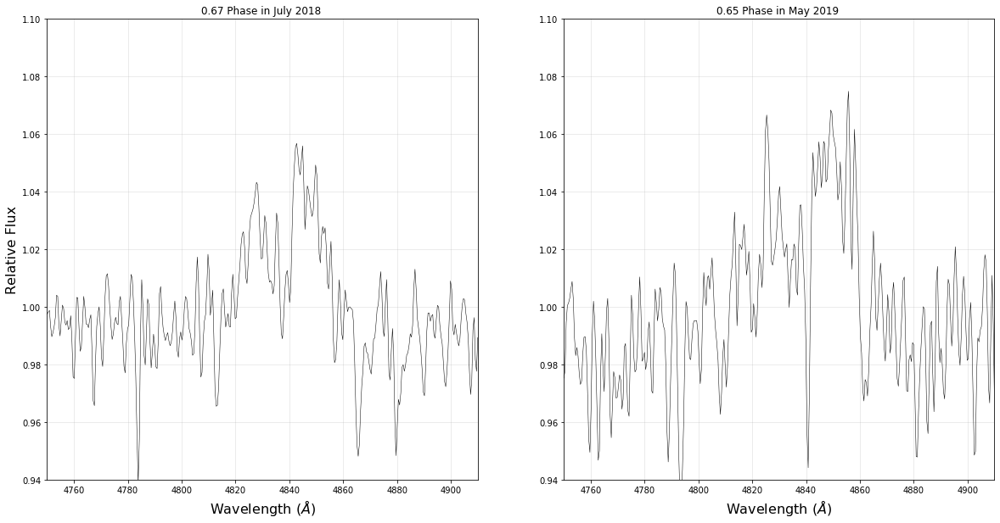

In [48]:
plt.figure(figsize=(20,10))
JulPhase = 0.665007556664636

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(4750,4910, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.649791583088245

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(4750,4910, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(4750, 4910)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed28.png'
plt.savefig(path, dpi=200)

In [113]:
MJD = []
counter = 0
path = 'C:/Users/Admin/newJul18/'
with open(path+'RTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        MJD.append(float(hdul[0].header['MJD-OBS']))
        hdul.close()
        counter = 1
print(MJD)

[58328.87896, 58328.88069, 58328.88245, 58328.88428, 58328.88589, 58328.88748, 58328.8891, 58328.89072, 58328.89296, 58328.89457, 58328.89618, 58328.89778, 58328.89939, 58328.90136, 58328.90297, 58328.90459, 58328.90619, 58328.90781, 58328.90942, 58328.91101, 58328.91263, 58328.91423, 58328.91585, 58328.91746, 58328.91906, 58328.92068, 58328.92229, 58328.92389, 58328.92551, 58328.92712, 58328.92872, 58328.93033, 58328.93194, 58328.93355, 58328.93516, 58328.93677, 58328.93838, 58328.94154, 58328.94314, 58328.94475, 58328.94636, 58328.94797, 58328.94958, 58328.95119, 58328.9528, 58328.9544, 58328.95602, 58328.95763, 58328.95923, 58328.96084, 58328.96245, 58328.96406, 58328.96567, 58328.96729, 58328.96889, 58328.97049, 58328.9721, 58328.97371, 58328.97532, 58328.97693, 58328.97854, 58328.98015, 58328.9822, 58328.9838, 58328.98541, 58328.98702, 58328.98863, 58328.99024, 58328.99185, 58328.99346, 58328.99507, 58328.99667, 58328.99828, 58328.99989, 58329.0015, 58329.00311, 58329.00472, 58329

In [114]:
checkMJD = np.sort(MJD)
np.array_equal(MJD, checkMJD)

True

In [115]:
MJD2 = []
counter = 0
path = 'C:/Users/Admin/newMay19/'
with open(path+'RTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        MJD2.append(float(hdul[0].header['MJD-OBS']))
        hdul.close()
        counter = 1
print(MJD2)

[58617.92701, 58617.92862, 58617.93023, 58617.93184, 58617.93345, 58617.93506, 58617.93667, 58617.93827, 58617.93988, 58617.94149, 58617.9431, 58617.94471, 58617.94632, 58617.94793, 58617.94954, 58617.95114, 58617.95275, 58617.95436, 58617.95597, 58617.95758, 58617.95919, 58617.9608, 58617.96241, 58617.96402, 58617.96562, 58617.96723, 58617.96884, 58617.97045, 58617.97206, 58617.97367, 58617.97528, 58617.97689, 58617.97849, 58617.9801, 58617.98171, 58617.98332, 58617.98493, 58617.98654, 58617.98815, 58617.98976, 58617.99136, 58617.99297, 58617.99458, 58617.99619, 58617.9978, 58617.99941, 58618.00102, 58618.00263, 58618.00423, 58618.00584, 58618.00745, 58618.00906, 58618.01067, 58618.01228, 58618.01389, 58618.0155, 58618.01711, 58618.01871, 58618.02032, 58618.02193, 58618.02354, 58618.02515, 58618.02676, 58618.02837, 58618.02998, 58618.03158, 58618.03319, 58618.0348, 58618.03641, 58618.03802, 58618.03964, 58618.04125, 58618.04286, 58618.04447, 58618.04608, 58618.04768, 58618.04929, 5861

In [116]:
print(len(MJD))

113


In [117]:
fullTime = np.concatenate([np.array(MJD), np.array(MJD2)])
fullTime = fullTime - 58328.87896
print(fullTime)
MJDIn = np.array(MJD) - 58328.87896
MJDTemp1=MJDIn[:-3]
MJDTemp1 = np.array(MJDTemp1)
MJDTemp1 = np.mean(MJDTemp1.reshape(-1, 5), axis=1)
MJDTemp1Last = np.mean(MJDIn[-3:])
MJDTemp1 = np.append(MJDTemp1, MJDTemp1Last)
print(MJDTemp1)

[0.0000000e+00 1.7300000e-03 3.4900000e-03 5.3200000e-03 6.9300000e-03
 8.5200000e-03 1.0140000e-02 1.1760000e-02 1.4000000e-02 1.5610000e-02
 1.7220000e-02 1.8820000e-02 2.0430000e-02 2.2400000e-02 2.4010000e-02
 2.5630000e-02 2.7230000e-02 2.8850000e-02 3.0460000e-02 3.2050000e-02
 3.3670000e-02 3.5270000e-02 3.6890000e-02 3.8500000e-02 4.0100000e-02
 4.1720000e-02 4.3330000e-02 4.4930000e-02 4.6550000e-02 4.8160000e-02
 4.9760000e-02 5.1370000e-02 5.2980000e-02 5.4590000e-02 5.6200000e-02
 5.7810000e-02 5.9420000e-02 6.2580000e-02 6.4180000e-02 6.5790000e-02
 6.7400000e-02 6.9010000e-02 7.0620000e-02 7.2230000e-02 7.3840000e-02
 7.5440000e-02 7.7060000e-02 7.8670000e-02 8.0270000e-02 8.1880000e-02
 8.3490000e-02 8.5100000e-02 8.6710000e-02 8.8330000e-02 8.9930000e-02
 9.1530000e-02 9.3140000e-02 9.4750000e-02 9.6360000e-02 9.7970000e-02
 9.9580000e-02 1.0119000e-01 1.0324000e-01 1.0484000e-01 1.0645000e-01
 1.0806000e-01 1.0967000e-01 1.1128000e-01 1.1289000e-01 1.1450000e-01
 1.161

In [118]:
MJDIn = np.array(MJD2) - 58328.87896
MJDTemp2 = np.array(MJDIn)
MJDTemp2 = np.mean(MJDTemp2.reshape(-1, 5), axis=1)
print(MJDTemp2)

[289.05127  289.059314 289.06736  289.0754   289.083448 289.09149
 289.099534 289.10758  289.11562  289.123666 289.13171  289.139754
 289.1478   289.15584  289.1639   289.17194  289.179986 289.18803
 289.196072 289.204118 289.21216  289.220206 289.22825  289.236292]


In [120]:
def box_filter(box_length, data):
    boxed = []
    box_length = box_length / 2
    box_length = int(box_length)
    count = 0
    for element in data:
        if count < box_length:
            dataOut = data[0:(box_length+count)]
        temp = box_length + count
        if temp > len(data):
            dataOut = data[(count-box_length):-1]
        else:
            dataOut = data[(count-box_length):(count+box_length)]
        dataOut = np.median(dataOut)
        #dataOut = np.mean(dataOut)
        boxed.append(dataOut)
        count += 1
    return boxed

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx


D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


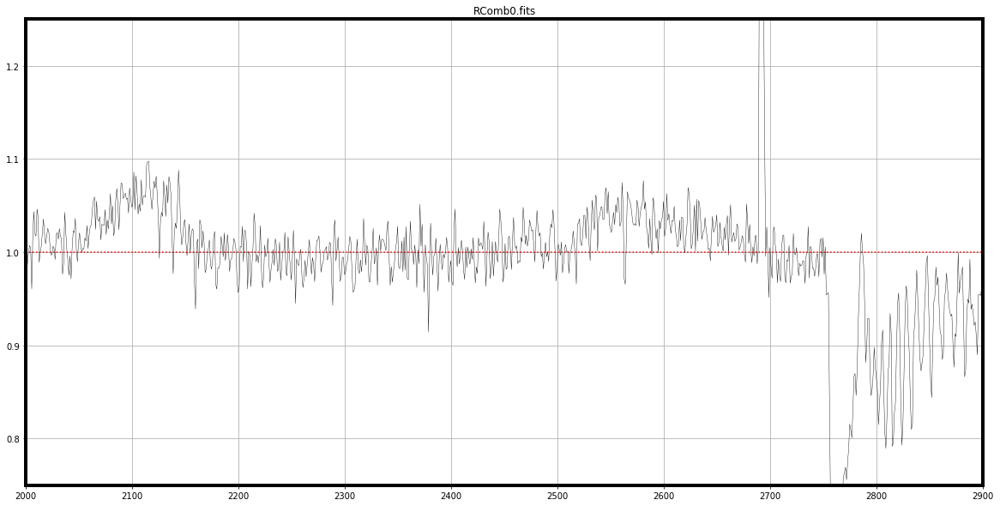

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


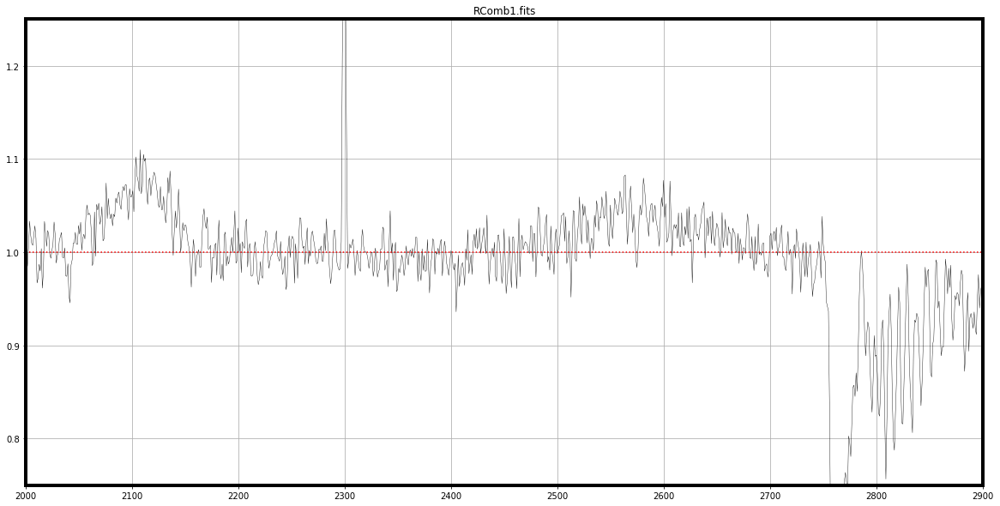

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


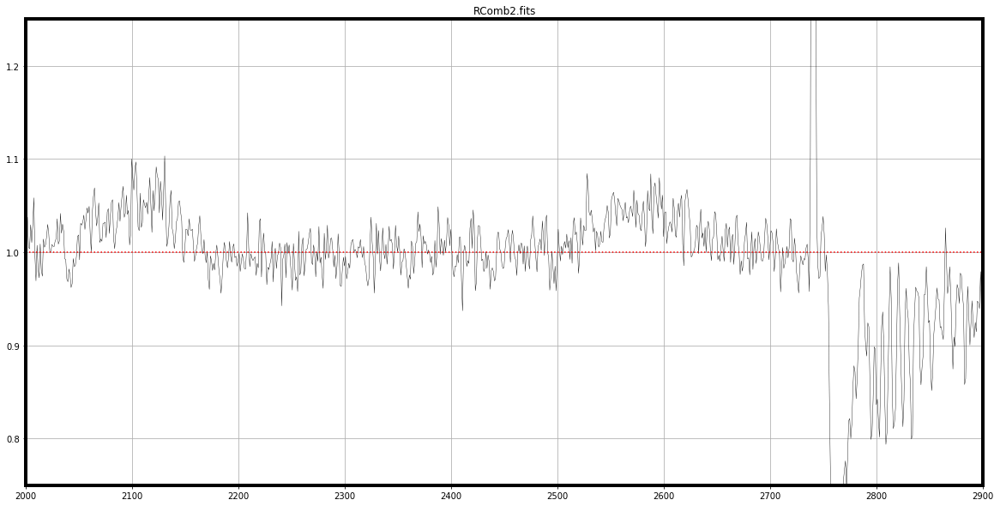

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


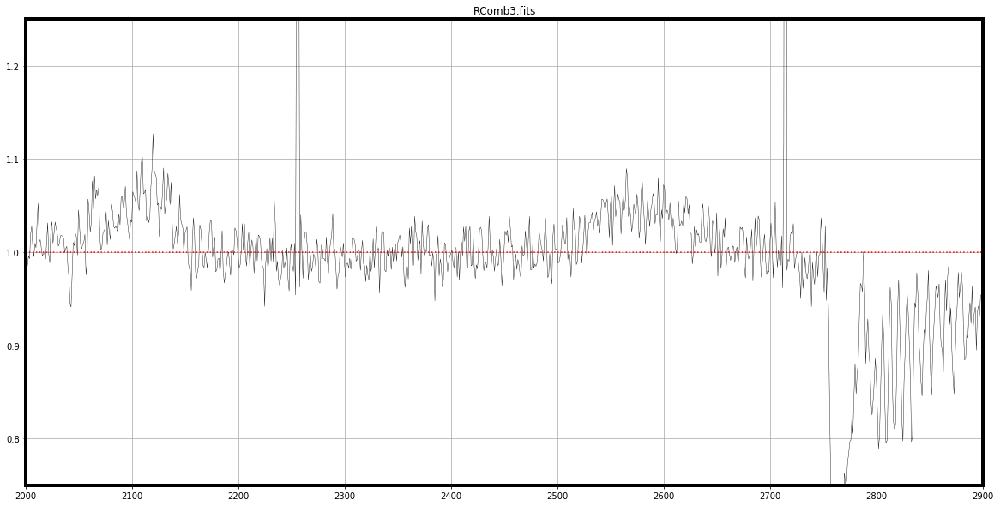

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


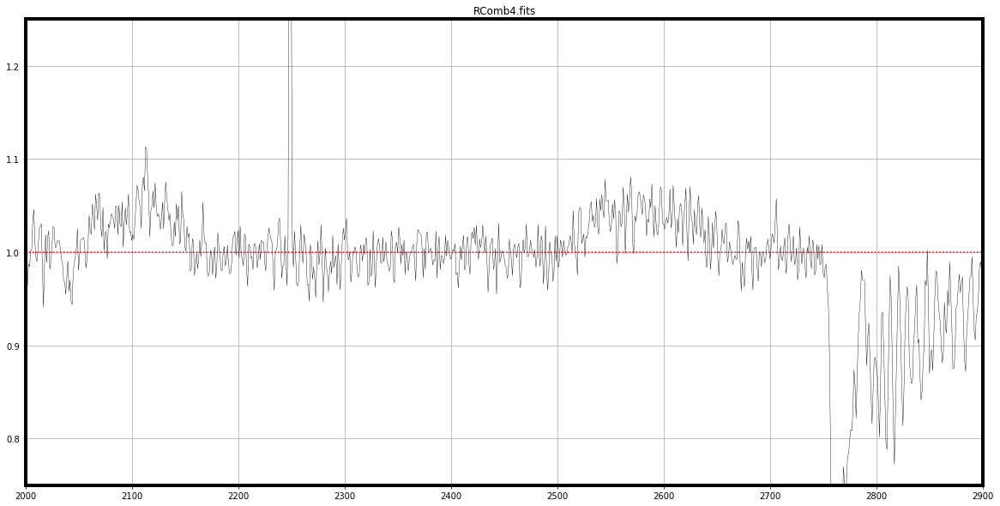

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


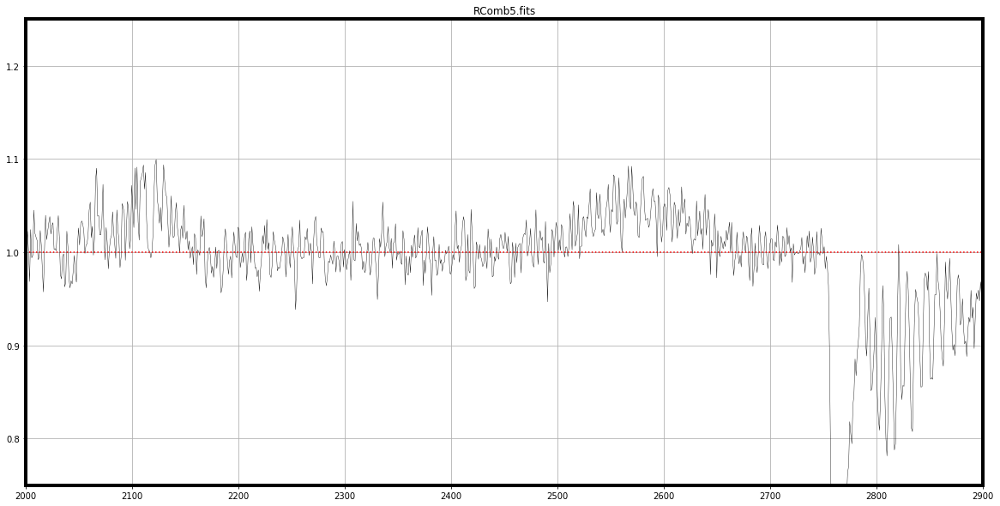

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


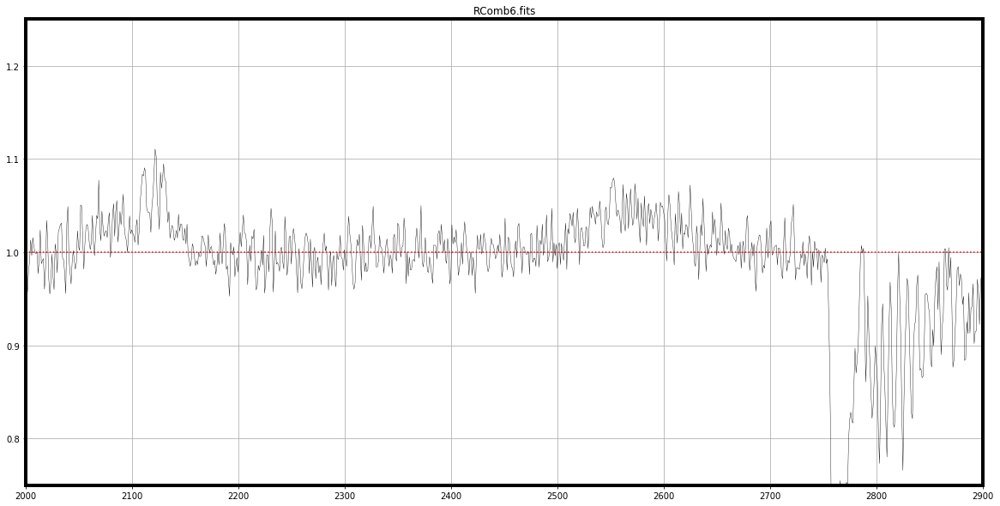

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


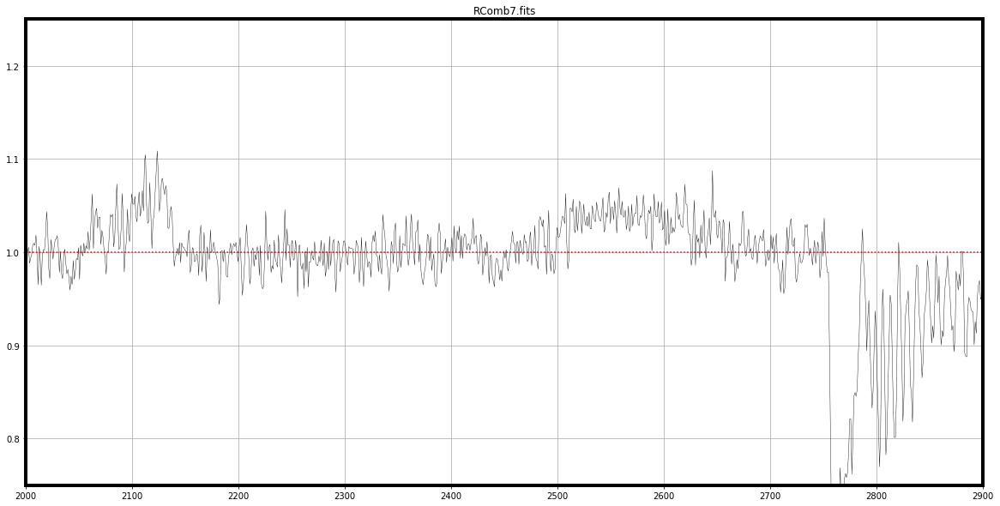

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


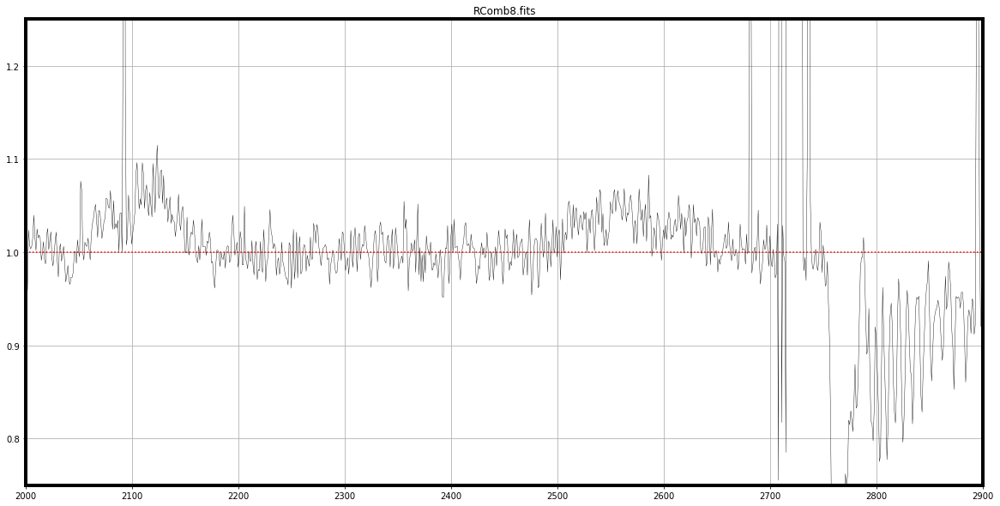

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


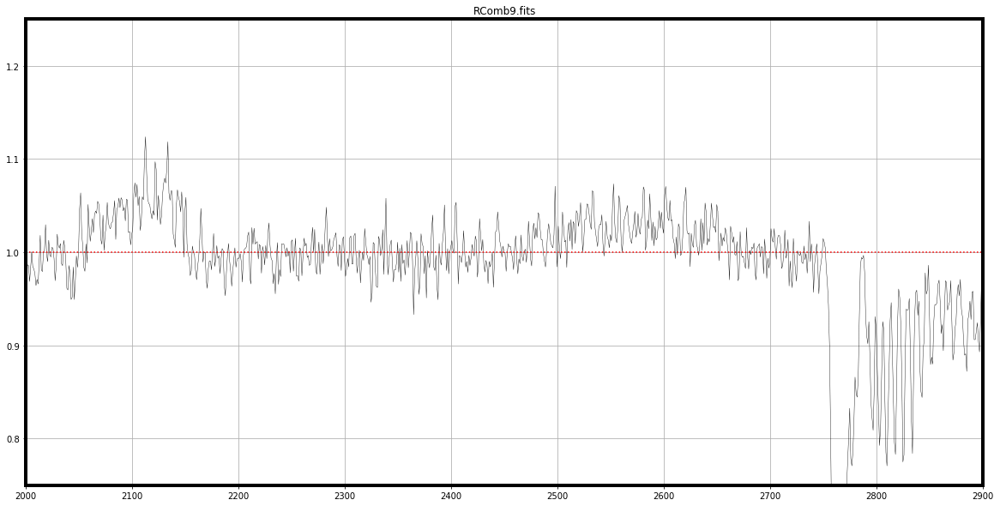

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


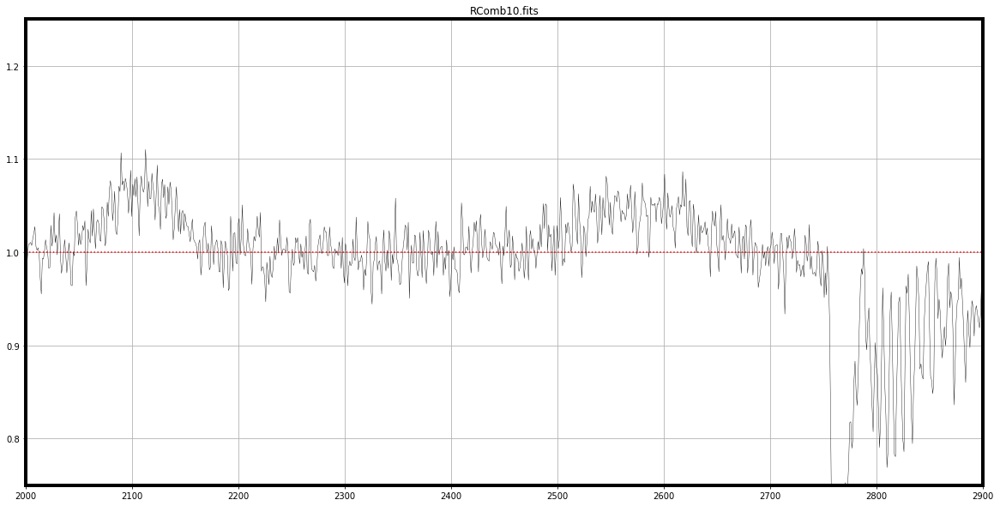

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


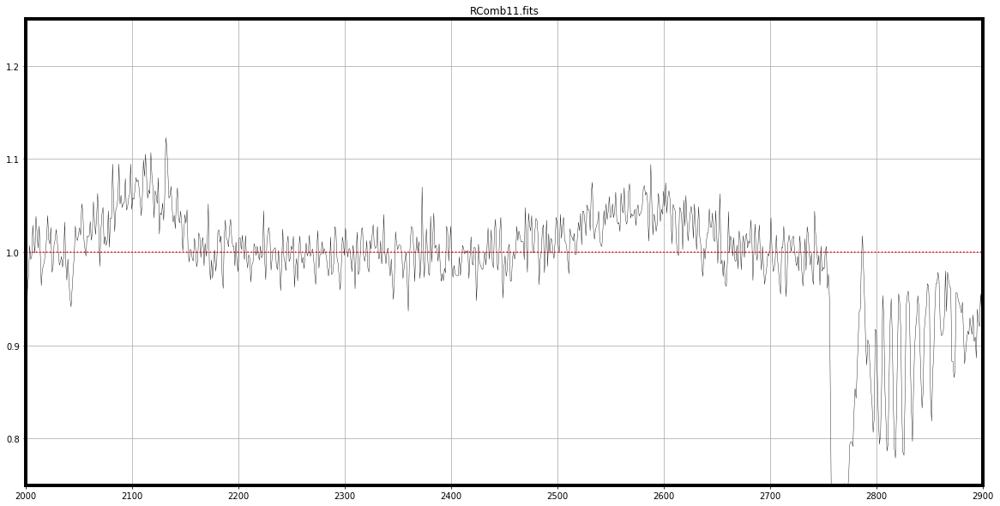

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


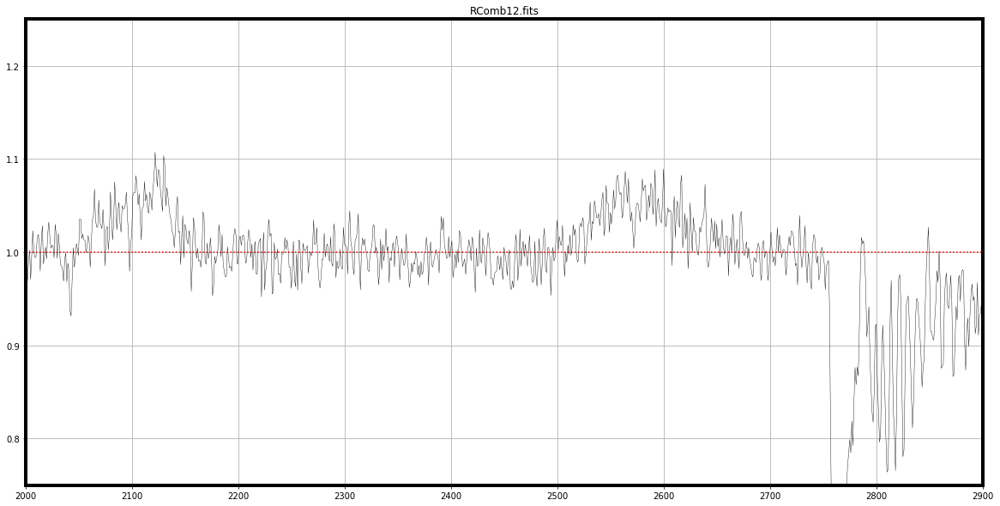

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


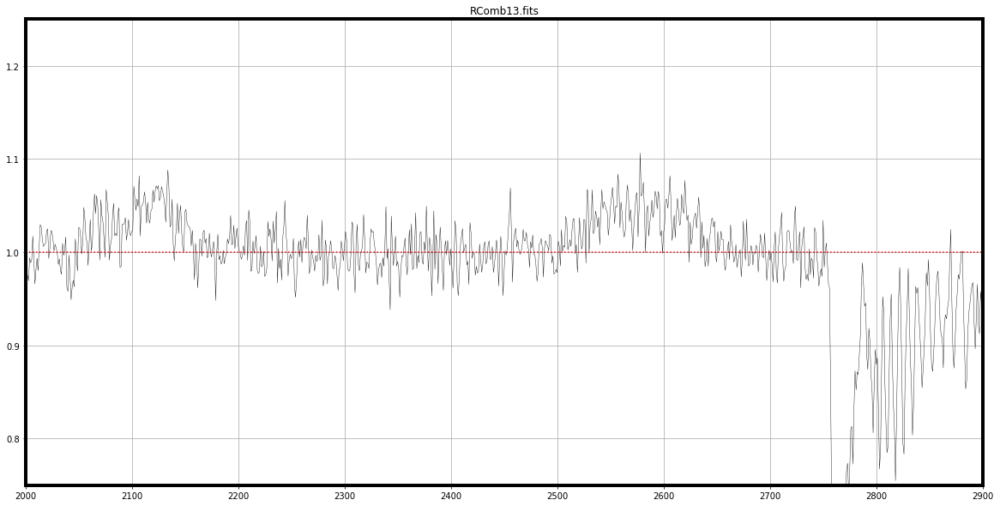

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


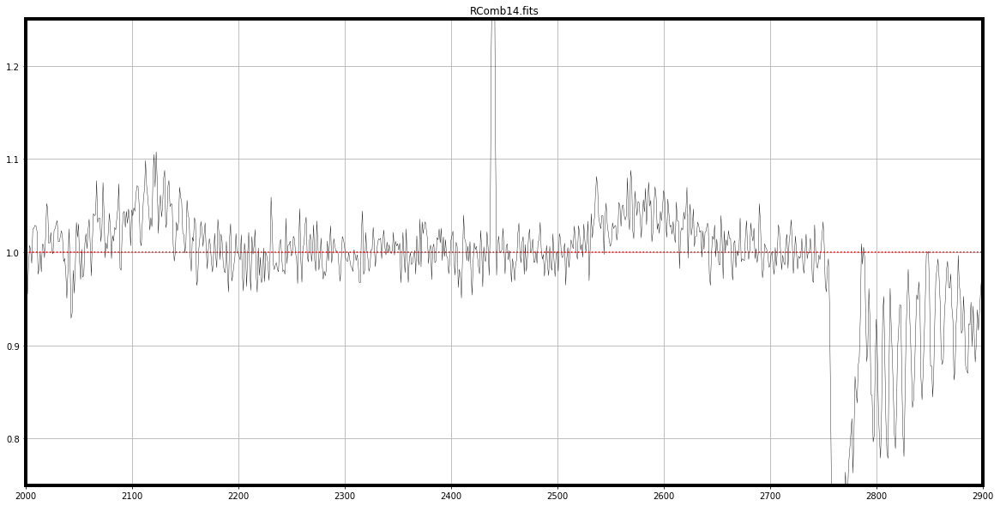

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


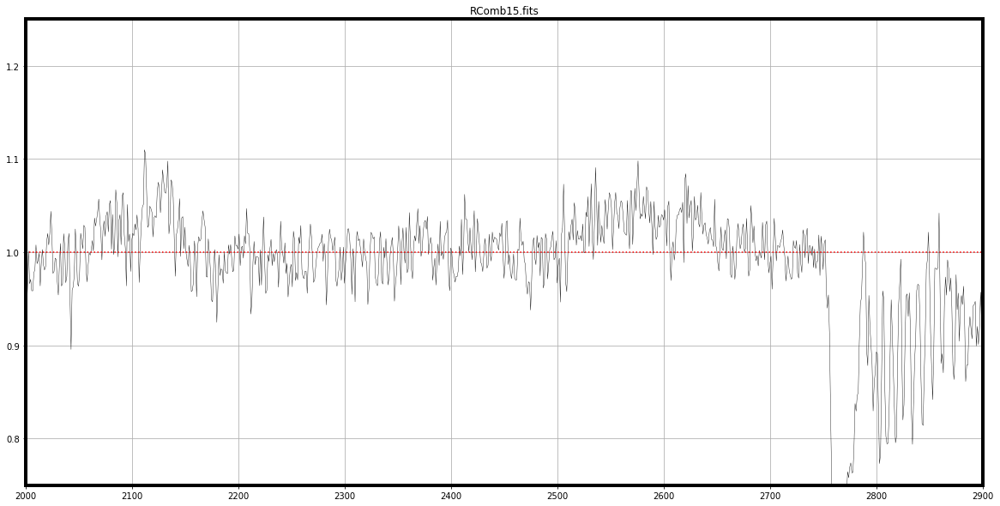

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


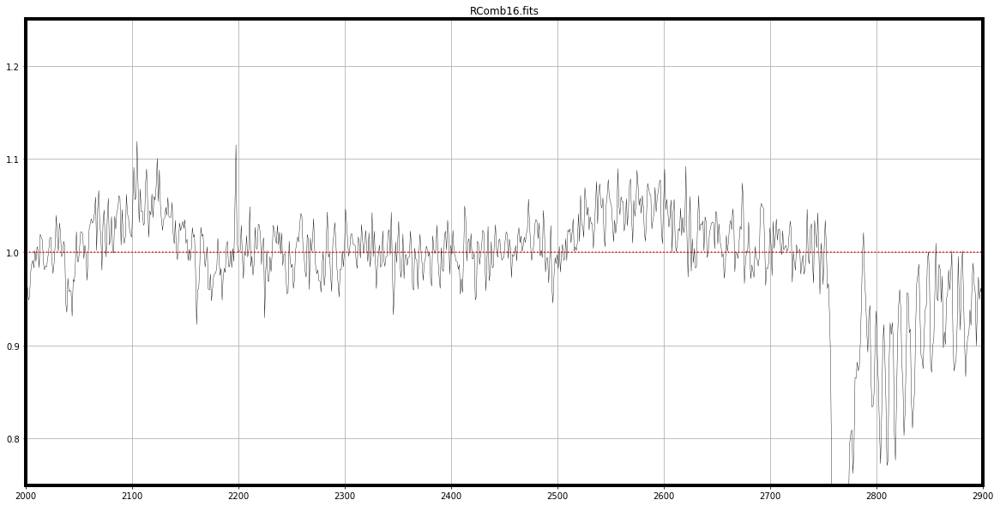

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


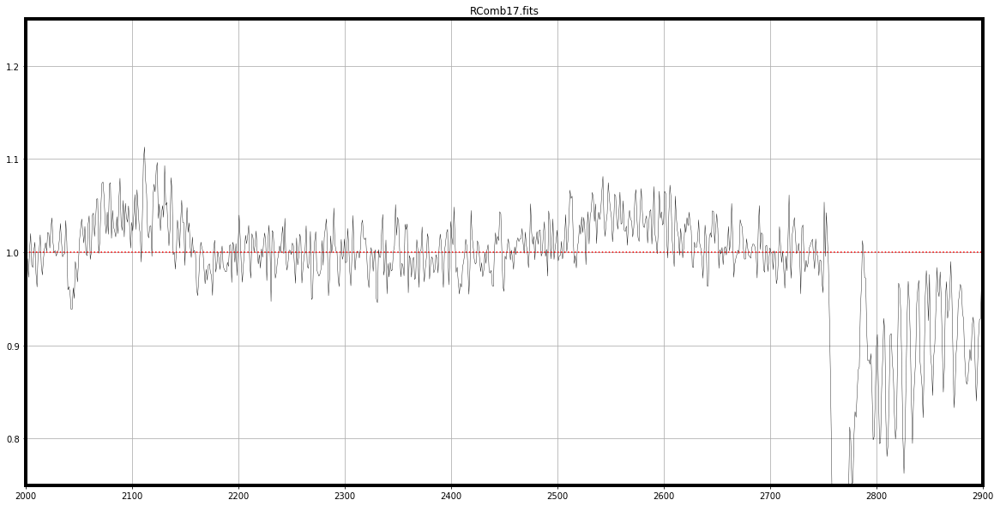

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


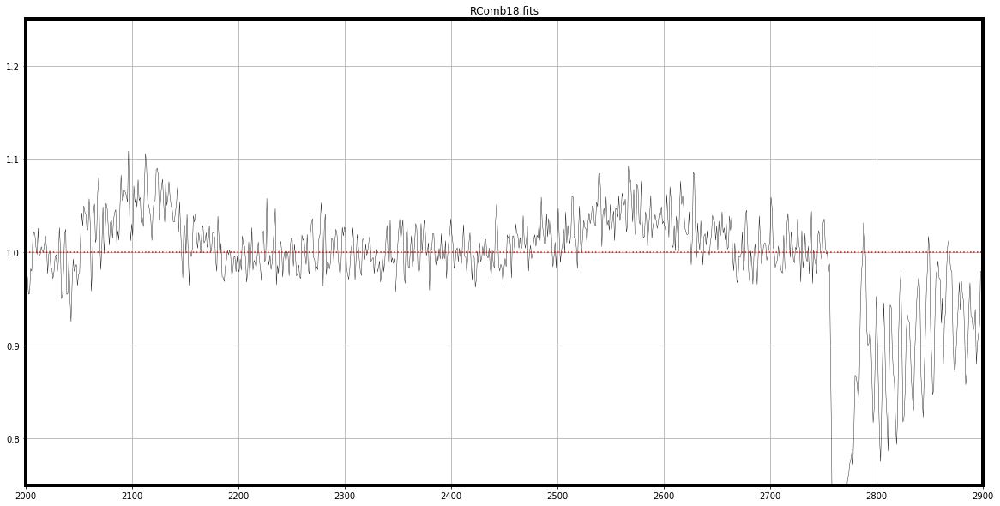

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


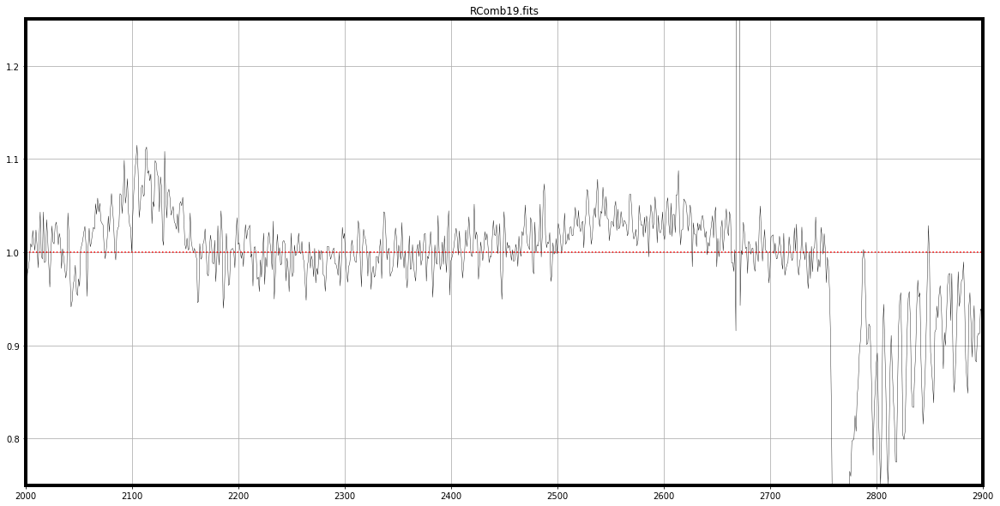

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


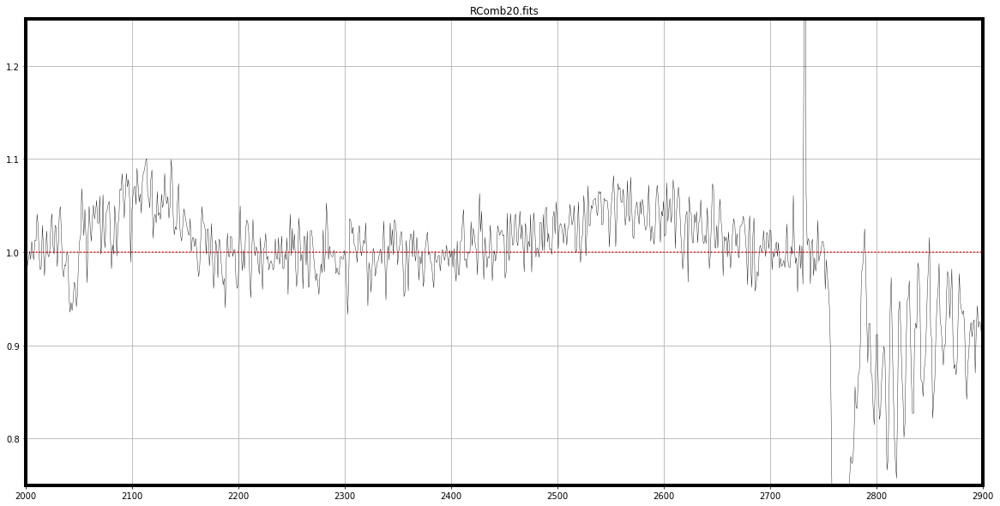

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


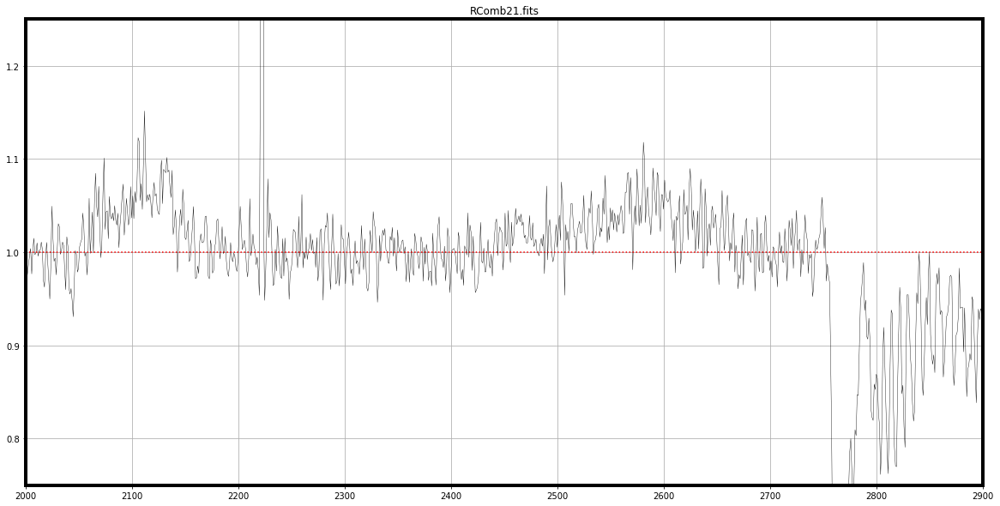

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


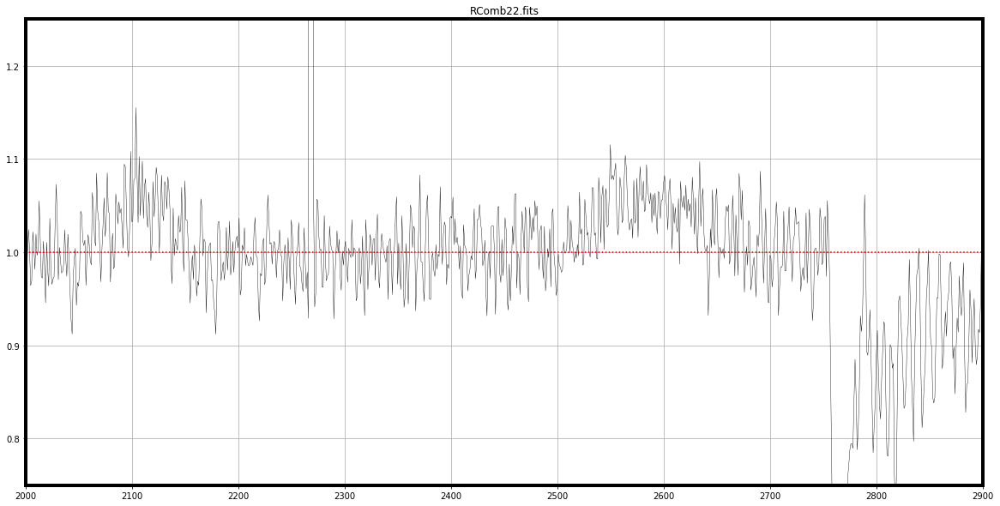

In [159]:
times = []
countGlob = 1
holder_array = []
path = 'C:/Users/Admin/newJul18/'
consts = []
with open(path+'RCombinedList.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        thisTime = hdul[0].header['ARCHIVEE']
        times.append(thisTime)
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()
        typeEx = np.clip(typeEx, 0, 1000) # <---- improve on this
        typeExBox = box_filter(20, typeEx)
        globalBox = box_filter(100, typeEx)
        count = 0
        for elB in typeExBox:
            if elB > (globalBox[count] +100):
                typeExBox[count] = globalBox[count]
            count +=1
        hdul.close()
        x = np.linspace(0,4200, 4200)
        x_in1 = np.linspace(1000,1475, 475)
        x_in2 = np.linspace(2190, 2418, 228)
        x_in3 = np.linspace(2678, 2732, 54)
            #x_in4 = np.linspace(3123, 3312, 189)
        x_temp = np.concatenate((x_in1, x_in2), axis=None)
        x_temp = np.concatenate((x_temp, x_in3), axis=None)
            #x_temp = np.concatenate((x_temp, x_in4), axis=None)
        y_1 = typeEx[1000:1475]
        y_2 = typeEx[2190:2418]
        y_3 = typeEx[2678:2732]
            #y_4 = typeEx[3123:3312]
        y_temp = np.concatenate((y_1, y_2), axis=None)
        y_temp = np.concatenate((y_temp, y_3), axis=None)
            #y_temp = np.concatenate((y_temp, y_4), axis=None)
            #constant = MSE(x_temp, y_temp)
            #y = constant -(0.30899*x) + (0.000036113*x*x)
        y_1b = typeExBox[1000:1475]
            
        mean = np.mean(y_1b)
        std = np.std(y_1b)
        lineFit = np.polyfit(x_in1, y_1b, 1)
        y_1g = x_in1 * lineFit[0] + lineFit[1]
        count =0
        for el in y_1b:
            if el > (y_1g[count] + (std)):
                y_1b[count] = y_1g[count]
                    
            count += 1
                    
                    
            
        y_2b = typeExBox[2190:2418]
            
        mean = np.mean(y_2b)
        std = np.std(y_2b)
        lineFit = np.polyfit(x_in2, y_2b, 1)
        y_2g = x_in2 * lineFit[0] + lineFit[1]
        count =0
        for el in y_2b:
            if el > (y_2g[count] + (std)):
                y_2b[count] = y_2g[count]
                    
            count += 1
            
        y_3b = typeExBox[2678:2732]
        mean = np.mean(y_3b)
        std = np.std(y_3b)
        lineFit = np.polyfit(x_in3, y_3b, 1)
        y_3g = x_in3 * lineFit[0] + lineFit[1]
        count =0
        for el in y_3b:
            if el > (y_3g[count] + (std)):
                y_3b[count] = y_3g[count]
                    
            count += 1
            #y_4 = typeEx[3123:3312]
        y_tempb = np.concatenate((y_1b, y_2b), axis=None)
        y_tempb = np.concatenate((y_tempb, y_3b), axis=None)
        w_in1 = (1/475)*np.ones(475)
        w_in2 = (1/228)*np.ones(228)
        w_in3 = (1/54)*np.ones(54)
            #w_in4 = (1/189)*np.ones(189)
        w_temp = np.concatenate((w_in1, w_in2), axis=None)
        w_temp = np.concatenate((w_temp, w_in3), axis=None)
        try:
            z = np.polyfit(x_temp, y_tempb, 2, w=w_temp)
        except:
            print(y_tempb)
        fitted = x*x*z[0]+x*z[1]+z[2]
            
        normedTypeEx = typeEx / fitted
        if countGlob == 1:
            holder_array = normedTypeEx[1000:3500]
        else:
            holder_array = np.vstack((holder_array, normedTypeEx[1000:3500]))
        countGlob +=1
        fig = plt.figure(figsize=(20,10))
        plt.ylim(0.75,1.25)
        plt.plot(x, normedTypeEx, 'k', lw=0.4)
        ones = np.ones_like(x)
        plt.plot(x, ones, 'r:')
        plt.xlim(2000,2900)
        plt.title(line)
        plt.grid()
            #plt.plot(x_in4, y_4, 'r', lw=0.2)
        plt.show()
           
            #plt.show()
#specs = np.linspace(1, countGlob, (countGlob-1))


In [126]:
np.shape(holder_array)

(23, 2500)

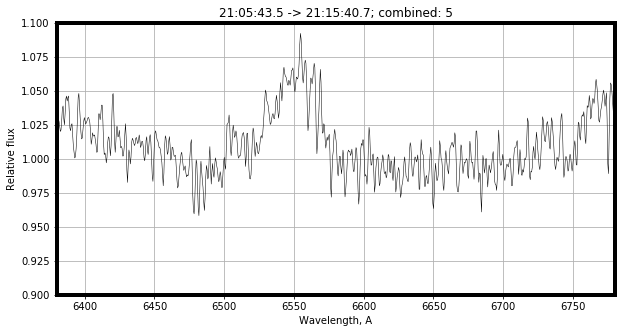

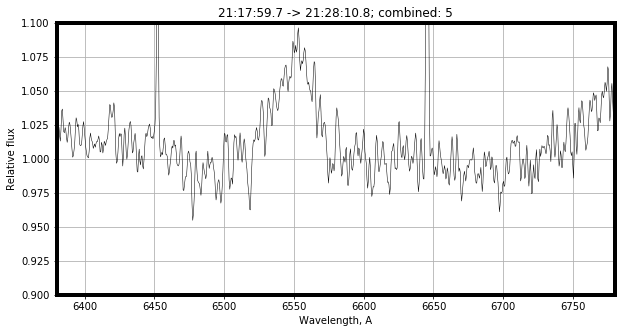

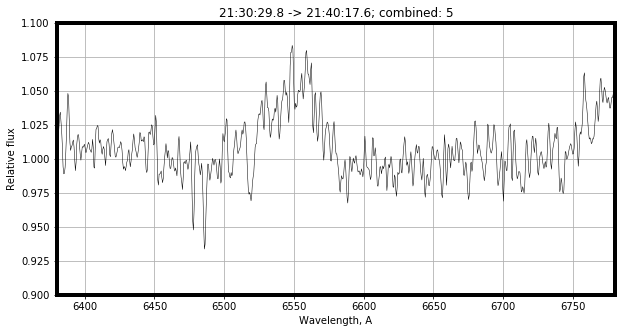

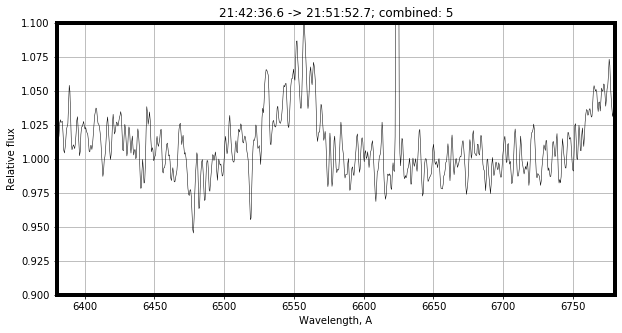

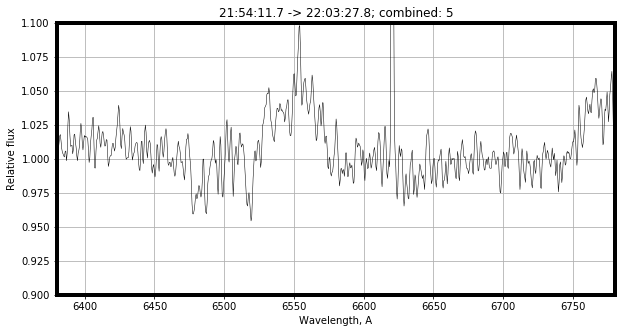

...

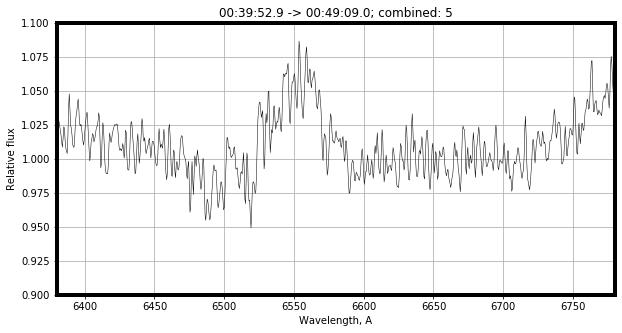

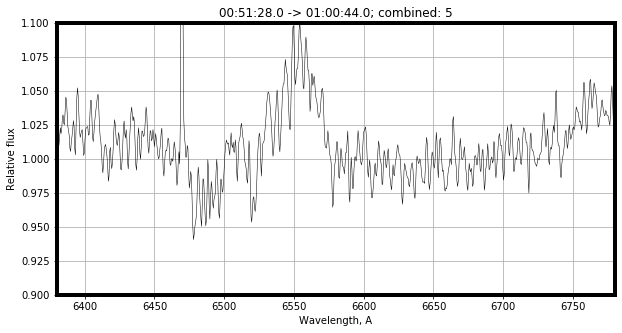

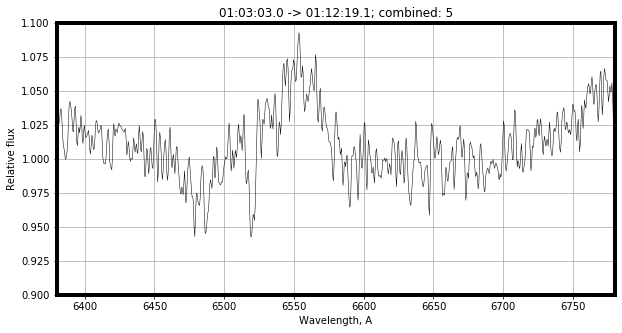

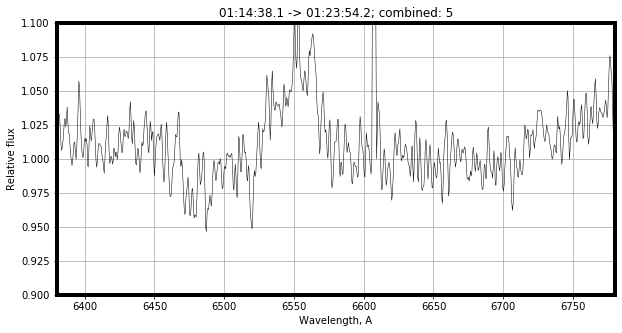

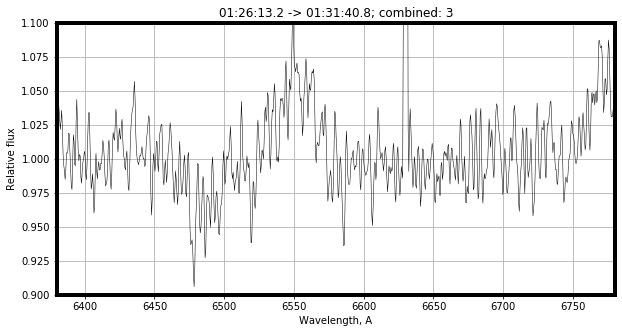

In [160]:
path = 'C:/Users/Admin/newJul18/'
areas = []
count = 0
dict_count = 0
data_plot = []
data_plot_read = []
with open(path+'RCombinedList.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        comblist = [hdul[0].header['IMCMB001'], hdul[0].header['IMCMB002'], hdul[0].header['IMCMB003']]
        try:
            fourth = hdul[0].header['IMCMB004']
            fifth = hdul[0].header['IMCMB005']
            comblist.append(fourth)
            comblist.append(fifth)
        except KeyError:
            pass
        inputfileS = comblist[0]
        inputfileS = inputfileS.replace(".ms.fits", ".fit")
        filepathIn = path + inputfileS
        hdulIn = fits.open(filepathIn)
        timeStart = hdulIn[0].header['UTOBS']
        hdulIn.close()
        inputfileF = comblist[-1]
        inputfileF = inputfileF.replace(".ms.fits", ".fit")
        filepathIn = path + inputfileF
        hdulIn = fits.open(filepathIn)
        timeFinish = hdulIn[0].header['UTOBS']
        hdulIn.close()
        #print(np.shape(typeEx))
        data = holder_array[count]
        data = gaussian_filter(data, sigma=1)
        
        xpoints = np.linspace(5515, 7580, 4200)
        xpoints = xpoints[1000:3500]
        hdul.close() #6380 6780
        startingID = find_nearest_id(xpoints, 6380)
        finishingID = find_nearest_id(xpoints, 6780)
        startingIDr = find_nearest_id(xpoints, 6525)
        finishingIDr = find_nearest_id(xpoints, 6570)
        
        if count ==0:
            data_plot = data[startingID: finishingID]
            globalDictionary = {MJDTemp1[dict_count] : data_plot}
            data_plot_read = data[startingIDr: finishingIDr]
            count = 1
        else:
            globalDictionary[MJDTemp1[dict_count]] = data[startingID: finishingID]
            data_plot = np.vstack((data_plot, data[startingID: finishingID]))
            
            data_plot_read = np.vstack((data_plot_read, data[startingIDr: finishingIDr]))
            count = count+1
        plt.figure(figsize=(10,5))
        plt.plot(xpoints,data, 'k-', linewidth=0.5)
        plt.xlim(6380, 6780)
        dict_count += 1
        plt.ylim(0.9,1.1)
        plt.grid()
        titleStr = timeStart + " -> " + timeFinish + "; combined: " + str(len(comblist))
        plt.title(titleStr)
        plt.xlabel("Wavelength, A")
        plt.ylabel("Relative flux")
        line = line.replace(".ms.fits", "")
        plt.show()

        plt.close()


D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


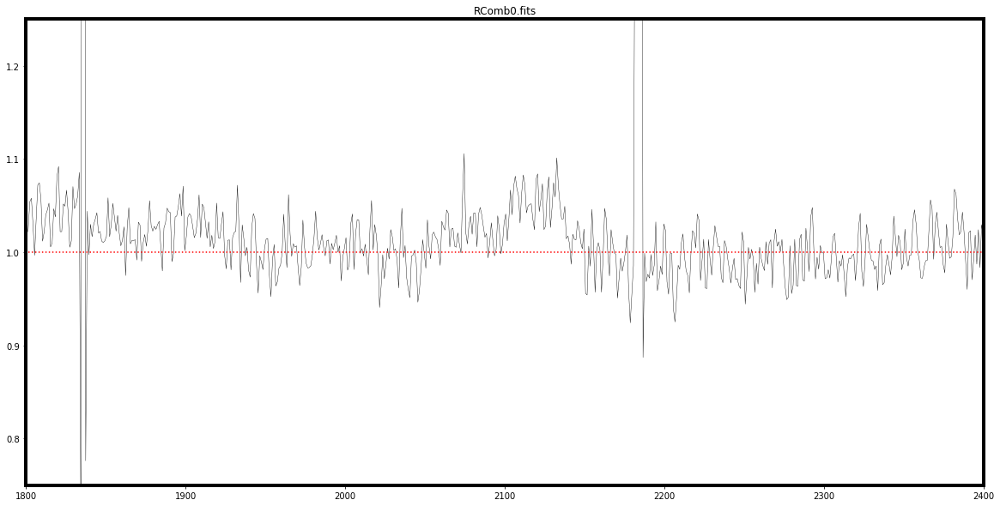

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


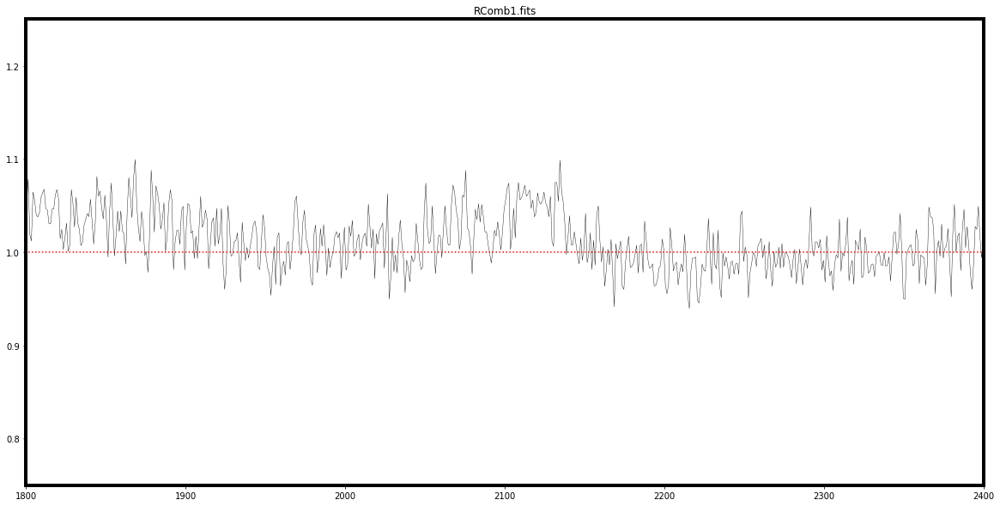

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


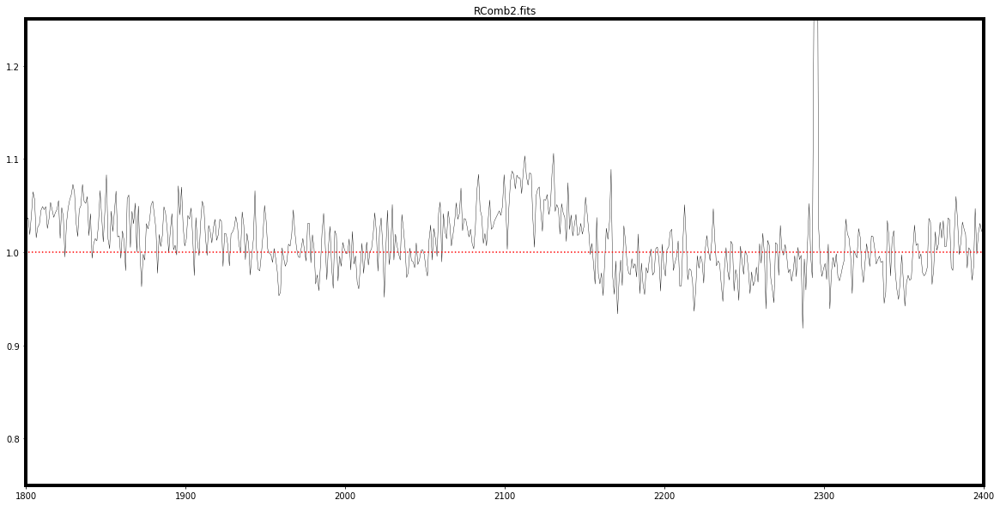

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


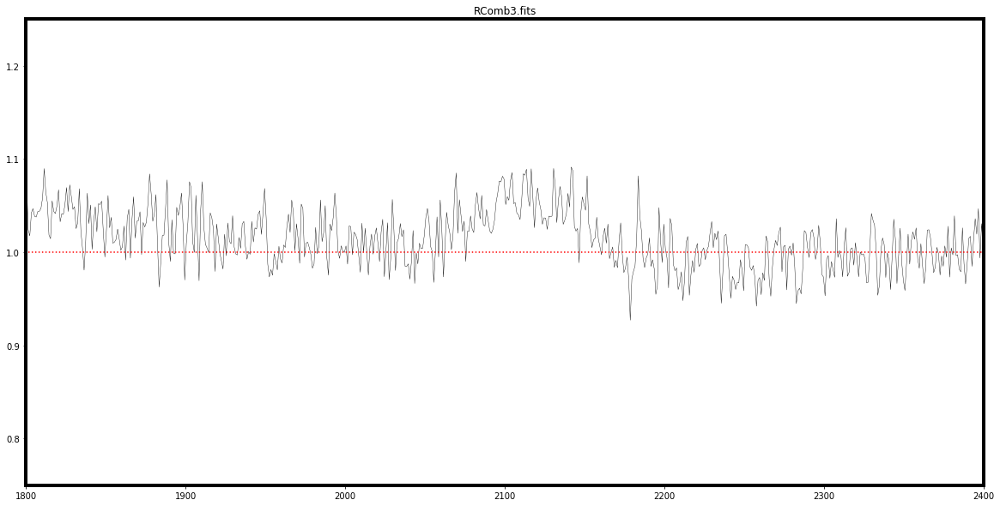

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


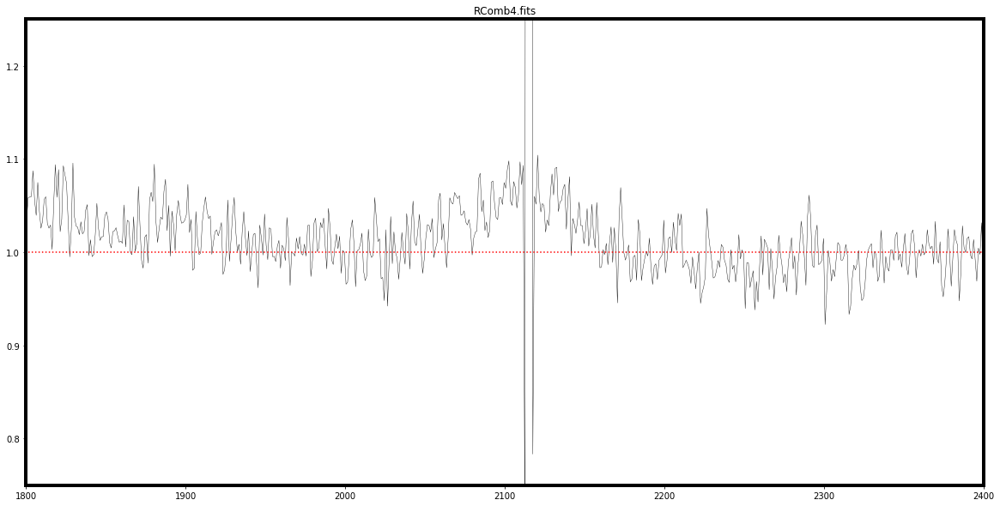

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


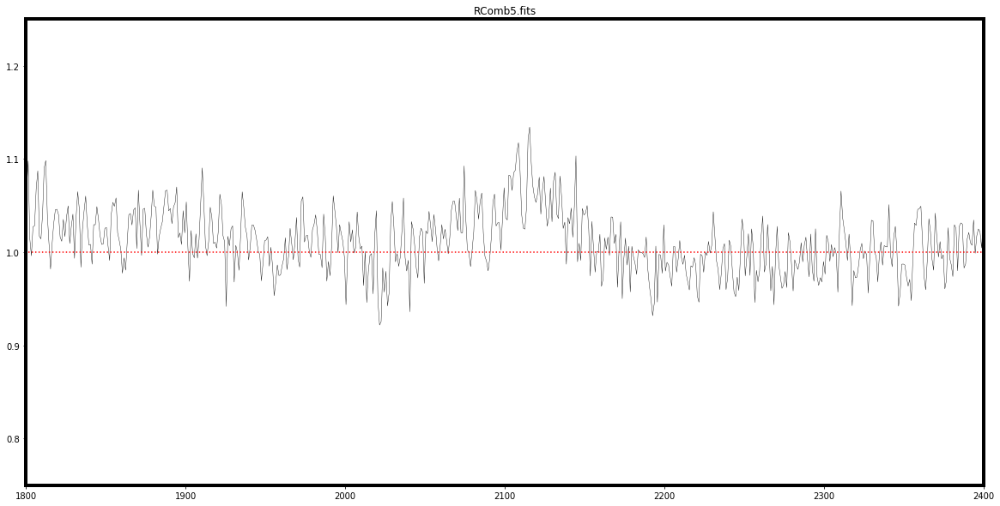

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


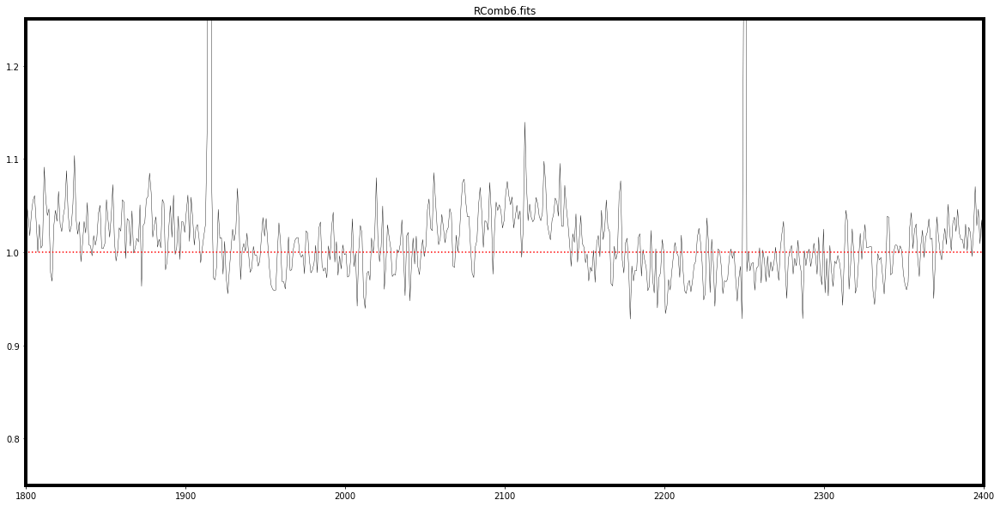

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


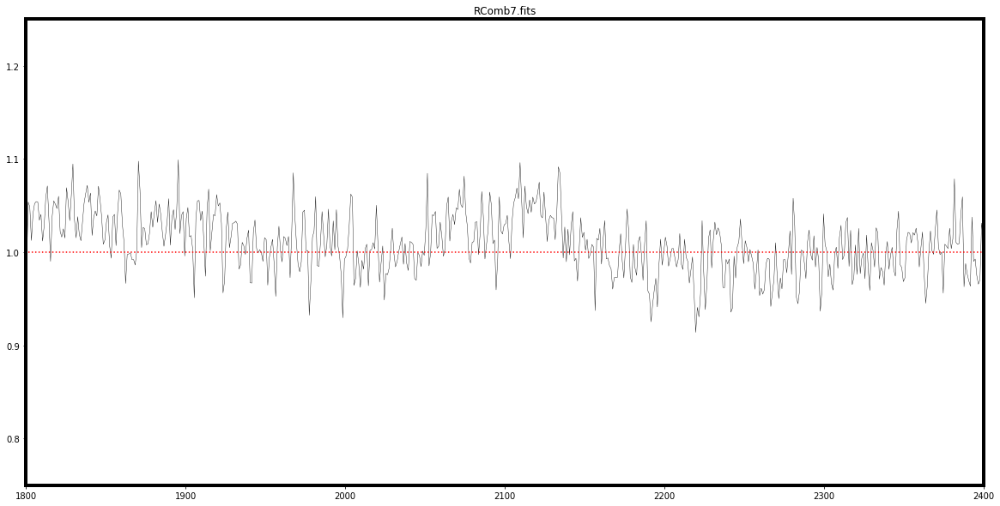

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


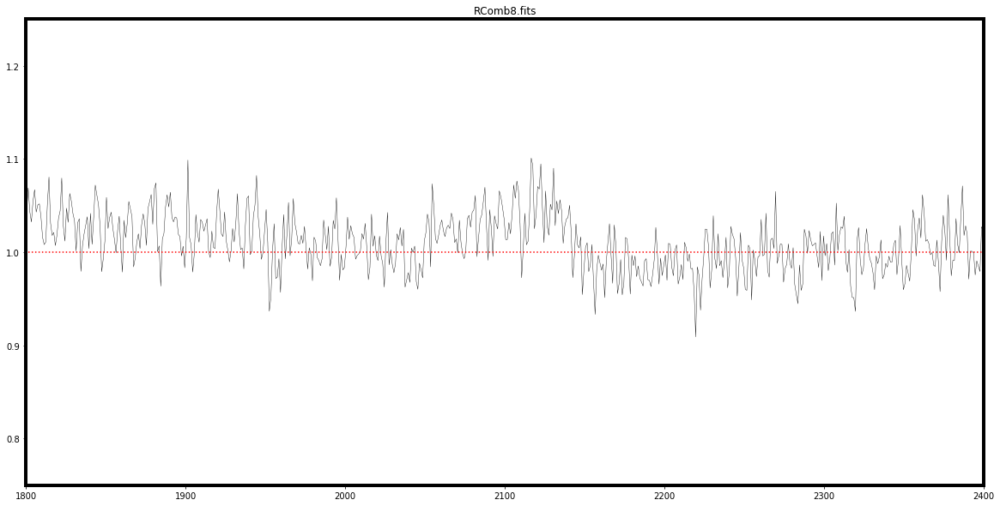

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


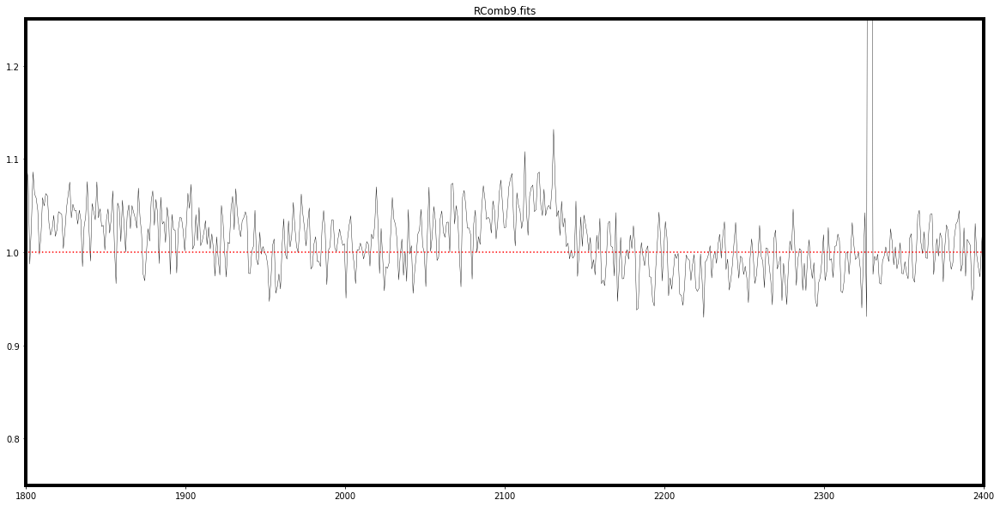

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


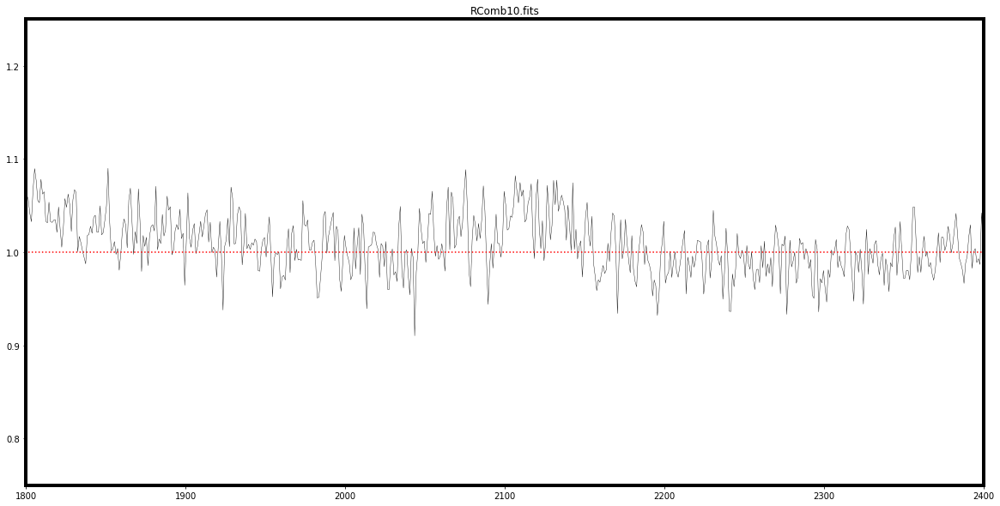

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


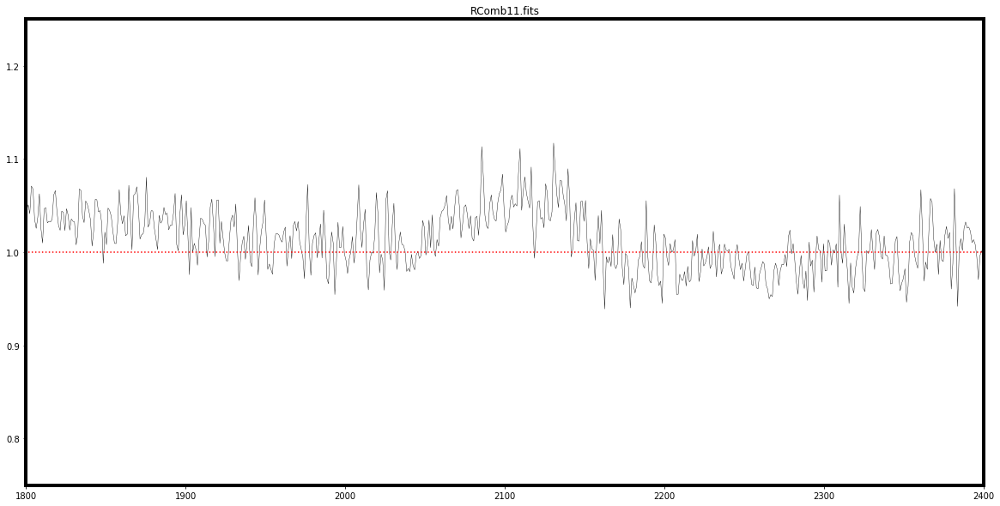

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


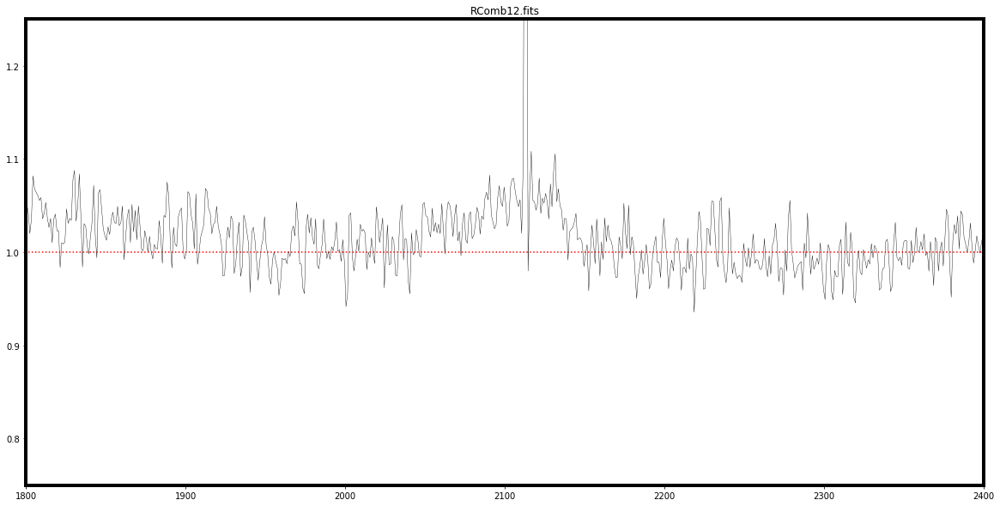

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


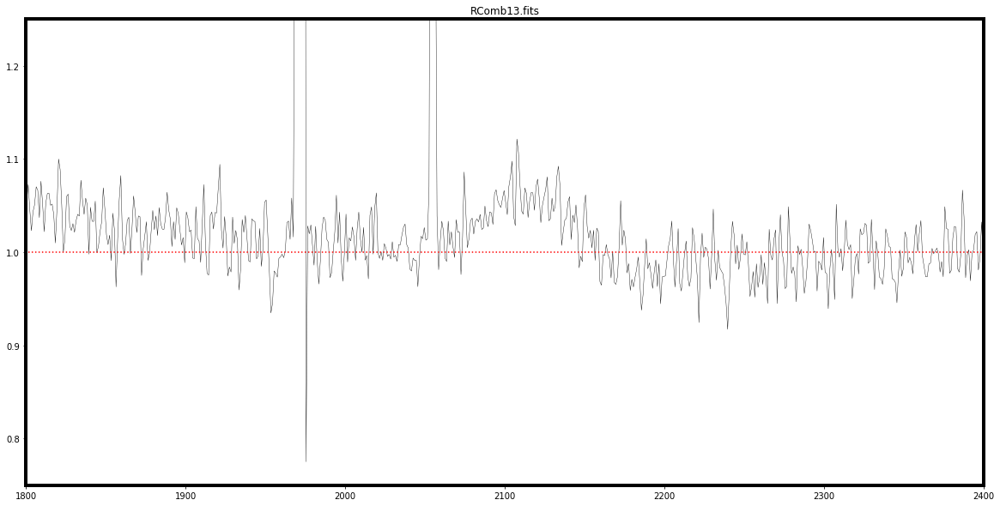

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


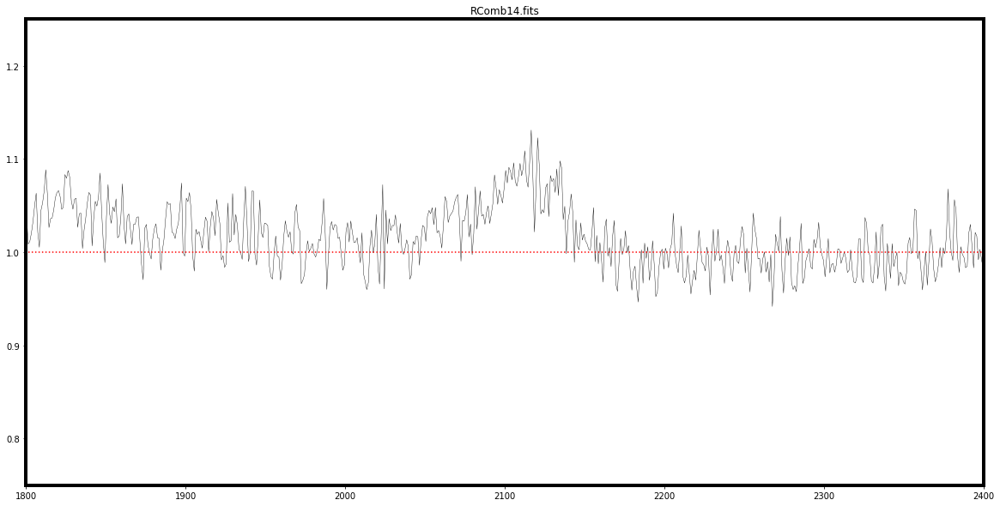

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


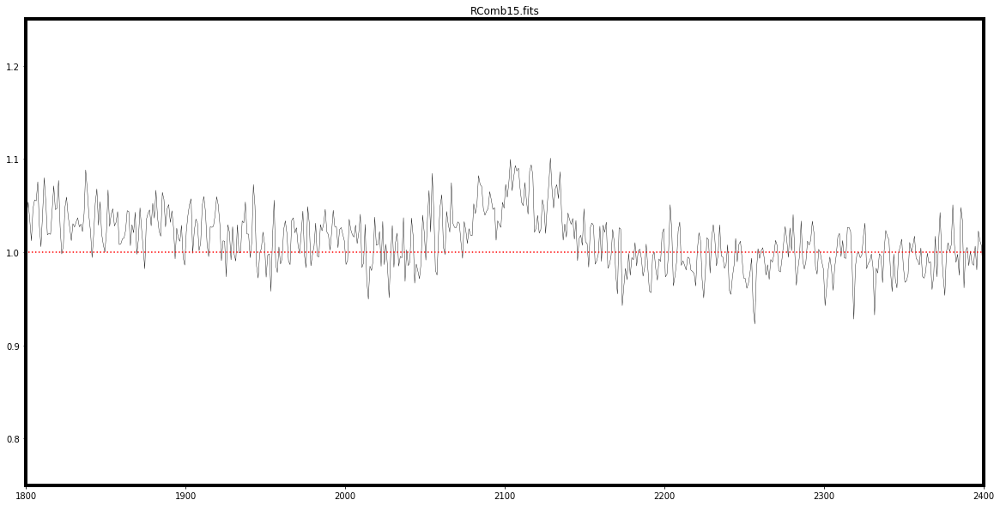

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


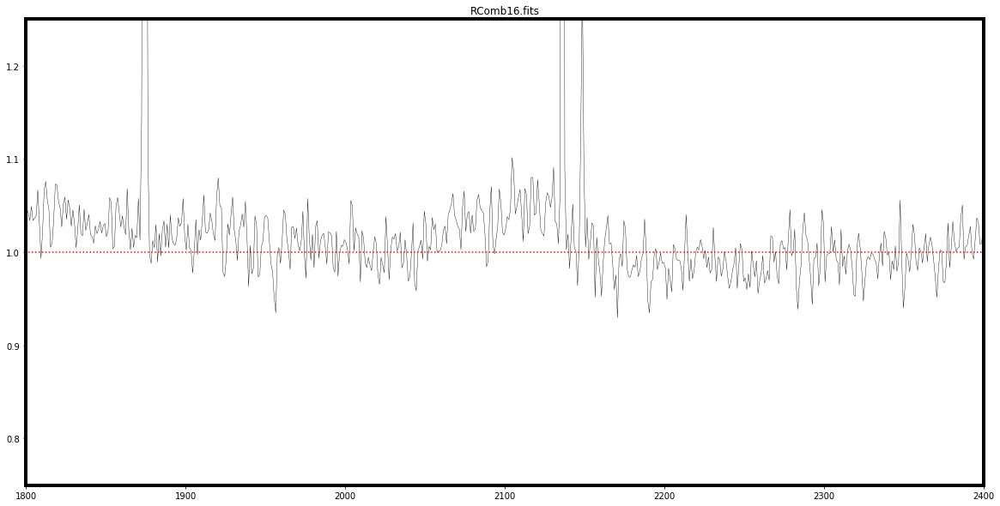

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


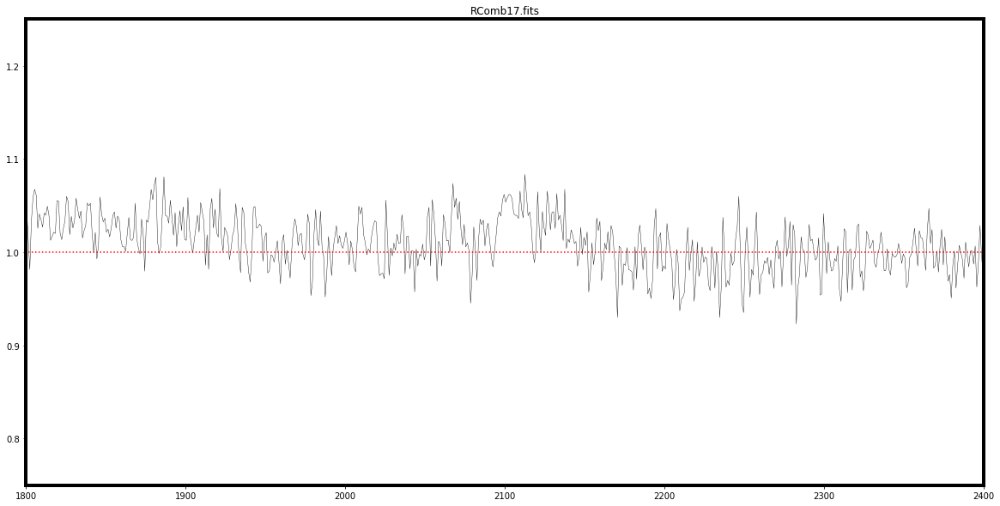

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


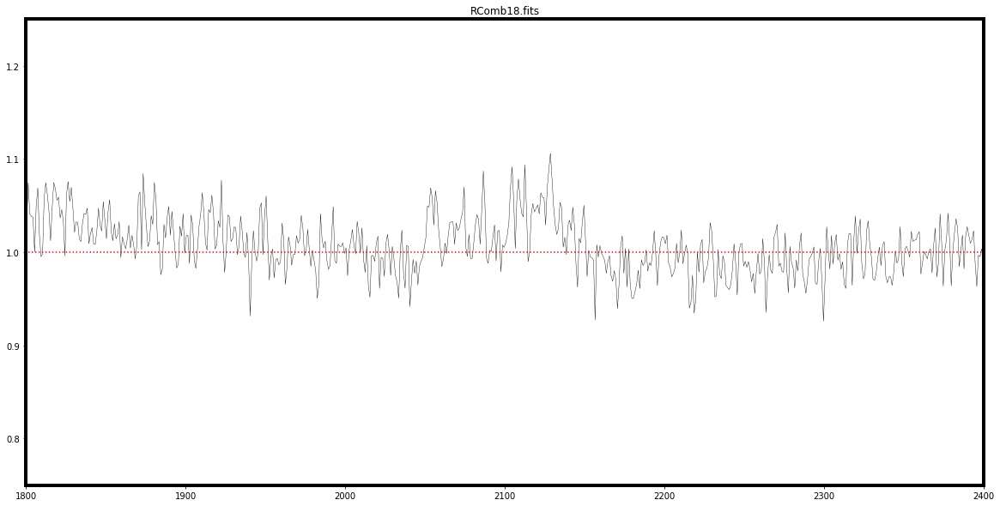

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


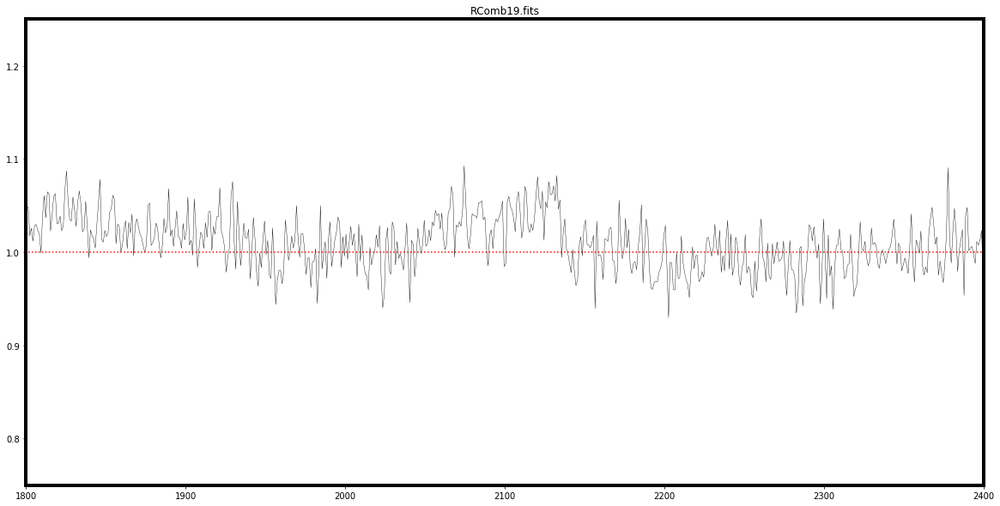

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


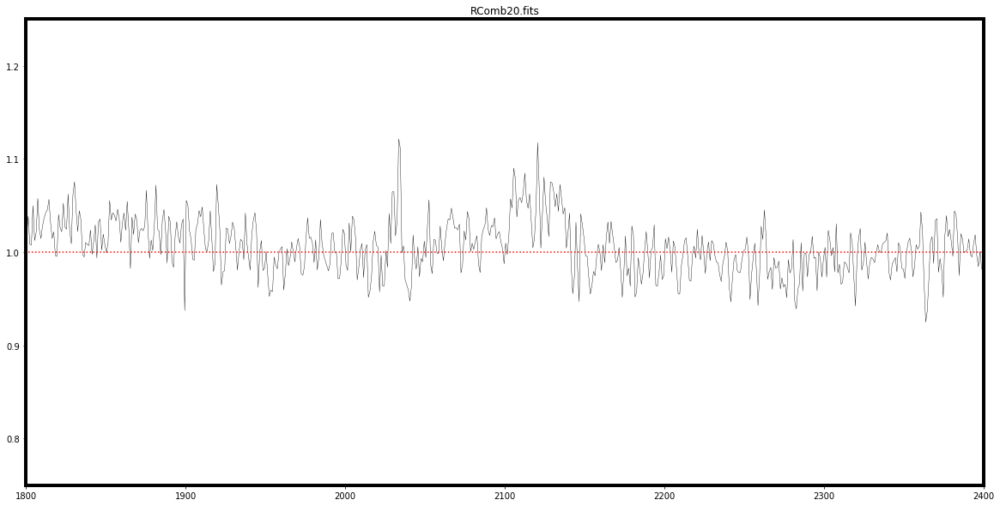

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


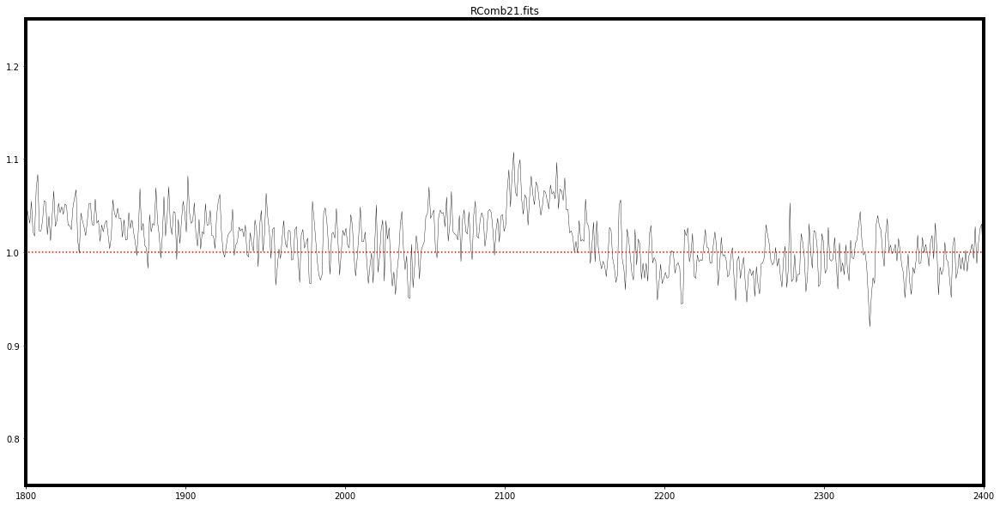

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


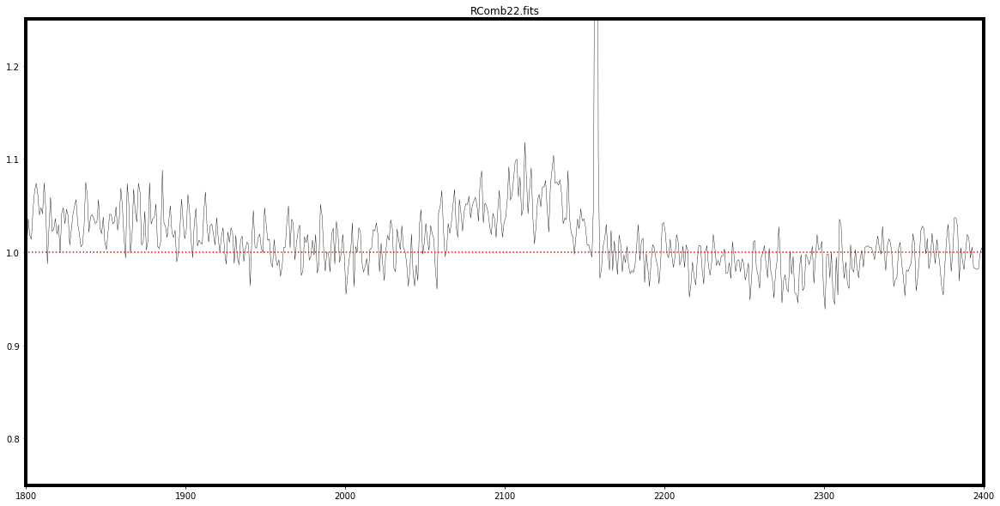

D:\conda\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
D:\conda\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
D:\conda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


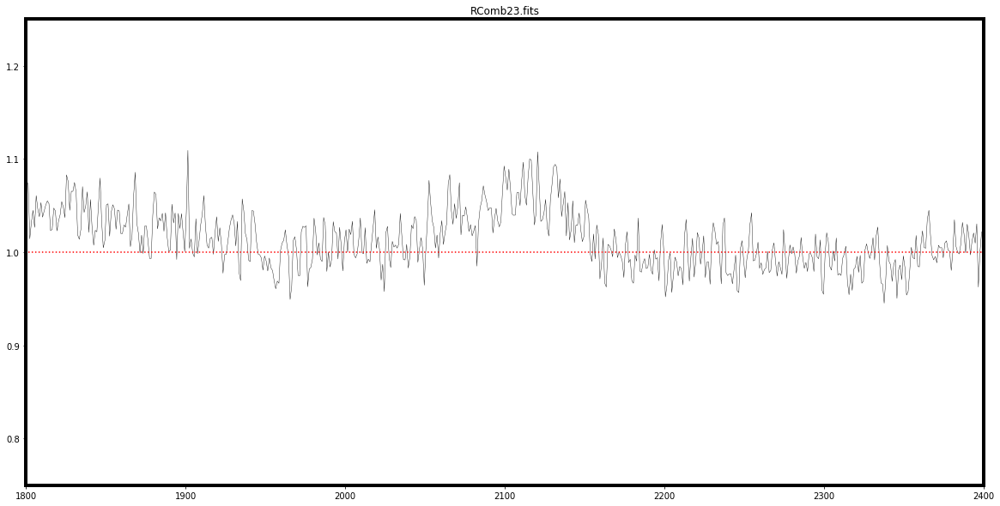

In [161]:
times = []
countGlob = 1
holder_array = []
path = 'C:/Users/Admin/newMay19/'
consts = []
with open(path+'RCombinedList.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        thisTime = hdul[0].header['ARCHIVEE']
        times.append(thisTime)
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()
        typeEx = np.clip(typeEx, 0, 1000) # <---- improve on this
        typeExBox = box_filter(20, typeEx)
        globalBox = box_filter(100, typeEx)
        count = 0
        for elB in typeExBox:
            if elB > (globalBox[count] +100):
                typeExBox[count] = globalBox[count]
            count +=1
        hdul.close()
        x = np.linspace(0,4200, 4200)
        x_in1 = np.linspace(1000,1475, 475)
        x_in2 = np.linspace(2190, 2418, 228)
        x_in3 = np.linspace(2678, 2732, 54)
            #x_in4 = np.linspace(3123, 3312, 189)
        x_temp = np.concatenate((x_in1, x_in2), axis=None)
        x_temp = np.concatenate((x_temp, x_in3), axis=None)
            #x_temp = np.concatenate((x_temp, x_in4), axis=None)
        y_1 = typeEx[1000:1475]
        y_2 = typeEx[2190:2418]
        y_3 = typeEx[2678:2732]
            #y_4 = typeEx[3123:3312]
        y_temp = np.concatenate((y_1, y_2), axis=None)
        y_temp = np.concatenate((y_temp, y_3), axis=None)
            #y_temp = np.concatenate((y_temp, y_4), axis=None)
            #constant = MSE(x_temp, y_temp)
            #y = constant -(0.30899*x) + (0.000036113*x*x)
        y_1b = typeExBox[1000:1475]
            
        mean = np.mean(y_1b)
        std = np.std(y_1b)
        lineFit = np.polyfit(x_in1, y_1b, 1)
        y_1g = x_in1 * lineFit[0] + lineFit[1]
        count =0
        for el in y_1b:
            if el > (y_1g[count] + (std)):
                y_1b[count] = y_1g[count]
                    
            count += 1
                    
                    
            
        y_2b = typeExBox[2190:2418]
            
        mean = np.mean(y_2b)
        std = np.std(y_2b)
        lineFit = np.polyfit(x_in2, y_2b, 1)
        y_2g = x_in2 * lineFit[0] + lineFit[1]
        count =0
        for el in y_2b:
            if el > (y_2g[count] + (std)):
                y_2b[count] = y_2g[count]
                    
            count += 1
            
        y_3b = typeExBox[2678:2732]
        mean = np.mean(y_3b)
        std = np.std(y_3b)
        lineFit = np.polyfit(x_in3, y_3b, 1)
        y_3g = x_in3 * lineFit[0] + lineFit[1]
        count =0
        for el in y_3b:
            if el > (y_3g[count] + (std)):
                y_3b[count] = y_3g[count]
                    
            count += 1
            #y_4 = typeEx[3123:3312]
        y_tempb = np.concatenate((y_1b, y_2b), axis=None)
        y_tempb = np.concatenate((y_tempb, y_3b), axis=None)
        w_in1 = (1/475)*np.ones(475)
        w_in2 = (1/228)*np.ones(228)
        w_in3 = (1/54)*np.ones(54)
            #w_in4 = (1/189)*np.ones(189)
        w_temp = np.concatenate((w_in1, w_in2), axis=None)
        w_temp = np.concatenate((w_temp, w_in3), axis=None)
        try:
            z = np.polyfit(x_temp, y_tempb, 2, w=w_temp)
        except:
            print(y_tempb)
        fitted = x*x*z[0]+x*z[1]+z[2]
            
        normedTypeEx = typeEx / fitted
        if countGlob == 1:
            holder_array = normedTypeEx[1000:3500]
        else:
            holder_array = np.vstack((holder_array, normedTypeEx[1000:3500]))
        countGlob +=1
        fig = plt.figure(figsize=(20,10))
        plt.ylim(0.75,1.25)
        plt.plot(x, normedTypeEx, 'k', lw=0.4)
        ones = np.ones_like(x)
        plt.plot(x, ones, 'r:')
        plt.xlim(1800,2400)
        plt.title(line)
            #plt.plot(x_in4, y_4, 'r', lw=0.2)
        plt.show()
          

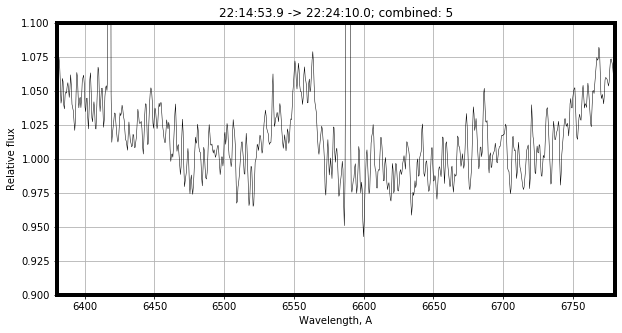

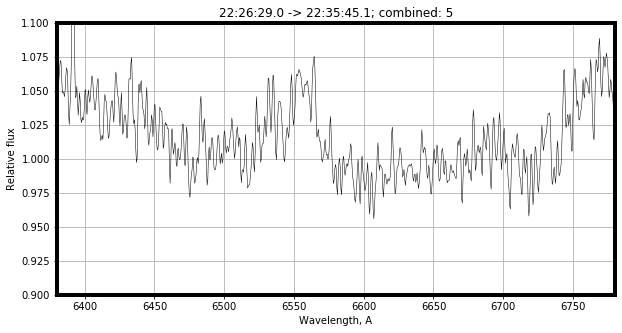

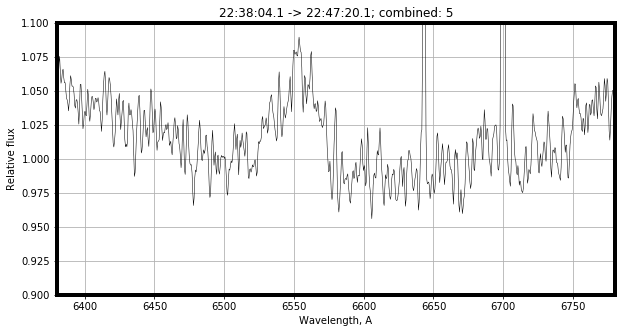

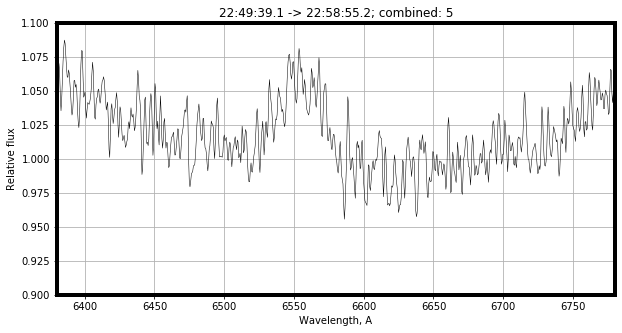

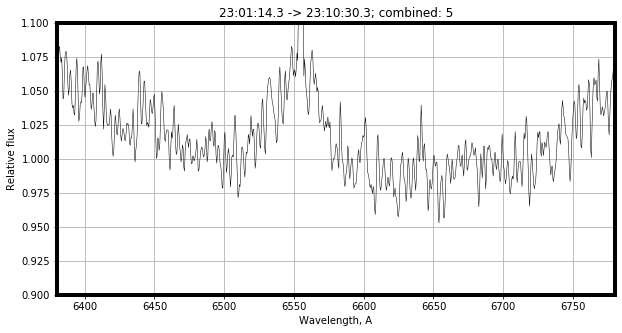

...

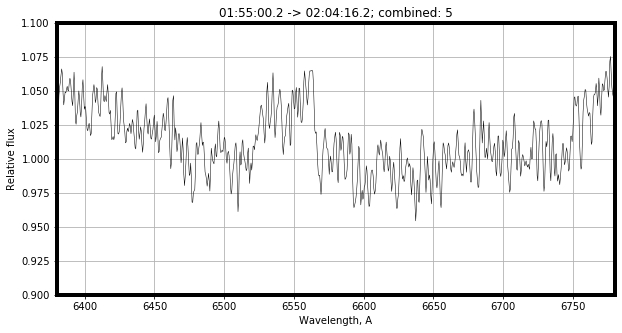

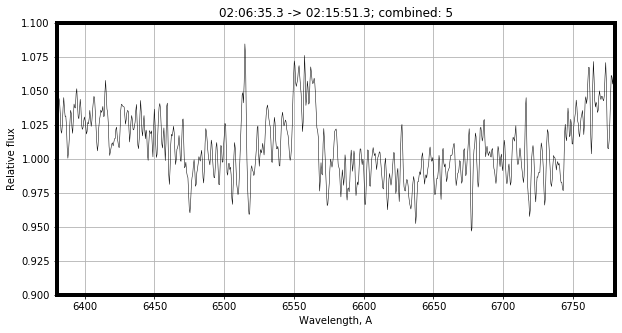

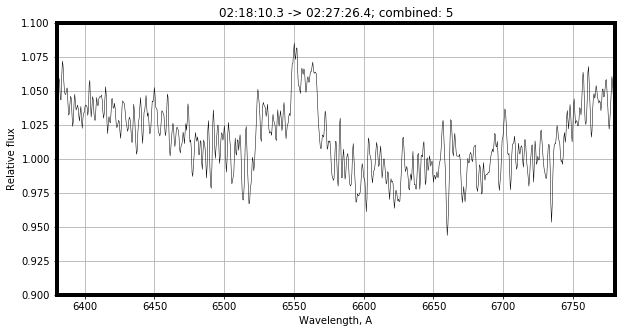

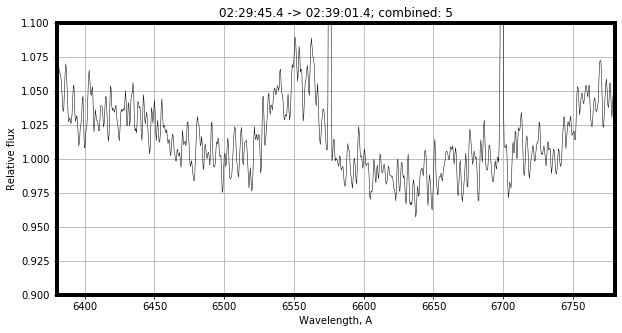

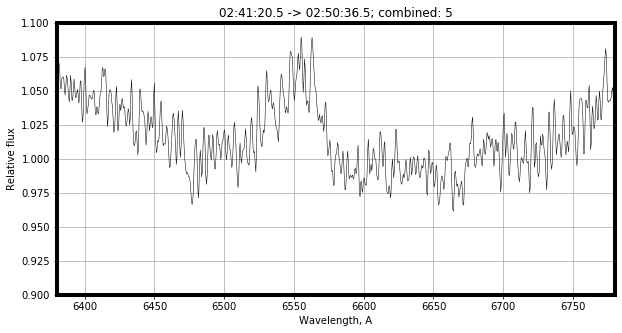

In [162]:

count = 0
data_plot = []
data_plot_read = []
dict_count = 0
path = 'C:/Users/Admin/newMay19/'
with open(path+'RCombinedList.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        comblist = [hdul[0].header['IMCMB001'], hdul[0].header['IMCMB002'], hdul[0].header['IMCMB003']]
        try:
            fourth = hdul[0].header['IMCMB004']
            fifth = hdul[0].header['IMCMB005']
            comblist.append(fourth)
            comblist.append(fifth)
        except KeyError:
            print('WRONG')
            pass
            
        
        inputfileS = comblist[0]
        inputfileS = inputfileS.replace(".ms.fits", ".fit")
        filepathIn = path + inputfileS
        hdulIn = fits.open(filepathIn)
        timeStart = hdulIn[0].header['UTOBS']
        hdulIn.close()
        inputfileF = comblist[-1]
        inputfileF = inputfileF.replace(".ms.fits", ".fit")
        filepathIn = path + inputfileF
        hdulIn = fits.open(filepathIn)
        timeFinish = hdulIn[0].header['UTOBS']
        hdulIn.close()
        #print(np.shape(hdul))
        data = holder_array[count]
        #print(np.shape(typeEx))
        #data = typeEx[:, 0]
        #data = data[0,:]
        data = gaussian_filter(data, sigma=1)
        xpoints = np.linspace(5515, 7580, 4200)
        xpoints = xpoints[1000:3500]
        hdul.close() #6380 6780
        startingID = find_nearest_id(xpoints, 6380)
        finishingID = find_nearest_id(xpoints, 6780)
        startingIDr = find_nearest_id(xpoints, 6525)
        finishingIDr = find_nearest_id(xpoints, 6570)
        
        if count ==0:
            data_plot = data[startingID: finishingID]
            globalDictionary[MJDTemp2[dict_count]] = data_plot
            data_plot_read = data[startingIDr: finishingIDr]
            
            count = 1
        else:
            globalDictionary[MJDTemp2[dict_count]] = data[startingID: finishingID]
            data_plot = np.vstack((data_plot, data[startingID: finishingID]))
            
            data_plot_read = np.vstack((data_plot_read, data[startingIDr: finishingIDr]))
            count = count+1
        plt.figure(figsize=(10,5))
        dict_count += 1
        plt.plot(xpoints,data, 'k-', linewidth=0.5)
        #plt.plot(x_range, cs(x_range), label='Cubic Spline')
        #print(avgSpl)
        #arrayT = np.asarray(cs(x_range))
        #idx = (np.abs(array - value)).argmin()
    
        #plt.plot(x_range, cs(x_range, 1)+1, label="S'")
        #plt.plot(xpoints, np.linspace(np.average(data), np.average(data), len(xpoints)))
        plt.xlim(6380, 6780)
        plt.ylim(0.9,1.1)
        plt.grid()
        titleStr = timeStart + " -> " + timeFinish + "; combined: " + str(len(comblist))
        plt.title(titleStr)
        plt.xlabel("Wavelength, A")
        plt.ylabel("Relative flux")
        line = line.replace(".ms.fits", "")
        plt.show()
        #print(len(data))

        plt.close()

In [144]:
for key in globalDictionary :
    print (key)

0.00349399999686284
0.012005999997199979
0.020575999999709892
0.028843999998935034
0.03688599999732105
0.044937999999092426
0.05298000000038883
0.06195599999919068
0.07061999999859836
0.07866399999766145
0.08671199999662349
0.09474999999656575
0.10305999999836786
0.11127999999735039
0.11932199999719159
0.1273659999962547
0.13541199999745004
0.14372599999769592
0.15194999999948777
0.15999199999932898
0.16803999999683583
0.17608199999667704
0.18271333333056342
289.0512699999963
289.05931399999827
289.06735999999944
289.07539999999864
289.08344799999907
289.0914899999989
289.09953399999796
289.10757999999623
289.11561999999685
289.123665999998
289.1317099999986
289.1397539999991
289.1477999999988
289.15583999999944
289.16389999999956
289.1719400000002
289.17998599999845
289.1880299999975
289.19607199999734
289.2041179999971
289.21215999999697
289.22020599999814
289.2282500000001
289.23629199999993


In [145]:
time = pointsX = np.linspace(0,300, 500000)
params = [0.0016080888119978137, 0.9989329927536545, 78.2463923683, 0.847927100158248]
flux = params[0]+params[1]*np.sin(params[2]*pointsX + params[3])
# ... and add some noise

# Obtain the phases with respect to some
# reference point (in this case T0=217.4)
phases = foldAt(time, (2*np.pi/params[2]), T0=0)

In [146]:
TimeDictionary = dict(zip(time, phases))
# do individual curves for each obs and check that phases line up!
randArr = []
for key in globalDictionary:
    randArr.append(key)
ObsPhases = []
anotherDict ={}
for key in globalDictionary :
    initialDif = 1
    for key2 in TimeDictionary:
        dif = abs(key-key2)
        if dif < initialDif:
            initialDif = dif
            phaseForThis = TimeDictionary[key2]
    ObsPhases.append(phaseForThis)
    anotherDict[key] = phaseForThis

In [147]:
print(ObsPhases)

[0.04483197011222266, 0.14943990037407556, 0.2540478306359284, 0.3586557608977813, 0.45579169614093046, 0.5603996264027833, 0.6575355616459324, 0.7696154869264891, 0.8816954122070458, 0.9788313474501948, 0.08343927771204762, 0.18057521295519674, 0.28518314321704974, 0.38231907846019864, 0.48692700872205164, 0.5840629439652008, 0.6886708742270538, 0.7932788044889068, 0.8904147397320556, 0.9950226699939084, 0.09215860523705777, 0.18929454048020666, 0.2789584807046519, 0.6410722555638131, 0.745680185825222, 0.8428161210681537, 0.9399520563110855, 0.044559986573403876, 0.14169592181679036, 0.24630385207819927, 0.343439787321131, 0.4405757225645175, 0.5451836528268359, 0.6423195880697676, 0.7469275183311765, 0.844063453574563, 0.9411993888174948, 0.04580731907981317, 0.1429432543227449, 0.24755118458415382, 0.3446871198275403, 0.44182305507138153, 0.5464309853327904, 0.6435669205757222, 0.7481748508380406, 0.8453107860814271, 0.949918716342836]


In [148]:
import os.path


def plotSides(phaseJul, phaseMay):

    plt.figure(figsize=(20,10))
    JulPhase = phaseJul

    for time, phase in anotherDict.items():
        if np.isclose(phase,JulPhase):
            JulIn = time
            print(phase,'-----------' ,JulPhase)

    plt.subplot(1, 2, 1)
    datJul = globalDictionary[JulIn]
    julxpoints = np.linspace(6380,6780, len(datJul))
    plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
    plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
    plt.xlim(6450, 6650)
    plt.ylim(0.94,1.1)
    plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
    plt.ylabel('Relative Flux', fontsize=16)
    plt.grid(alpha=0.3)
    MayPhase = phaseMay

    for time, phase in anotherDict.items():
        if np.isclose(phase,MayPhase):
            MayIn = time
            print(phase,'-----------' ,MayPhase)

    plt.subplot(1, 2, 2)
    print('May in is', MayIn)
    datMay = globalDictionary[MayIn]
    mayxpoints = np.linspace(6380,6780, len(datMay))
    plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
    plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
    print('What',len(datMay))
    plt.xlim(6450, 6650)
    plt.ylim(0.94,1.1)
    plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
    plt.grid(alpha=0.3)
    plt.show()
   # plt.savefig(path, dpi=200)

0.04483197011222266 ----------- 0.04483197011222266
0.044559986573403876 ----------- 0.044559986573403876
May in is 289.08344799999907
What 813


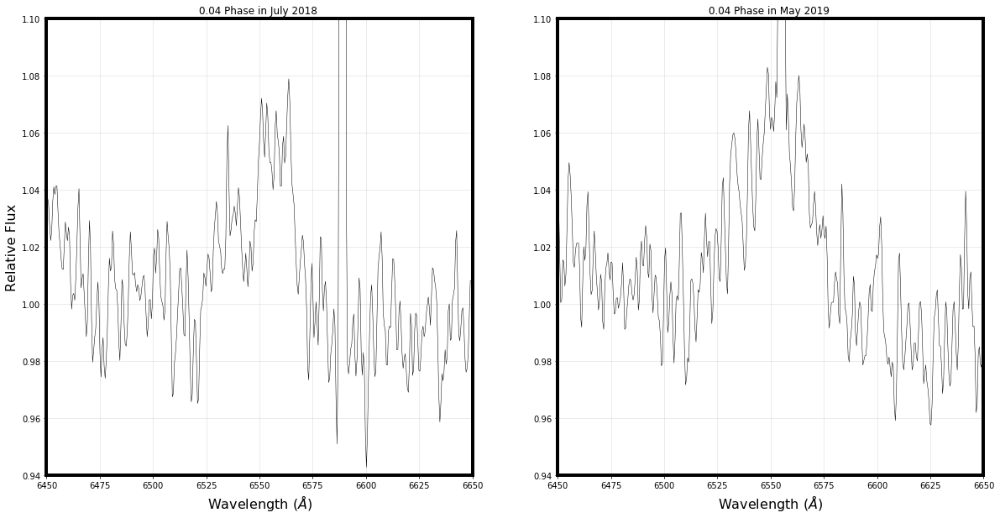

In [149]:
plt.figure(figsize=(20,10))
JulPhase = 0.04483197011222266

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.044559986573403876

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.14943990037407556 ----------- 0.14943990037407556
0.14169592181679036 ----------- 0.14169592181679036
May in is 289.0914899999989
What 813


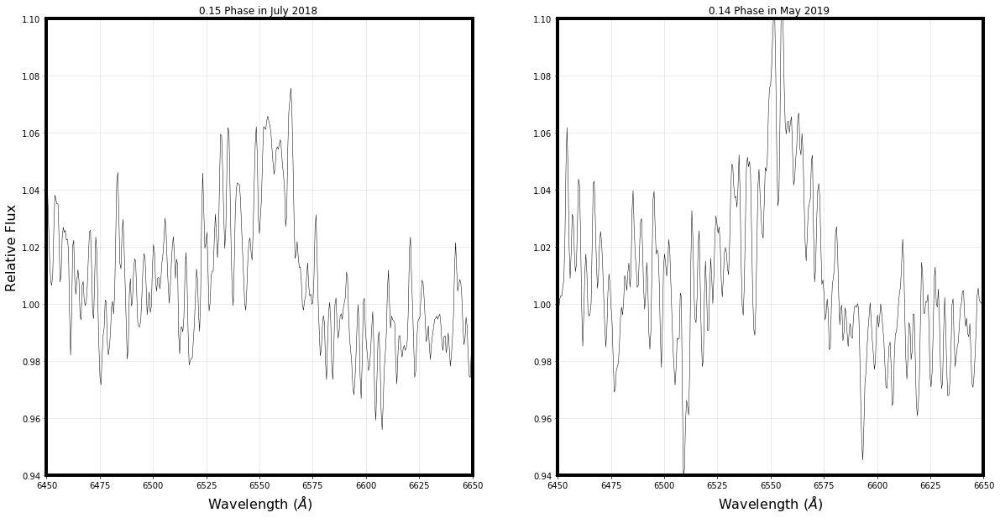

In [150]:
plt.figure(figsize=(20,10))
JulPhase = 0.14943990037407556

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.14169592181679036

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.2540478306359284 ----------- 0.2540478306359284
0.24630385207819927 ----------- 0.24630385207819927
May in is 289.09953399999796
What 813


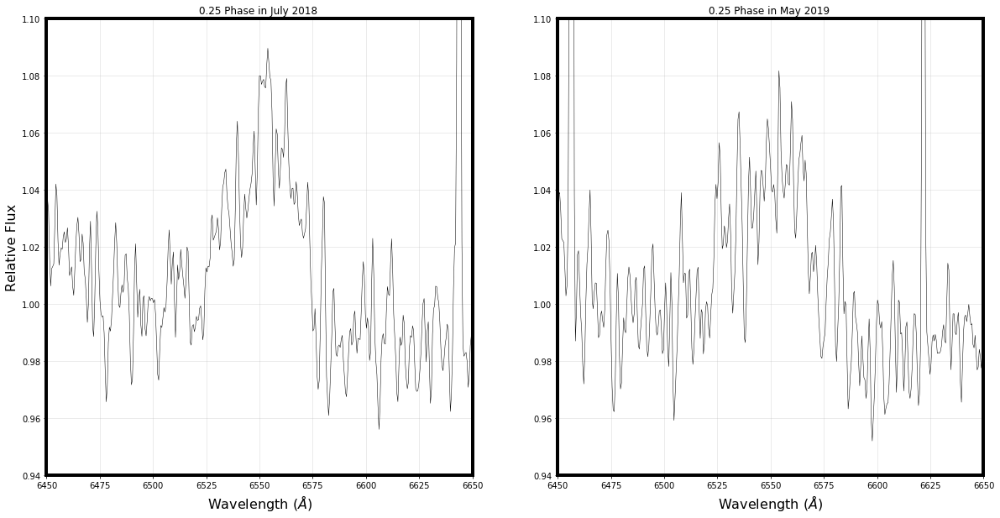

In [151]:
plt.figure(figsize=(20,10))
JulPhase = 0.2540478306359284

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.24630385207819927

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.3586557608977813 ----------- 0.3586557608977813
0.343439787321131 ----------- 0.343439787321131
May in is 289.10757999999623
What 813


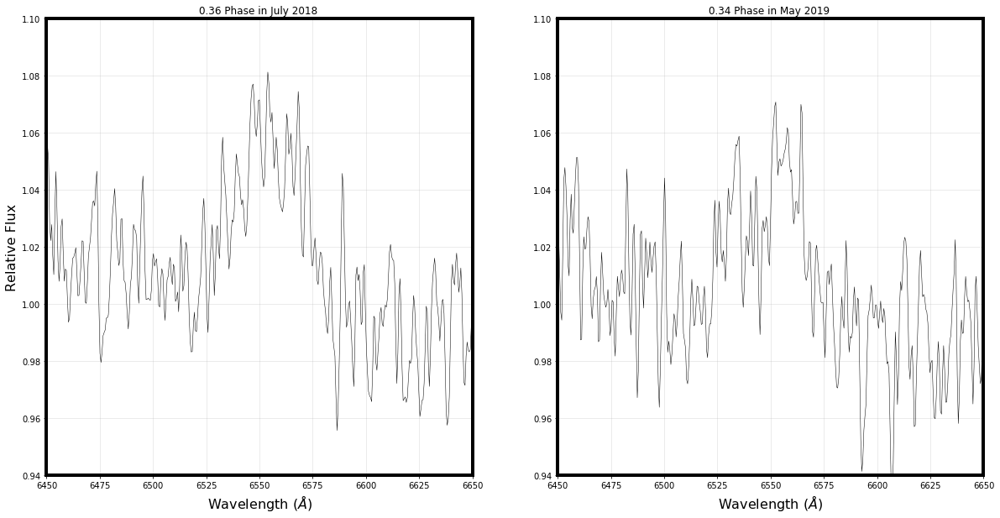

In [152]:
plt.figure(figsize=(20,10))
JulPhase = 0.3586557608977813

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.343439787321131

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.45579169614093046 ----------- 0.45579169614093046
0.4405757225645175 ----------- 0.4405757225645175
May in is 289.11561999999685
What 813


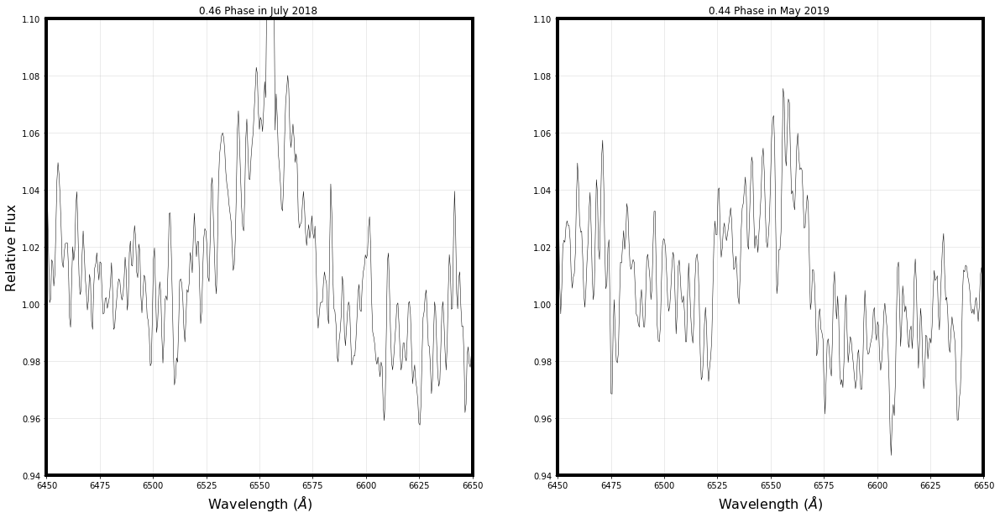

In [153]:
plt.figure(figsize=(20,10))
JulPhase = 0.45579169614093046

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.4405757225645175

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.5603996264027833 ----------- 0.5603996264027833
0.5451836528268359 ----------- 0.5451836528268359
May in is 289.123665999998
What 813


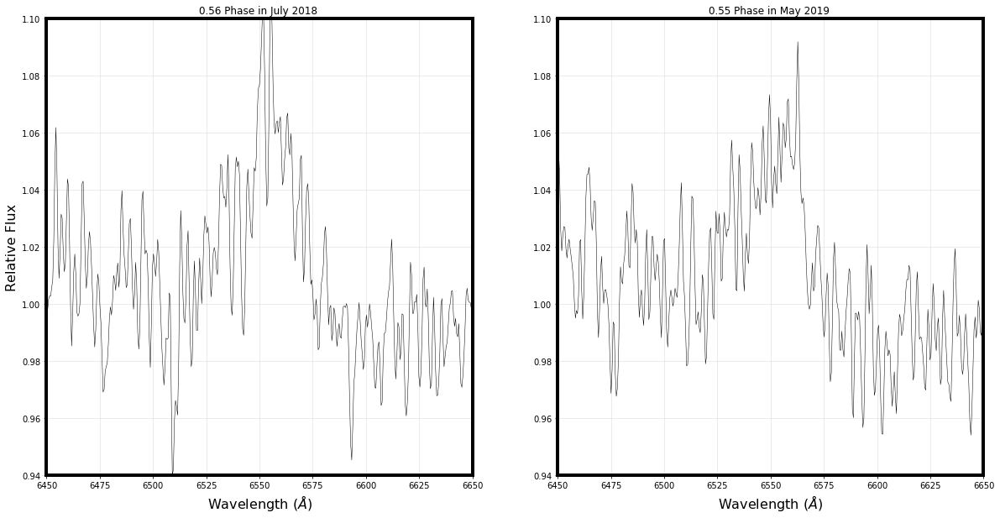

In [154]:
plt.figure(figsize=(20,10))
JulPhase = 0.5603996264027833

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.5451836528268359

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.6575355616459324 ----------- 0.6575355616459324
0.6423195880697676 ----------- 0.6423195880697676
May in is 289.1317099999986
What 813


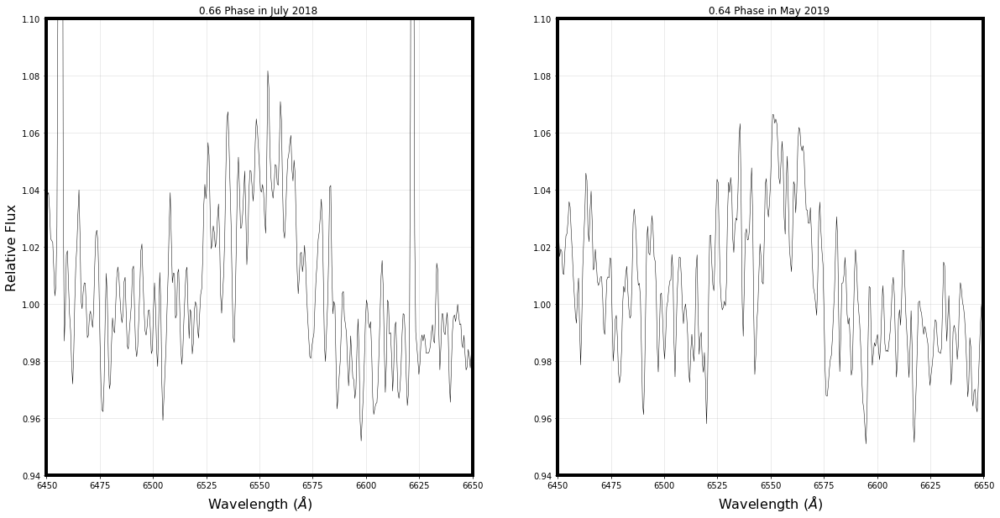

In [155]:
plt.figure(figsize=(20,10))
JulPhase = 0.6575355616459324

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.6423195880697676

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.7696154869264891 ----------- 0.7696154869264891
0.7469275183311765 ----------- 0.7469275183311765
May in is 289.1397539999991
What 813


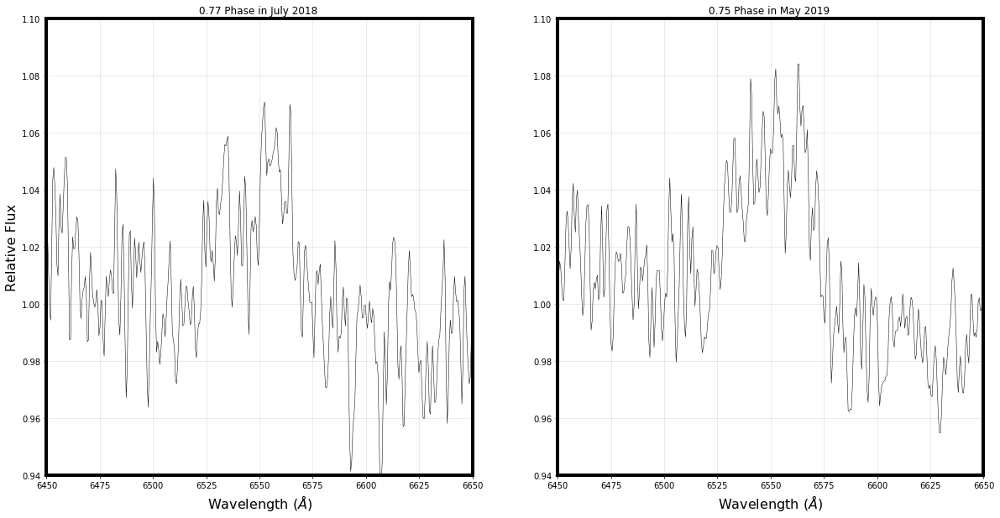

In [156]:
plt.figure(figsize=(20,10))
JulPhase = 0.7696154869264891

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.7469275183311765

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.8816954122070458 ----------- 0.8816954122070458
0.844063453574563 ----------- 0.844063453574563
May in is 289.1477999999988
What 813


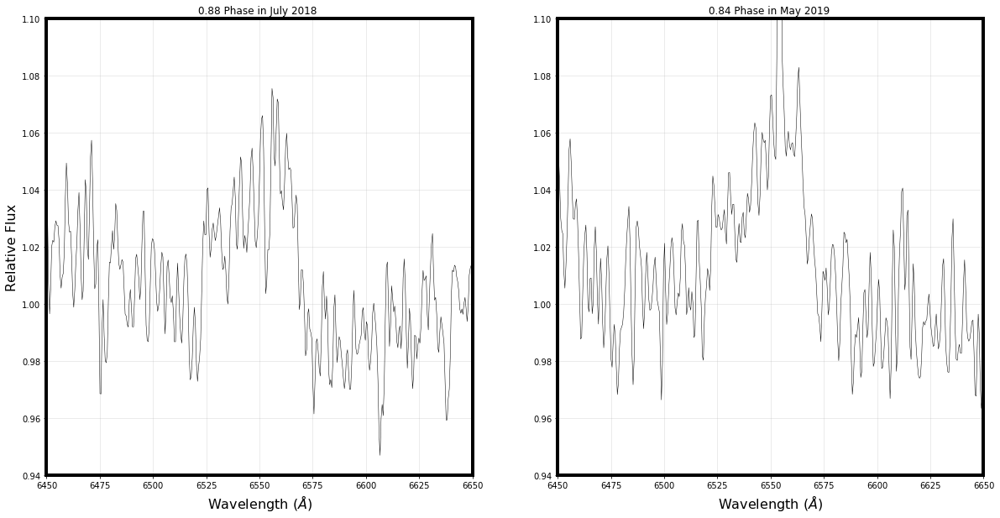

In [157]:
plt.figure(figsize=(20,10))
JulPhase = 0.8816954122070458

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.844063453574563

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.9788313474501948 ----------- 0.9788313474501948
0.9411993888174948 ----------- 0.9411993888174948
May in is 289.15583999999944
What 813


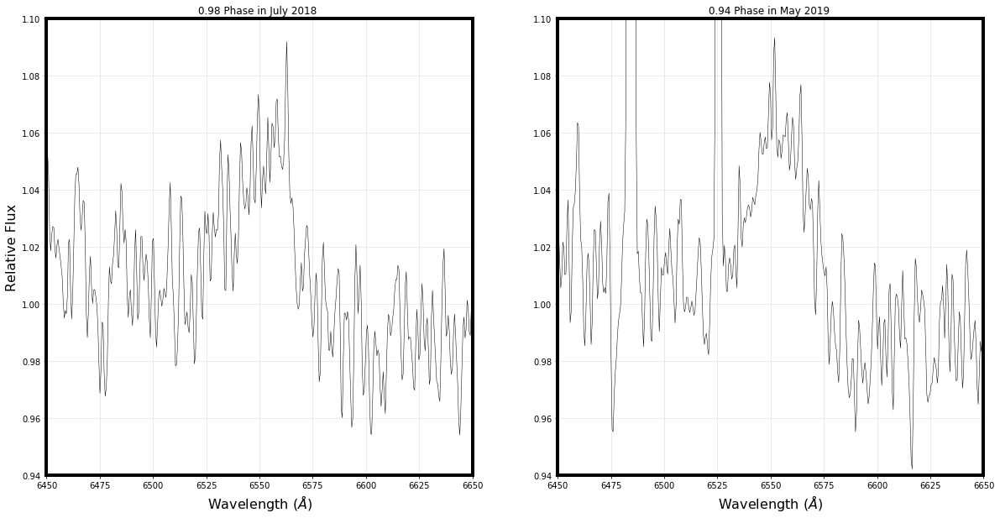

In [158]:
plt.figure(figsize=(20,10))
JulPhase = 0.9788313474501948   

for time, phase in anotherDict.items():
    if np.isclose(phase,JulPhase):
        JulIn = time
        print(phase,'-----------' ,JulPhase)

plt.subplot(1, 2, 1)
datJul = globalDictionary[JulIn]
julxpoints = np.linspace(6380,6780, len(datJul))
plt.plot(julxpoints,datJul, 'k-', linewidth=0.5)
plt.title(str(np.round(JulPhase, decimals=2)) + ' Phase in July 2018 ')
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.grid(alpha=0.3)
MayPhase = 0.9411993888174948

for time, phase in anotherDict.items():
    if np.isclose(phase,MayPhase):
        MayIn = time
        print(phase,'-----------' ,MayPhase)

plt.subplot(1, 2, 2)
print('May in is', MayIn)
datMay = globalDictionary[MayIn]
mayxpoints = np.linspace(6380,6780, len(datMay))
plt.plot(mayxpoints,datMay, 'k-', linewidth=0.5)
plt.title(str(np.round(MayPhase, decimals=2)) +' Phase in May 2019 ' )
print('What',len(datMay))
plt.xlim(6450, 6650)
plt.ylim(0.94,1.1)
plt.xlabel(r"Wavelength ($\AA$)", fontsize=16)
plt.grid(alpha=0.3)
path = '/home/nwal/Desktop/Random-Astro-master/comp/Fixed26.png'
#plt.savefig(path, dpi=200)

0.04483197011222266 ----------- 0.04483197011222266
0.044559986573403876 ----------- 0.044559986573403876
May in is 289.08344799999907
What 813
0.08343927771204762 ----------- 0.08343927771204762
0.04580731907981317 ----------- 0.04580731907981317
May in is 289.16389999999956
What 813
0.14943990037407556 ----------- 0.14943990037407556
0.14169592181679036 ----------- 0.14169592181679036
May in is 289.0914899999989
What 813
0.18057521295519674 ----------- 0.18057521295519674
0.1429432543227449 ----------- 0.1429432543227449
May in is 289.1719400000002
What 813
0.2540478306359284 ----------- 0.2540478306359284
0.24630385207819927 ----------- 0.24630385207819927
May in is 289.09953399999796
What 813
0.28518314321704974 ----------- 0.28518314321704974
0.24755118458415382 ----------- 0.24755118458415382
May in is 289.17998599999845
What 813
0.3586557608977813 ----------- 0.3586557608977813
0.343439787321131 ----------- 0.343439787321131
May in is 289.10757999999623
What 813
0.38231907846019

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.09215860523705777 ----------- 0.09215860523705777
0.044559986573403876 ----------- 0.044559986573403876
May in is 289.08344799999907
What 813


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.18929454048020666 ----------- 0.18929454048020666
0.14169592181679036 ----------- 0.14169592181679036
May in is 289.0914899999989
What 813


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.2789584807046519 ----------- 0.2789584807046519
0.24630385207819927 ----------- 0.24630385207819927
May in is 289.09953399999796
What 813


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.6575355616459324 ----------- 0.6575355616459324
0.6410722555638131 ----------- 0.6410722555638131
May in is 289.0512699999963
What 813


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.7696154869264891 ----------- 0.7696154869264891
0.745680185825222 ----------- 0.745680185825222
May in is 289.05931399999827
What 813


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.8816954122070458 ----------- 0.8816954122070458
0.8428161210681537 ----------- 0.8428161210681537
May in is 289.06735999999944
What 813


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.9788313474501948 ----------- 0.9788313474501948
0.9399520563110855 ----------- 0.9399520563110855
May in is 289.07539999999864
What 813


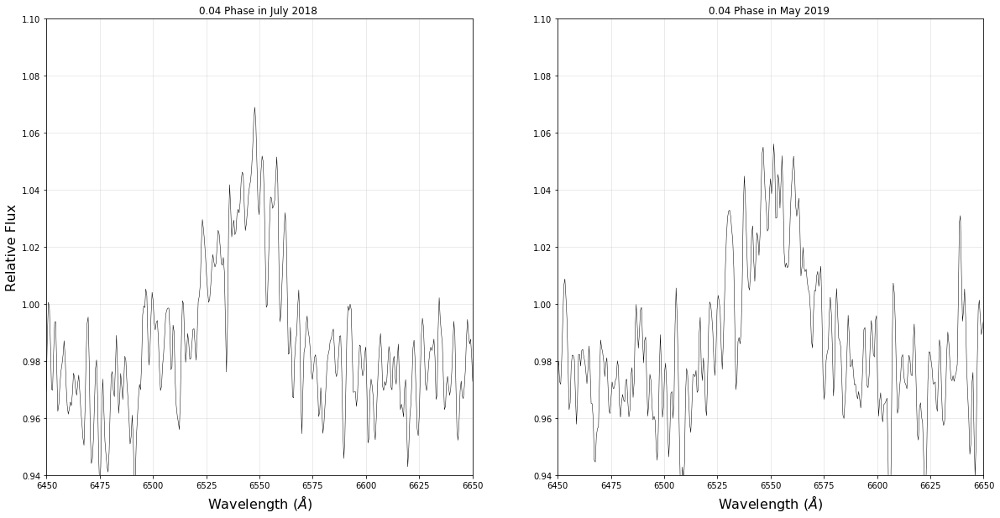

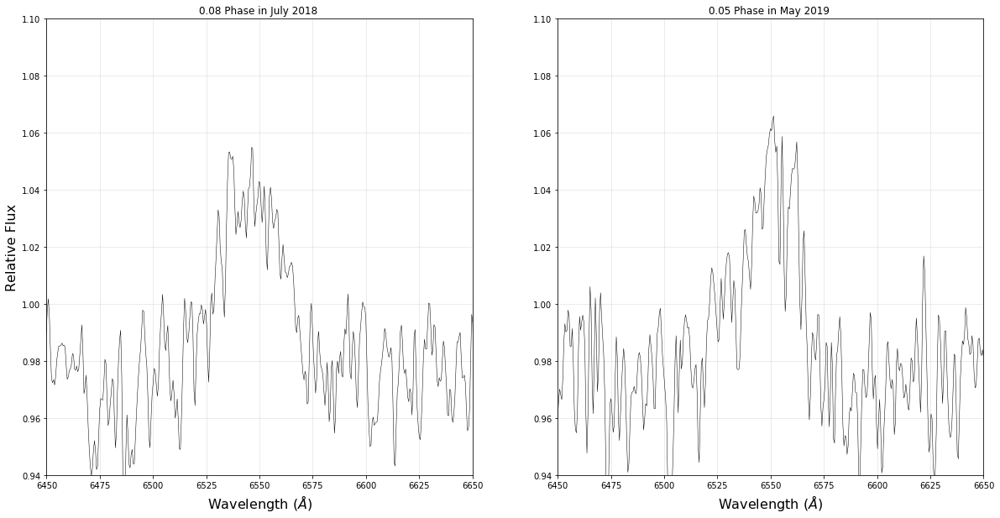

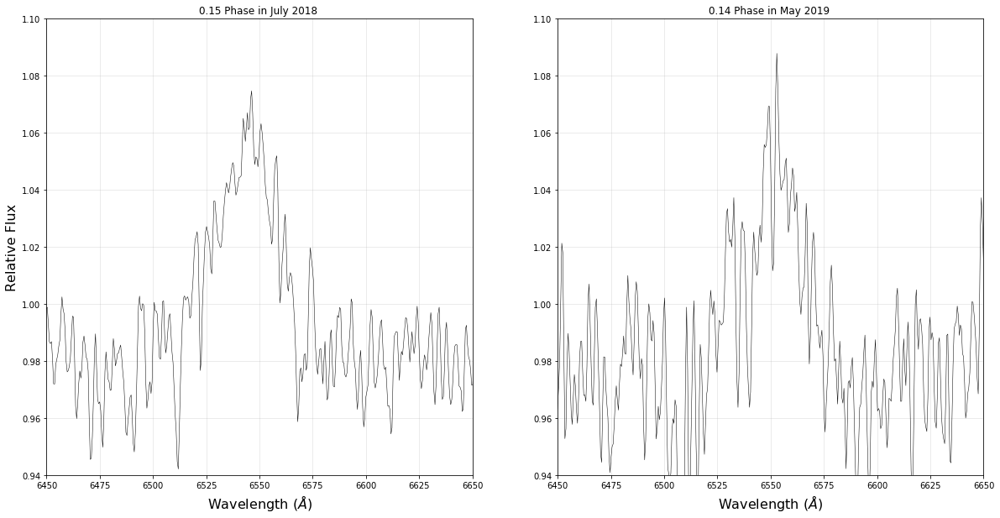

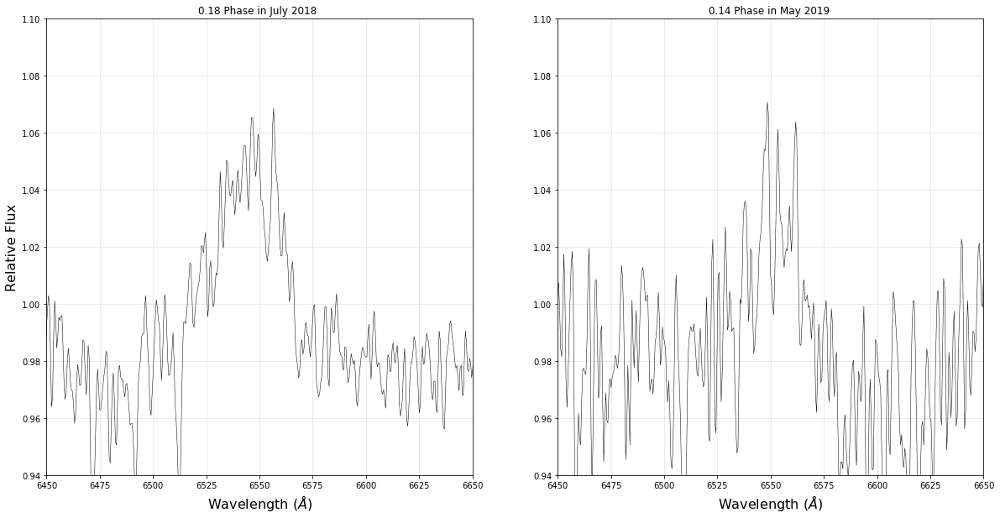

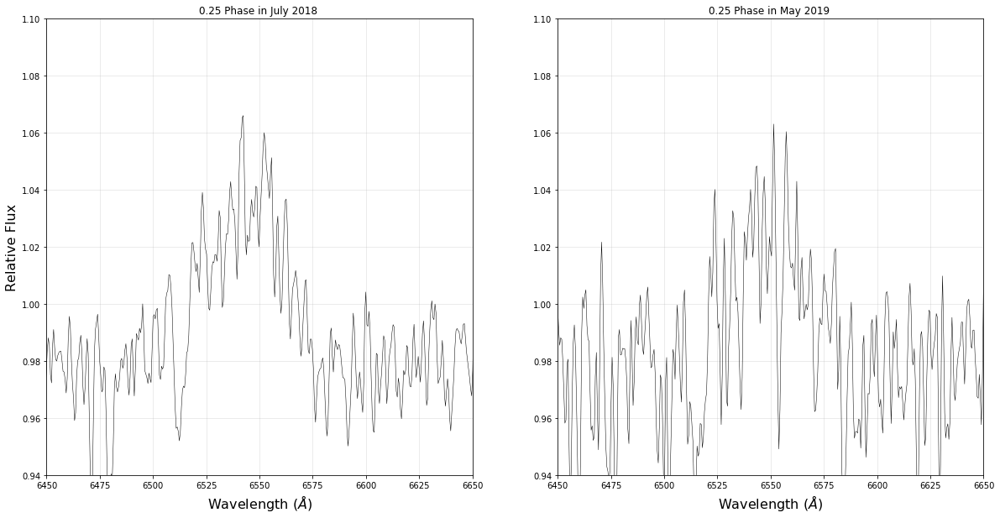

...

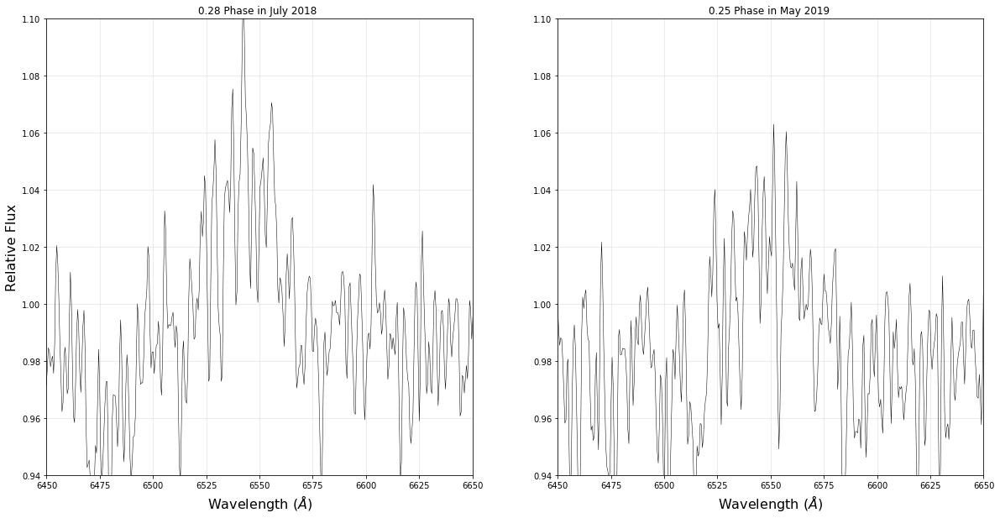

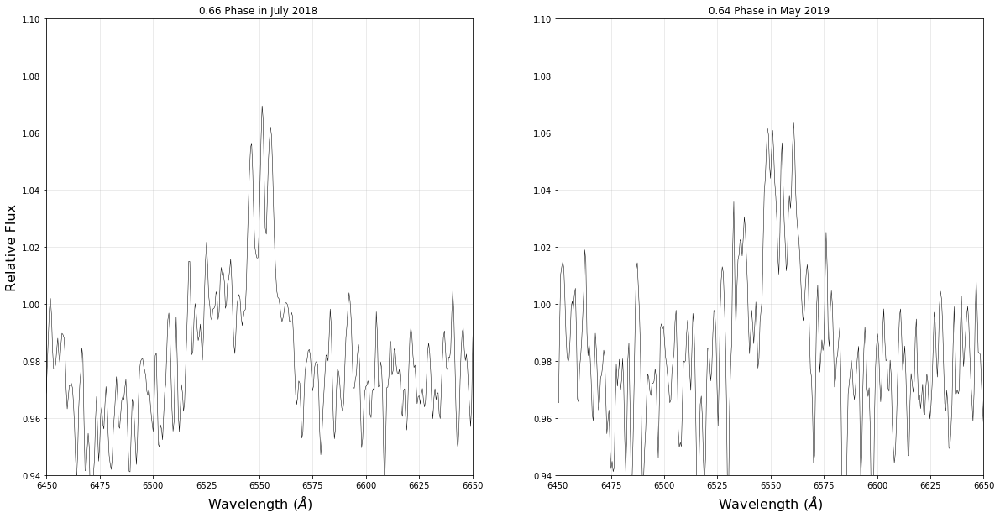

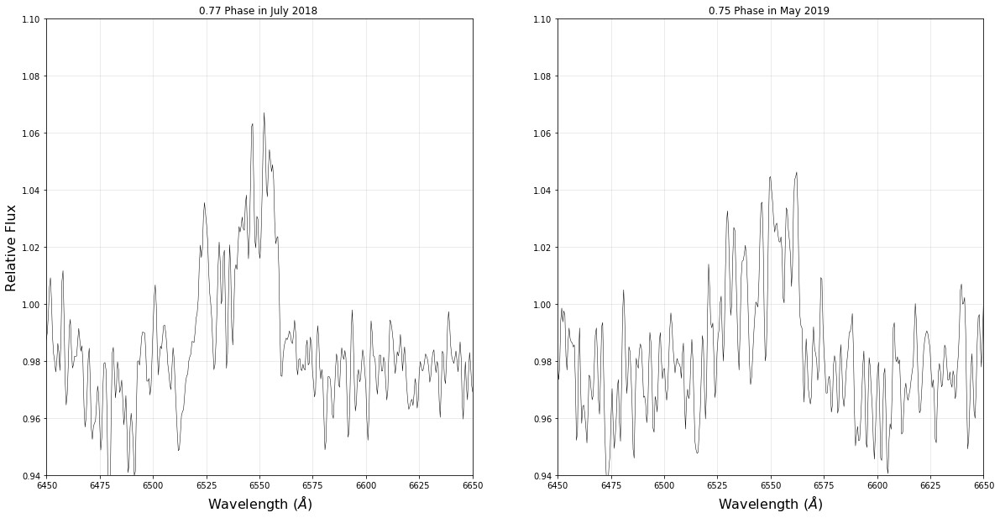

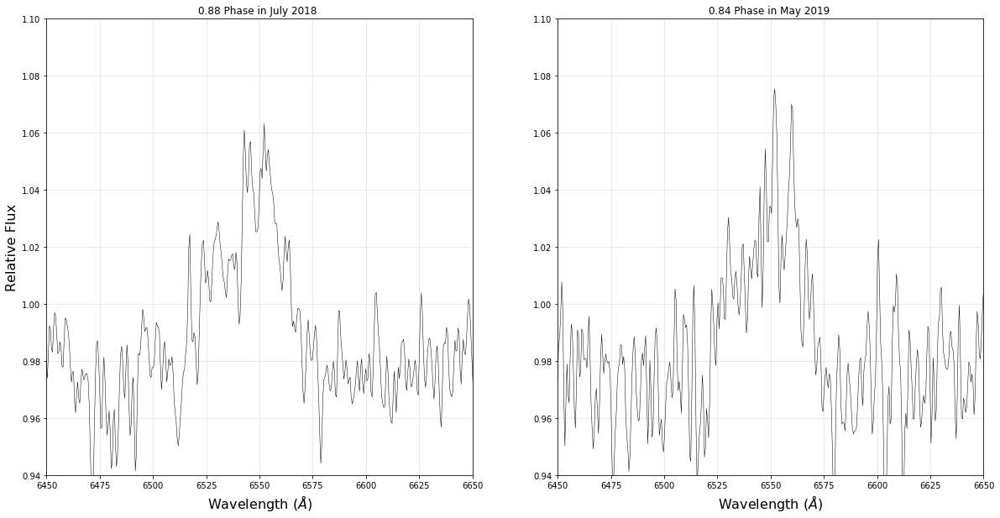

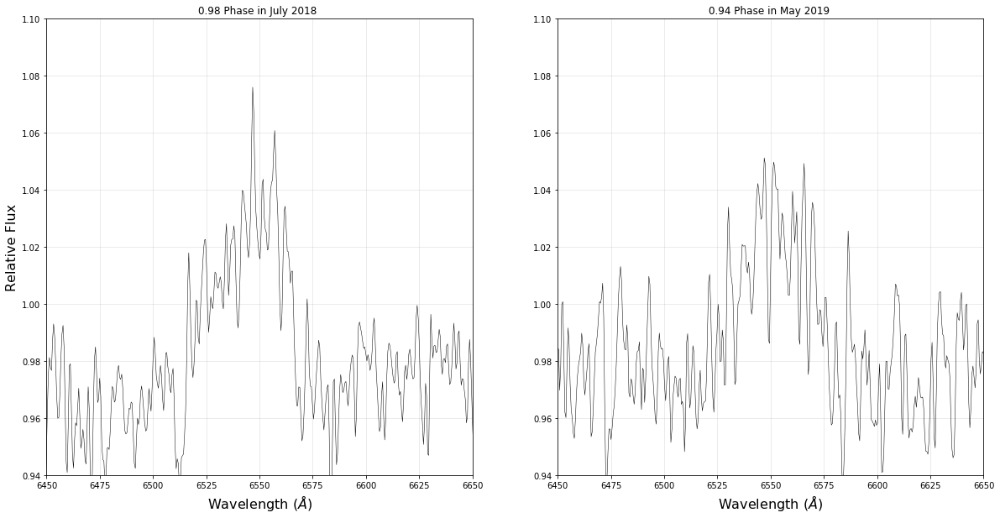

In [70]:
plotSides(0.04483197011222266, 0.044559986573403876)
plotSides(0.08343927771204762,0.04580731907981317)
plotSides(0.14943990037407556, 0.14169592181679036)
plotSides(0.18057521295519674,0.1429432543227449)
plotSides(0.2540478306359284, 0.24630385207819927)
plotSides(0.28518314321704974,0.24755118458415382)
plotSides(0.3586557608977813, 0.343439787321131)
plotSides(0.38231907846019864,0.3446871198275403)
plotSides(0.45579169614093046, 0.4405757225645175)
plotSides(0.48692700872205164,0.44182305507138153)
plotSides(0.5603996264027833, 0.5451836528268359)
plotSides(0.5840629439652008 , 0.5464309853327904)
plotSides(0.6575355616459324, 0.6423195880697676)
plotSides(0.6886708742270538 , 0.6435669205757222)
plotSides(0.7696154869264891, 0.7469275183311765)
plotSides(0.7932788044889068 , 0.7481748508380406)
plotSides(0.8816954122070458, 0.844063453574563)
plotSides(0.8904147397320556 , 0.8453107860814271)
plotSides(0.9788313474501948, 0.9411993888174948)
plotSides(0.9950226699939084 , 0.949918716342836)
plotSides(0.09215860523705777,0.044559986573403876)
plotSides(0.18929454048020666,0.14169592181679036)
plotSides(0.2789584807046519 , 0.24630385207819927)
plotSides(0.6575355616459324 ,  0.6410722555638131 )    
plotSides(0.7696154869264891 ,  0.745680185825222)
plotSides(0.8816954122070458 ,  0.8428161210681537)
plotSides(0.9788313474501948 ,  0.9399520563110855)